In [1]:
import time
import os
import numpy as np
import matplotlib.pyplot as plt
import qcodes as qc
import qcodes.instrument_drivers.nplab_drivers as npd

In [3]:
%matplotlib notebook

In [4]:
npd.triton_init('lockin865', 'lockin830', 'srframe', 'srdc')
station = qc.Station(triton, lockin865, lockin830, srframe, srdc)

Connected to: OXFORD INSTRUMENTS Triton (serial:N/A, firmware:2.449) in 0.16s
Connected to: Stanford_Research_Systems SR865A (serial:003538, firmware:V1.51) in 1.24s
Connected to: Stanford_Research_Systems SR830 (serial:s/n49840, firmware:ver1.07) in 0.04s
Connected to: Stanford_Research_Systems SIM900 (serial:s/n152150, firmware:ver3.6) in 0.75s
Connected to: Stanford_Research_Systems DC205 (serial:s/n20500044, firmware:ver1.80) in 0.03s


In [5]:
srframe.volt_p1.step = 0.08
srframe.volt_p1.inter_delay = 0.1
srframe.volt_p5.step = 0.08
srframe.volt_p5.inter_delay = 0.1
srdc.volt.step = 0.08
srdc.volt.inter_delay = 0.1

In [6]:
lockin865.sine_outdc.step = 0.08
lockin865.sine_outdc.inter_delay = 0.1

# Initial measurements

M30: Top gate ~10 nm thick, bottom 40-50 nm

M32: Top gate ~15-20 nm, bottom 50-60 nm

Take note of this while doing gate sweeps (don't sweep the top gate as much)

In [14]:
triton.MC_cernox_temp()

48.3122

In [31]:
triton.read_temps()

MC - on:  0.0266574 K
MC_cernox - on:  321.181 K
still - on:  0.728625 K
cold_plate - on:  0.0645043 K
magnet - on:  4.09679 K
PT2h - on:  3.28965 K
PT2p - on:  3.52701 K
PT1h - on:  46.9366 K
PT1p - on:  60.944 K


## Measuring M30

Source 37, drain 28. Topgate (35) on volt_p5, backgate (36) on volt_p1. Temp cables unplugged, base T, 1nA. Topgate at 0 for the first measurements

Lockin865 measuring 40-41, lockin830 measuring 41-42

In [32]:
srframe.volt_p1()

0.0

In [33]:
srframe.volt_p5()

0.0

In [34]:
srframe.volt_p1(-10)

In [35]:

bgvals = np.linspace(-10, 10, 201)
data1, plot1 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_40-41__830_41-42_1nA_backgate')

Started at 2020-05-05 09:24:34
DataSet:
   location = 'data/2020-05-05/#001_M30_baseT_865_40-41__830_41-42_1nA_backgate_09-24-29'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-05-05 09:29:24


In [36]:
srframe.volt_p1(0)

In [40]:
data1 = qc.load_data('data/2020-05-05/#001_M30_baseT_865_40-41__830_41-42_1nA_backgate_09-24-29')

Lockin830 measuring 34-33, lockin865 measuring 42-43

In [38]:
srframe.volt_p1(-10)
time.sleep(25)
bgvals = np.linspace(-10, 10, 201)
data2, plot2 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_42-43__830_34-33_1nA_backgate')

Started at 2020-05-05 09:36:47
DataSet:
   location = 'data/2020-05-05/#003_M30_baseT_865_42-43__830_34-33_1nA_backgate_09-36-46'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-05-05 09:41:37


In [39]:
srframe.volt_p1(0)

Lockin865 measuring 38-39, lockin830 measuring 39-40

In [41]:
srframe.volt_p1(-10)
time.sleep(25)
bgvals = np.linspace(-10, 10, 201)
data3, plot3 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_38-39__830_39-40_1nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-05-05 09:46:05
DataSet:
   location = 'data/2020-05-05/#004_M30_baseT_865_38-39__830_39-40_1nA_backgate_09-46-04'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-05-05 09:50:46


<IPython.core.display.Javascript object>


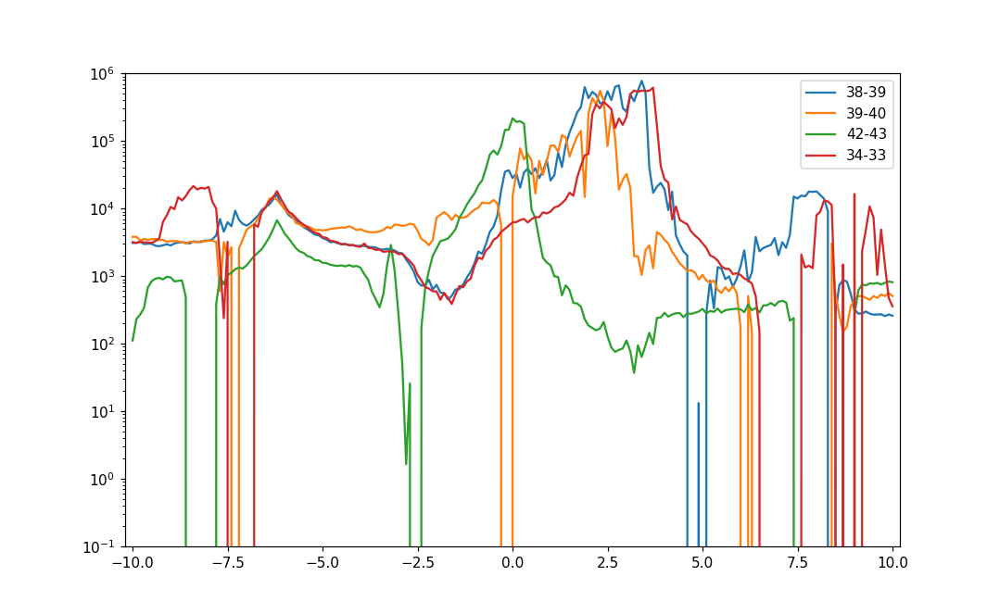

In [54]:
plt.figure()
plt.semilogy(bgvals, npd.Rxxfromdata(data3, 1e-9, instrument='lockin865'), label='38-39')
plt.semilogy(bgvals, npd.Rxxfromdata(data3, 1e-9, instrument='lockin830'), label='39-40')
# plt.semilogy(bgvals, npd.Rxxfromdata(data1, 1e-9, instrument='lockin865'), label='40-41')
# plt.semilogy(bgvals, npd.Rxxfromdata(data1, 1e-9, instrument='lockin830'), label='41-42')
plt.semilogy(bgvals, npd.Rxxfromdata(data2, 1e-9, instrument='lockin865'), label='42-43')
plt.semilogy(bgvals, npd.Rxxfromdata(data2, 1e-9, instrument='lockin830'), label='34-33')

plt.axis((-10.2, 10.2, 0.1, 1e6))

plt.legend()

Try different electrode for drain  
Source 37, drain 43  
Measure 40-41 lockin865, 41-42 lockin830
And try 0.5 nA

In [48]:
lockin865.amplitude()

0.10000000149

In [49]:
lockin865.amplitude(0.05)  # 0.5 nA

In [50]:
srframe.volt_p1(-10)  # actually 0.5nA, despite the data name
time.sleep(25)
bgvals = np.linspace(-10, 10, 201)
data4, plot4 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_40-41__830_41-42_1nA_backgate_drain43', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-05-05 10:00:26
DataSet:
   location = 'data/2020-05-05/#005_M30_baseT_865_40-41__830_41-42_1nA_backgate_drain43_10-00-25'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-05-05 10:05:07


<IPython.core.display.Javascript object>


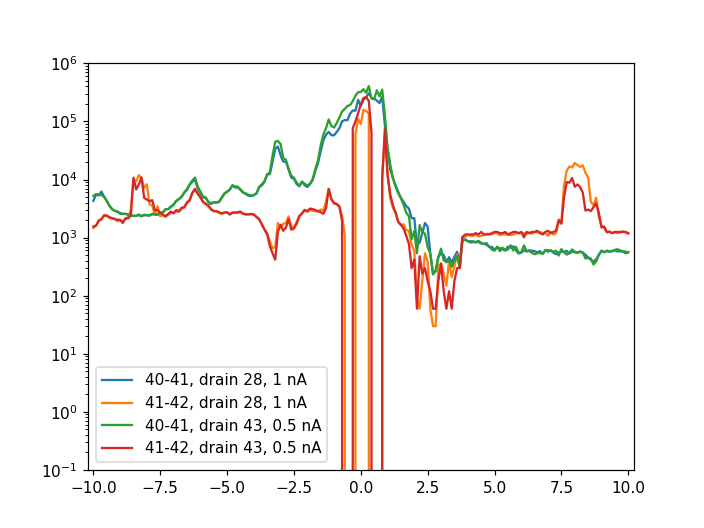

In [53]:
# compare the two drains
plt.figure()
plt.semilogy(bgvals, npd.Rxxfromdata(data1, 1e-9, instrument='lockin865'), label='40-41, drain 28, 1 nA')
plt.semilogy(bgvals, npd.Rxxfromdata(data1, 1e-9, instrument='lockin830'), label='41-42, drain 28, 1 nA')
plt.semilogy(bgvals, npd.Rxxfromdata(data4, 0.5e-9, instrument='lockin865'), label='40-41, drain 43, 0.5 nA')
plt.semilogy(bgvals, npd.Rxxfromdata(data4, 0.5e-9, instrument='lockin830'), label='41-42, drain 43, 0.5 nA')

plt.axis((-10.2, 10.2, 0.1, 1e6))

plt.legend()

We think the dirac point is offset from zero by a lot. Maybe it's at around -6 to -7 Vbg. Then full filling is at 0. That would be too bad because that would mean half and quarter filling appear for 40-41, and a bit of a resistance dip appears near +1/2 filling for 

## measure M32

Source 12, drain 2. Topgate (26) on volt_p5, backgate (21) on volt_p1. Temp cables unplugged, base T, 1nA. Topgate at 0 for the first measurements

Lockin865 measuring 11-9, lockin830 measuring 9-8

In [55]:
srframe.volt_p1(-10)
time.sleep(25)
bgvals = np.linspace(-10, 10, 201)
data5, plot5 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M32_baseT_865_11-9__830_9-8_1nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-05-05 10:28:56
DataSet:
   location = 'data/2020-05-05/#006_M32_baseT_865_11-9__830_9-8_1nA_backgate_10-28-55'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-05-05 10:33:37


In [56]:
srframe.volt_p1(-10)
time.sleep(25)
bgvals = np.linspace(-10, 10, 201)
data5, plot5 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M32_baseT_865_8-6__830_5-6_1nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-05-05 10:43:47
DataSet:
   location = 'data/2020-05-05/#007_M32_baseT_865_8-6__830_5-6_1nA_backgate_10-43-47'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-05-05 10:48:28


<IPython.core.display.Javascript object>


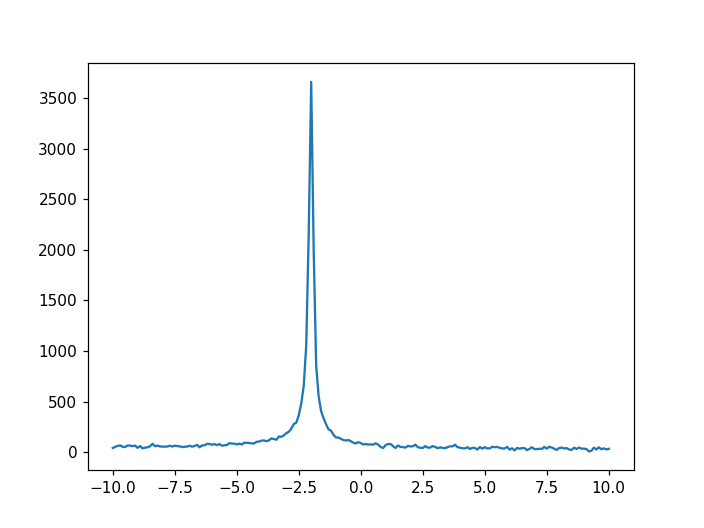

In [61]:
plt.figure()  # all look similar to this
plt.plot(data5.srframe_volt_p1_set, data5.lockin865_X[:]/1e-9)

M32 looks like Bernal

## Back to M30 to check on the large negative Vbg side and top gate

lockin865 on 42-43, lockin830 on 41-42 (source 37, drain 28), use 0.1 nA

In [57]:
lockin865.amplitude()

0.10000000149

In [58]:
lockin865.amplitude(0.01)

In [59]:
srframe.volt_p1(-15)  # actually 0.1 nA, despite the dataname
time.sleep(25)
bgvals = np.linspace(-15, 5, 401)
data7, plot7 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_42-43__830_41-42_1nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-05-05 11:07:04
DataSet:
   location = 'data/2020-05-05/#008_M30_baseT_865_42-43__830_41-42_1nA_backgate_11-07-03'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (401,)
   Measured | lockin865_X         | X            | (401,)
   Measured | lockin865_Y         | Y            | (401,)
   Measured | lockin830_X         | X            | (401,)
   Measured | lockin830_Y         | Y            | (401,)
Finished at 2020-05-05 11:15:22


In [62]:
lockin865.amplitude(0.05)  # change to half a nA to get better SNR

In [63]:
srframe.volt_p1(-14)  # change the source to 40, leave 28 as drain
time.sleep(25)
bgvals = np.linspace(-14, 4, 361)
data8, plot8 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_42-43__830_41-42_0p5nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-05-05 11:20:40
DataSet:
   location = 'data/2020-05-05/#009_M30_baseT_865_42-43__830_41-42_0p5nA_backgate_11-20-39'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (361,)
   Measured | lockin865_X         | X            | (361,)
   Measured | lockin865_Y         | Y            | (361,)
   Measured | lockin830_X         | X            | (361,)
   Measured | lockin830_Y         | Y            | (361,)
Finished at 2020-05-05 11:28:09


In [72]:
lockin865.time_constant(0.3)
lockin830.time_constant(0.3)

In [73]:
srframe.volt_p1(-14)  # try a small range with the same setup, longer time constant
time.sleep(25)
bgvals = np.linspace(-12, -1.2, 217)
data9, plot9 = npd.single_param_sweep(srframe.volt_p1, bgvals, 3.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_42-43__830_41-42_0p5nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-05-05 11:39:11
DataSet:
   location = 'data/2020-05-05/#010_M30_baseT_865_42-43__830_41-42_0p5nA_backgate_11-39-10'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (217,)
   Measured | lockin865_X         | X            | (217,)
   Measured | lockin865_Y         | Y            | (217,)
   Measured | lockin830_X         | X            | (217,)
   Measured | lockin830_Y         | Y            | (217,)
Finished at 2020-05-05 11:51:20


<IPython.core.display.Javascript object>


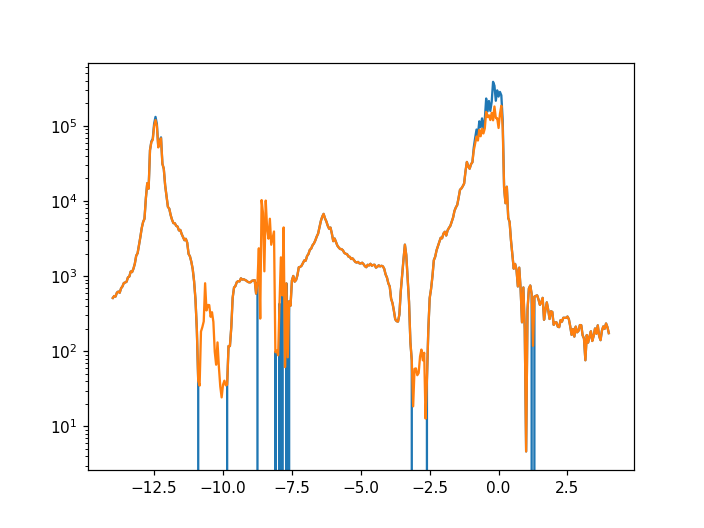

In [79]:
plt.figure()
# plt.semilogy(data7.srframe_volt_p1_set, npd.Rxxfromdata(data7, 0.1e-9, 'lockin865'))
plt.semilogy(data8.srframe_volt_p1_set, npd.Rxxfromdata(data8, 0.5e-9, 'lockin865'))
# plt.semilogy(data7.srframe_volt_p1_set, np.abs(data7.lockin865_X[:])/0.1e-9)
plt.semilogy(data8.srframe_volt_p1_set, np.abs(data8.lockin865_X[:])/0.5e-9)

<IPython.core.display.Javascript object>


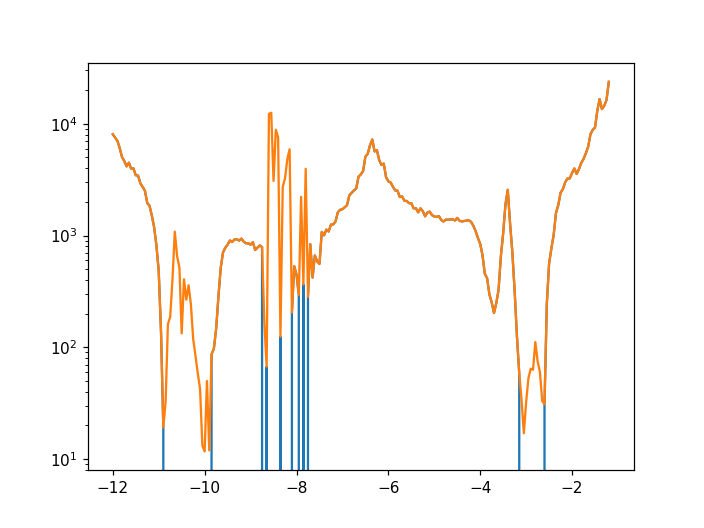

In [78]:
plt.figure()  # longer time constant. Not much different. Go back to 0.1 s time constant
plt.semilogy(data9.srframe_volt_p1_set, npd.Rxxfromdata(data9, 0.5e-9, 'lockin865'))
plt.semilogy(data9.srframe_volt_p1_set, np.abs(data9.lockin865_X[:])/0.5e-9)
# plt.semilogy(data8.srframe_volt_p1_set, np.abs(data8.lockin865_X[:])/0.5e-9)

Try changing source/drain to 39/43. Measure 29-28 with lockin865, 40-41 with lockin830

In [80]:
lockin865.time_constant(0.1)
lockin830.time_constant(0.1)
lockin830.sensitivity()

5e-05

In [81]:
srframe.volt_p1(-14)
time.sleep(25)
bgvals = np.linspace(-14, 4, 361)
data10, plot10 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_29-28__830_40-41_0p5nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-05-05 12:03:09
DataSet:
   location = 'data/2020-05-05/#011_M30_baseT_865_29-28__830_40-41_0p5nA_backgate_12-03-08'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (361,)
   Measured | lockin865_X         | X            | (361,)
   Measured | lockin865_Y         | Y            | (361,)
   Measured | lockin830_X         | X            | (361,)
   Measured | lockin830_Y         | Y            | (361,)
Finished at 2020-05-05 12:10:38


Try some of the electrodes again with the current setup. Try using 37 as source, 43 as drain.

In [87]:
srframe.volt_p1(-14)
time.sleep(25)
bgvals = np.linspace(-14, 2, 321)
data11, plot11 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_29-28__830_41-42_0p5nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-05-05 12:17:56
DataSet:
   location = 'data/2020-05-05/#012_M30_baseT_865_29-28__830_41-42_0p5nA_backgate_12-17-55'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (321,)
   Measured | lockin865_X         | X            | (321,)
   Measured | lockin865_Y         | Y            | (321,)
   Measured | lockin830_X         | X            | (321,)
   Measured | lockin830_Y         | Y            | (321,)
Finished at 2020-05-05 12:24:36


In [91]:
srframe.volt_p1(-14)
time.sleep(25)
bgvals = np.linspace(-14, 2, 321)
data12, plot12 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_38-39__830_34-33_0p5nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-05-05 12:41:02
DataSet:
   location = 'data/2020-05-05/#013_M30_baseT_865_38-39__830_34-33_0p5nA_backgate_12-41-01'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (321,)
   Measured | lockin865_X         | X            | (321,)
   Measured | lockin865_Y         | Y            | (321,)
   Measured | lockin830_X         | X            | (321,)
   Measured | lockin830_Y         | Y            | (321,)
Finished at 2020-05-05 12:47:41


In [95]:
srframe.volt_p1(-14)  # this one can check the lockin830 to make sure it's measuring similar to the 865
time.sleep(25)
bgvals = np.linspace(-15, 3, 361)
data13, plot13 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_39-40__830_38-39_0p5nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-05-05 12:54:17
DataSet:
   location = 'data/2020-05-05/#014_M30_baseT_865_39-40__830_38-39_0p5nA_backgate_12-54-16'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (361,)
   Measured | lockin865_X         | X            | (361,)
   Measured | lockin865_Y         | Y            | (361,)
   Measured | lockin830_X         | X            | (361,)
   Measured | lockin830_Y         | Y            | (361,)
Finished at 2020-05-05 13:01:48


<IPython.core.display.Javascript object>


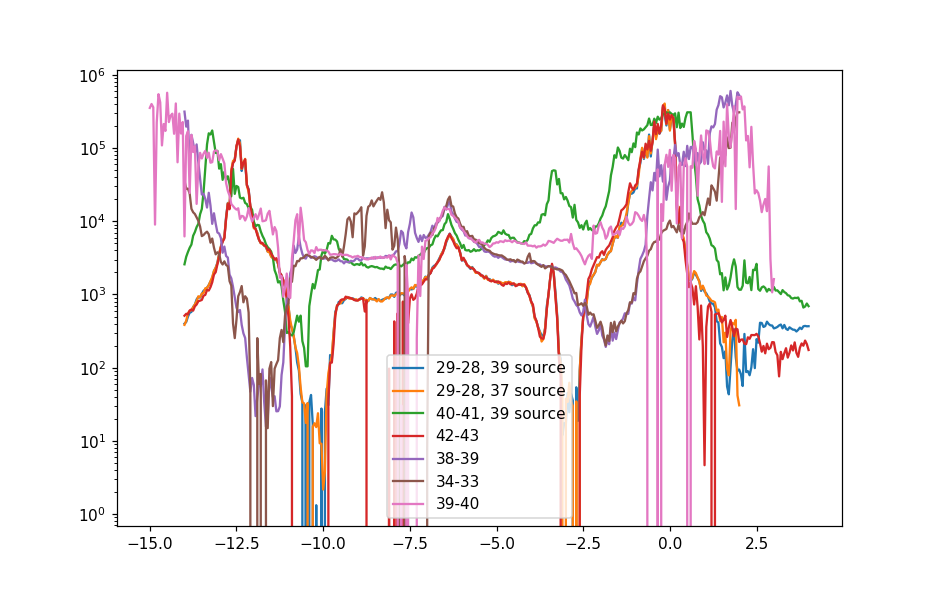

In [99]:
plt.figure()
plt.semilogy(data10.srframe_volt_p1_set, npd.Rxxfromdata(data10, 0.5e-9, 'lockin865'), label='29-28, 39 source')
plt.semilogy(data11.srframe_volt_p1_set, npd.Rxxfromdata(data11, 0.5e-9, 'lockin865'), label='29-28, 37 source')
plt.semilogy(data10.srframe_volt_p1_set, npd.Rxxfromdata(data10, 0.5e-9, 'lockin830'), label='40-41, 39 source')
# plt.semilogy(data11.srframe_volt_p1_set, npd.Rxxfromdata(data11, 0.5e-9, 'lockin830'), label='41-42, 43 drain')
# plt.semilogy(data8.srframe_volt_p1_set, npd.Rxxfromdata(data8, 0.5e-9, 'lockin830'), label='41-42, 28 drain')
plt.semilogy(data8.srframe_volt_p1_set, npd.Rxxfromdata(data8, 0.5e-9, 'lockin865'), label='42-43')
plt.semilogy(data12.srframe_volt_p1_set, npd.Rxxfromdata(data12, 0.5e-9, 'lockin865'), label='38-39')
plt.semilogy(data12.srframe_volt_p1_set, npd.Rxxfromdata(data12, 0.5e-9, 'lockin830'), label='34-33')
plt.semilogy(data13.srframe_volt_p1_set, npd.Rxxfromdata(data13, 0.5e-9, 'lockin865'), label='39-40')

plt.legend()

29-28 looks the best for SC, 40-41 looks good for insulating states, 38-39 looks good for a higher angle

In [97]:
srframe.volt_p1()

0.0

try measuring the SC critical current by using srframe.volt_p5 with the voltage adder

In [100]:
srframe.volt_p1(-10.25)

In [101]:
Ivals = np.linspace(0, 5, 101)  # 0 to 50 nA
data14, plot13 = npd.single_param_sweep(srframe.volt_p5, Ivals, 1.1, lockin865.X, lockin865.Y, DataName='M30_865_29-28_Ic_0p5nAexc_Vbg-10p25')
srframe.volt_p5(0)

Started at 2020-05-05 13:19:53
DataSet:
   location = 'data/2020-05-05/#015_M30_865_29-28_Ic_0p5nAexc_Vbg-10p25_13-19-52'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (101,)
   Measured | lockin865_X         | X            | (101,)
   Measured | lockin865_Y         | Y            | (101,)
Finished at 2020-05-05 13:21:55


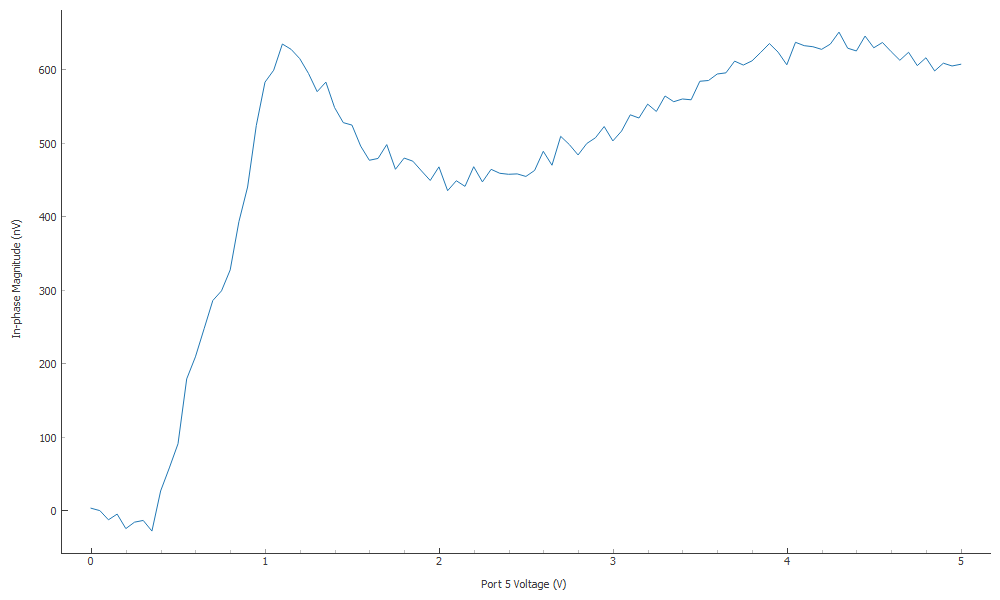

In [112]:
plot13[0]

In [102]:
Ivals = np.linspace(5, 10, 101)  # 50 to 100 nA
data15, plot15 = npd.single_param_sweep(srframe.volt_p5, Ivals, 1.1, lockin865.X, lockin865.Y, DataName='M30_865_29-28_Ic_0p5nAexc_Vbg-10p25')
srframe.volt_p5(0)

Started at 2020-05-05 13:22:22
DataSet:
   location = 'data/2020-05-05/#016_M30_865_29-28_Ic_0p5nAexc_Vbg-10p25_13-22-21'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (101,)
   Measured | lockin865_X         | X            | (101,)
   Measured | lockin865_Y         | Y            | (101,)
Finished at 2020-05-05 13:24:34


In [103]:
srframe.volt_p1(-10.1)
time.sleep(10)
Ivals = np.linspace(0, 10, 201)  # 0 to 100 nA
data16, plot16 = npd.single_param_sweep(srframe.volt_p5, Ivals, 1.1, lockin865.X, lockin865.Y, DataName='M30_865_29-28_Ic_0p5nAexc_Vbg-10p1')
srframe.volt_p5(0)

Started at 2020-05-05 13:25:41
DataSet:
   location = 'data/2020-05-05/#017_M30_865_29-28_Ic_0p5nAexc_Vbg-10p1_13-25-41'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (201,)
   Measured | lockin865_X         | X            | (201,)
   Measured | lockin865_Y         | Y            | (201,)
Finished at 2020-05-05 13:29:45


In [105]:
# try with the lockin830 measuring instead of 865 now
srframe.volt_p1(-10.3)
time.sleep(10)
Ivals = np.linspace(0, 10, 201)
data17, plot17 = npd.single_param_sweep(srframe.volt_p5, Ivals, 1.1, lockin830.X, lockin830.Y, DataName='M30_865_29-28_Ic_0p5nAexc_Vbg-10p3')
srframe.volt_p5(0)

Started at 2020-05-05 13:33:36
DataSet:
   location = 'data/2020-05-05/#019_M30_865_29-28_Ic_0p5nAexc_Vbg-10p3_13-33-35'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-05-05 13:37:43


In [106]:
# now at the other gate point
srframe.volt_p1(-2.85)
time.sleep(25)
Ivals = np.linspace(0, 10, 201) 
data18, plot18 = npd.single_param_sweep(srframe.volt_p5, Ivals, 1.1, lockin830.X, lockin830.Y, DataName='M30_865_29-28_Ic_0p5nAexc_Vbg-2p85')
srframe.volt_p5(0)

Started at 2020-05-05 13:39:43
DataSet:
   location = 'data/2020-05-05/#020_M30_865_29-28_Ic_0p5nAexc_Vbg-2p85_13-39-42'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (201,)
   Measured | lockin830_X         | X            | (201,)
   Measured | lockin830_Y         | Y            | (201,)
Finished at 2020-05-05 13:43:50


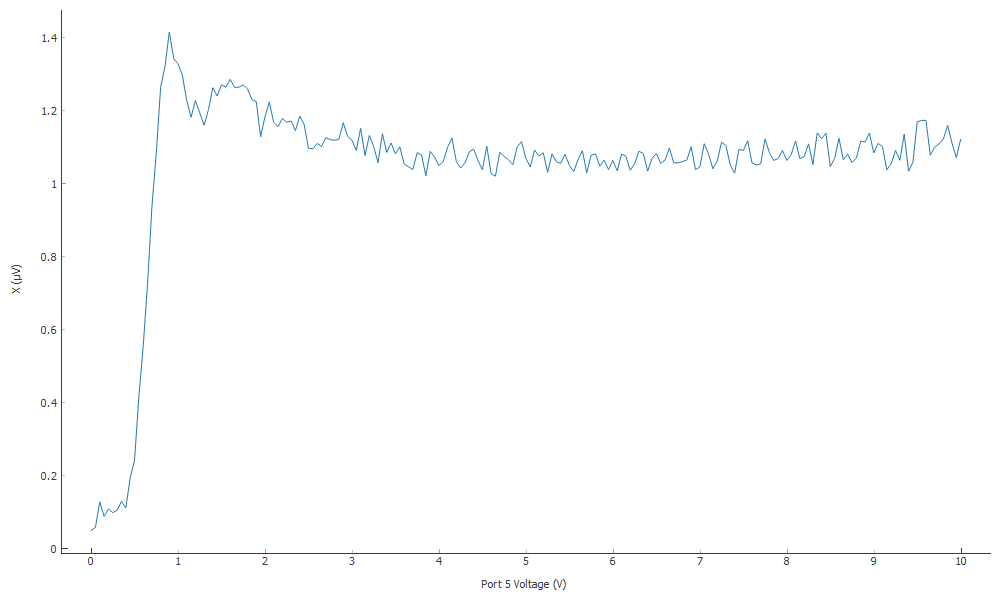

In [111]:
plot18[0]

The critical current in both regions is around 10 nA

Try a topgate sweep (using srframe.volt_p5 as topgate) on electrodes 29-28 and 40-41

In [107]:
srframe.volt_p1(-5)

In [109]:
srframe.volt_p5(0)

In [110]:
# backgate at -5
srframe.volt_p5(-2)
time.sleep(20)
tgvals = np.linspace(-2, 2, 81)
data19, plot19 = npd.single_param_sweep(srframe.volt_p5, tgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nA_Vbg-5_tgsweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)

Started at 2020-05-05 13:52:24
DataSet:
   location = 'data/2020-05-05/#022_M30_865_29-28__830_40-41_0p5nA_Vbg-5_tgsweep_13-52-23'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (81,)
   Measured | lockin865_X         | X            | (81,)
   Measured | lockin865_Y         | Y            | (81,)
   Measured | lockin830_X         | X            | (81,)
   Measured | lockin830_Y         | Y            | (81,)
Finished at 2020-05-05 13:54:05


<IPython.core.display.Javascript object>


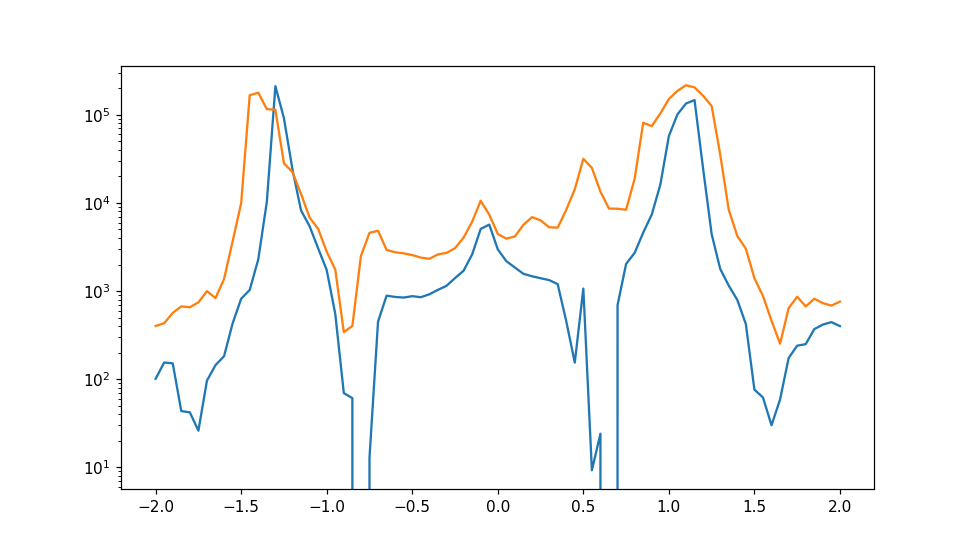

In [114]:
plt.figure()
plt.semilogy(tgvals, npd.Rxxfromdata(data19, 0.5e-9, 'lockin865'))
plt.semilogy(tgvals, npd.Rxxfromdata(data19, 0.5e-9, 'lockin830'))

# M30 topgate-backgate 2D

Try -12 to 0V on the backgate and -1.5 to 1.5 on the topgate

In [115]:
bgvals = np.linspace(-12, 0, 121)
tgvals = np.linspace(-1.5, 1.5, 91)
srframe.volt_p1(-12)
srframe.volt_p5(-1.5)
time.sleep(30)
data20, plot20 = npd.twod_param_sweep(srframe.volt_p5, tgvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=20, SetDelay2=1.1, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nA_2dgatesweep')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-05 14:08:49
DataSet:
   location = 'data/2020-05-05/#023_M30_865_29-28__830_40-41_0p5nA_2dgatesweep_14-08-47'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (91,)
   Setpoint | srframe_volt_p1_set | volt_p1      | (91, 121)
   Measured | lockin865_X         | X            | (91, 121)
   Measured | lockin865_Y         | Y            | (91, 121)
   Measured | lockin830_X         | X            | (91, 121)
   Measured | lockin830_Y         | Y            | (91, 121)
Finished at 2020-05-05 19:23:01


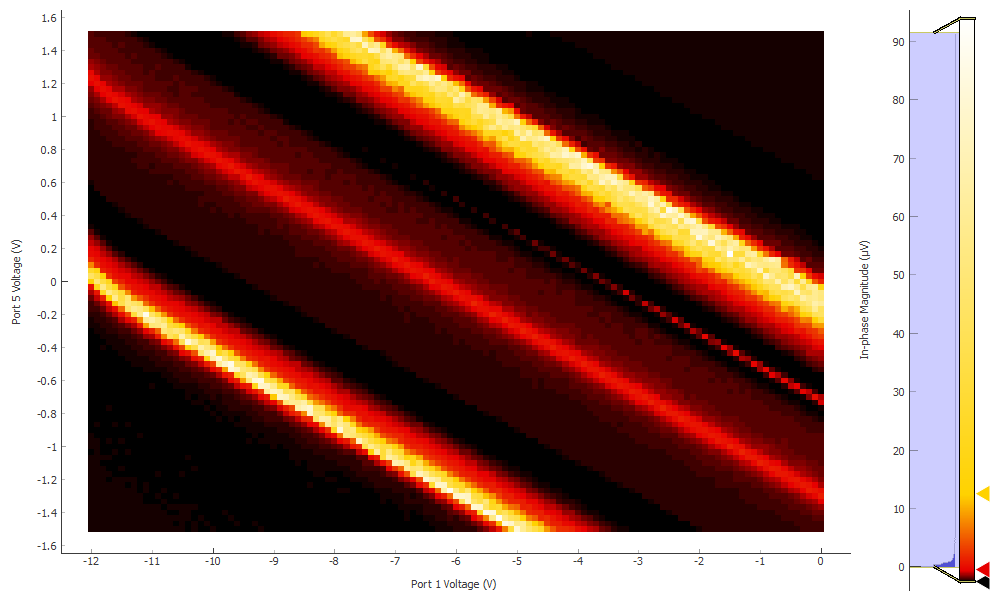

In [116]:
plot20[0]

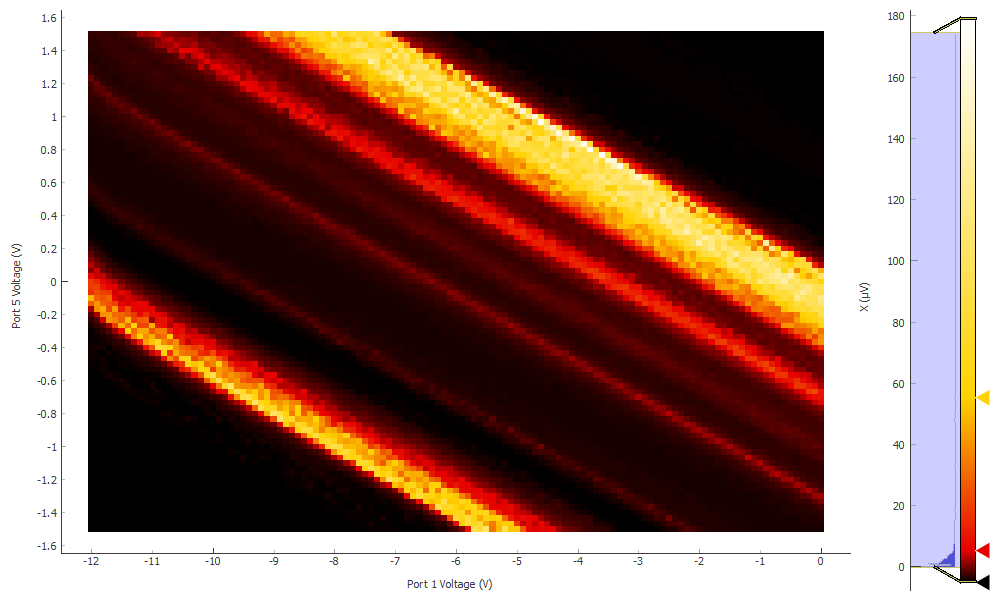

In [118]:
plot20[2]

In [159]:
bgvals = np.linspace(-11, 6, 272)  # the current setup should take somewhere around 26 hours.
tgvals = np.linspace(-1.7, 1.5, 193)
srframe.volt_p1(-12)
srframe.volt_p5(-1.5)
time.sleep(30)
data21, plot21 = npd.twod_param_sweep(srframe.volt_p5, tgvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=25, SetDelay2=1.1, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nA_2dgatesweep')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-05 19:52:32
DataSet:
   location = 'data/2020-05-05/#024_M30_865_29-28__830_40-41_0p5nA_2dgatesweep_19-52-29'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (193,)
   Setpoint | srframe_volt_p1_set | volt_p1      | (193, 272)
   Measured | lockin865_X         | X            | (193, 272)
   Measured | lockin865_Y         | Y            | (193, 272)
   Measured | lockin830_X         | X            | (193, 272)
   Measured | lockin830_Y         | Y            | (193, 272)
Finished at 2020-05-06 16:31:53


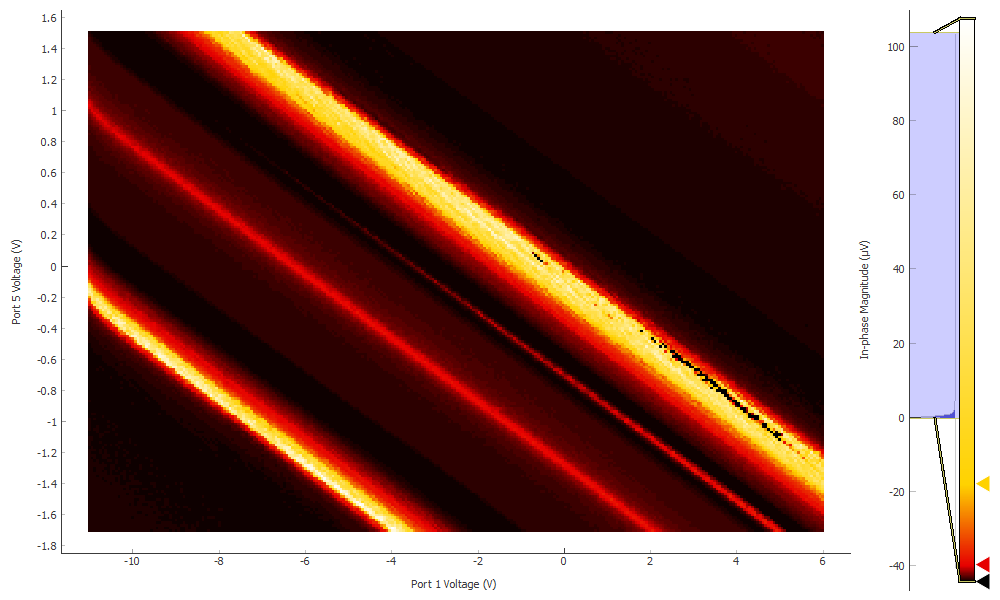

In [160]:
plot21[0]

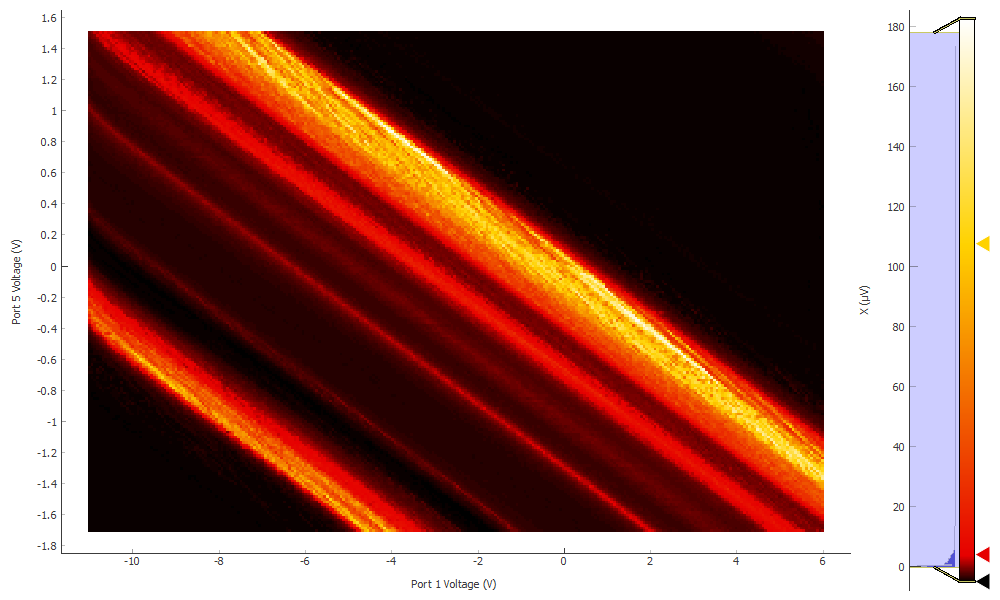

In [161]:
plot21[2]

In [133]:
triton.field(0)

Sweep time approximately 3210.328 seconds


In [132]:
triton.magnet_sweeprate(0.15)

In [127]:
triton.magnet_swh(1)

Wait 5 min for the switch to warm


KeyboardInterrupt: 

In [129]:
triton.magnet_POC()

0

In [166]:
bgvals = np.linspace(-6, 7, 209)
tgvals = np.linspace(-2.2, -1.7, 31)
srframe.volt_p1(-6)
srframe.volt_p5(-2.2)
time.sleep(30)
data22, plot22 = npd.twod_param_sweep(srframe.volt_p5, tgvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=25, SetDelay2=1.1, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nA_2dgatesweep')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-06 16:52:18
DataSet:
   location = 'data/2020-05-06/#001_M30_865_29-28__830_40-41_0p5nA_2dgatesweep_16-52-16'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (31,)
   Setpoint | srframe_volt_p1_set | volt_p1      | (31, 209)
   Measured | lockin865_X         | X            | (31, 209)
   Measured | lockin865_Y         | Y            | (31, 209)
   Measured | lockin830_X         | X            | (31, 209)
   Measured | lockin830_Y         | Y            | (31, 209)
Finished at 2020-05-06 19:27:58


# M30 D = 0 fan diagram

In [170]:
del zeroDparam

In [171]:
def zerofieldsw(Vb):
    slDrc = -0.2058088083627785
    srframe.volt_p1(Vb)
    srframe.volt_p5(-slDrc*Vb)
    
zeroDparam = qc.Parameter('zeroDparam', set_cmd=zerofieldsw)

You control just the bottom gate with the value you plug into this parameter. Then the top gate matches to make D = 0

In [174]:
print(srframe.volt_p1(), srframe.volt_p5())

0.0 0.0


In [175]:
zeroDparam(-1)

In [176]:
print(srframe.volt_p1(), srframe.volt_p5())

-1.0 -0.206


In [177]:
zeroDparam(1)

In [178]:
print(srframe.volt_p1(), srframe.volt_p5())

1.0 0.206


In [179]:
zeroDparam(-8)

In [180]:
print(srframe.volt_p1(), srframe.volt_p5())

-8.0 -1.646


In [182]:
# Try a single gate sweep. Since we control the bottom gate, it is probably somewhere between -8 and +2 or +3

bgnvals = np.linspace(-8, 3, 221)
data23, plot23 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nA_0T_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-06 20:54:52
DataSet:
   location = 'data/2020-05-06/#002_M30_865_29-28__830_40-41_0p5nA_0T_D0sweep_20-54-51'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (221,)
   Measured | lockin865_X    | X            | (221,)
   Measured | lockin865_Y    | Y            | (221,)
   Measured | lockin830_X    | X            | (221,)
   Measured | lockin830_Y    | Y            | (221,)
Finished at 2020-05-06 21:00:13


In [212]:
zeroDparam(-7.5)

In [423]:
print(srframe.volt_p1(), srframe.volt_p5())

ValueError: ("could not convert string to float: '000 20.000 20.000 0 '", 'getting srframe_volt_p1')

In [211]:
lockin865.amplitude(0.1)

In [214]:
time.sleep(30)

In [187]:
lockin865.sensitivity(0.0001)

In [190]:
lockin830.sensitivity(0.0002)

In [215]:
bgnvals = np.linspace(-7.5, 1.5, 451)
bvals = np.linspace(0, 8, 161)
data24, plot24 = npd.twod_param_sweep(triton.field_set_stable, bvals, zeroDparam, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=15, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_1nA_baseT_B-n_D0_sweep')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-06 23:13:38
Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.64 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.628 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.628 seconds for the field sweep, plus the time required for operat

In [217]:
triton.magnet_sweeprate(0.1)

In [218]:
triton.field(0)

Sweep time approximately 4810.012000000001 seconds


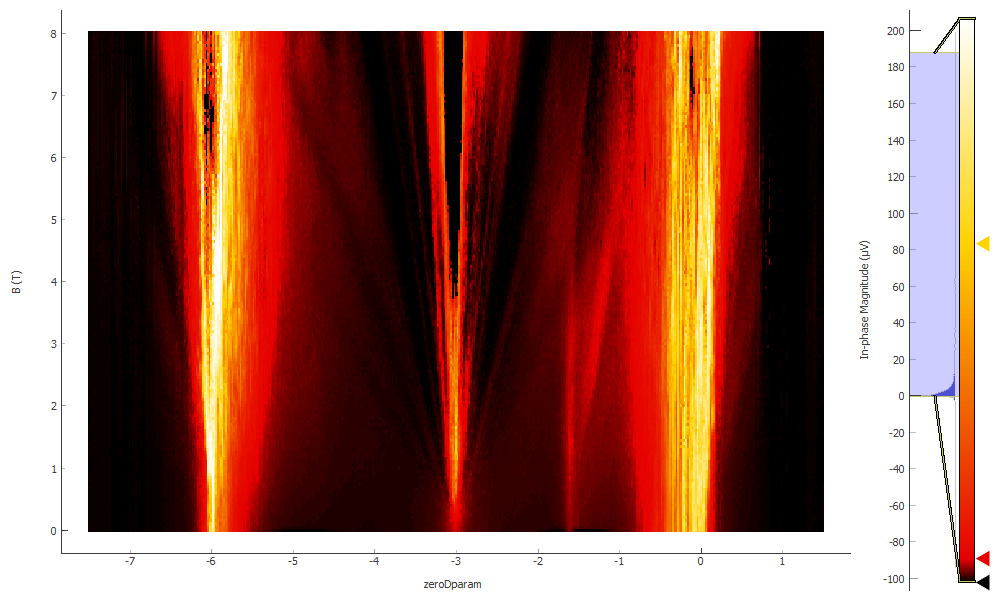

In [261]:
plot24[0]

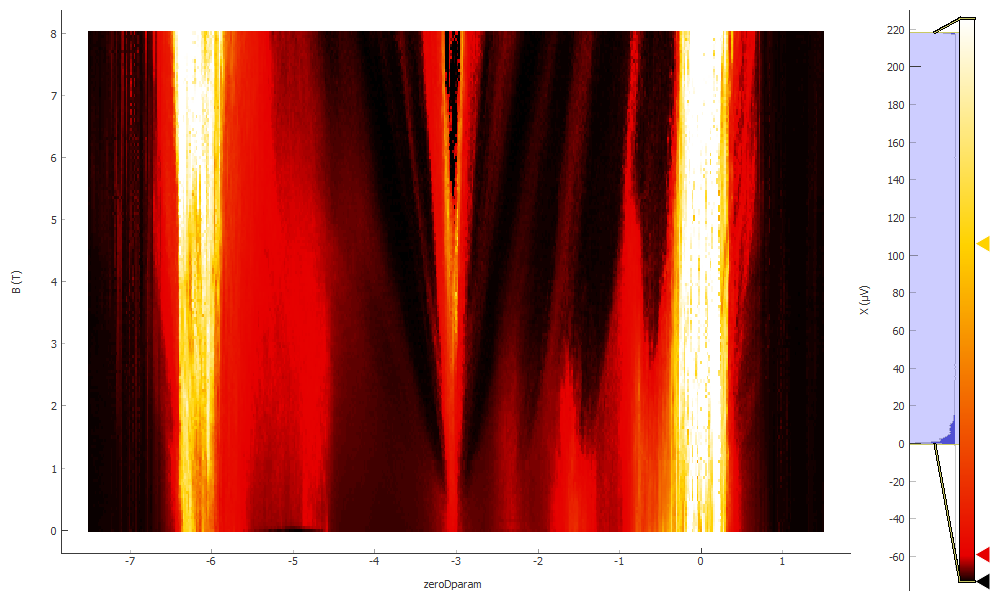

In [262]:
plot24[2]

# connect the srdc and dispersive band 0 resistance test

first try srdc without connected to the device

In [7]:
srdc.volt.step = 0.08
srdc.volt.inter_delay = 0.1

In [222]:
srdc.range(1)#+/- 1V

In [8]:
srdc.volt()

-0.63801

In [238]:
srdc.output(0)

In [227]:
srdc.volt(0)

In [228]:
#seems working

now connect to the device by adding lockin865 AC and srdc together, 100MOhm remains the same 1V=10nA

In [229]:
# Try a single gate sweep. along the D=0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 181)
data25, plot25 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nA_0T_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-08 10:36:46
DataSet:
   location = 'data/2020-05-08/#001_M30_865_29-28__830_40-41_0p5nA_0T_D0sweep_10-36-46'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (181,)
   Measured | lockin865_X    | X            | (181,)
   Measured | lockin865_Y    | Y            | (181,)
   Measured | lockin830_X    | X            | (181,)
   Measured | lockin830_Y    | Y            | (181,)
Finished at 2020-05-08 10:41:00


<IPython.core.display.Javascript object>


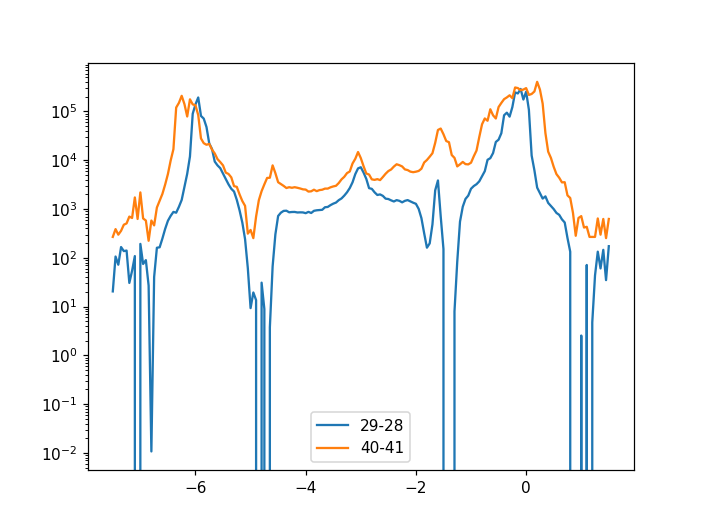

In [231]:
plt.figure()
plt.semilogy(data25.zeroDparam_set, npd.Rxxfromdata(data25, 0.5e-9, 'lockin865'), label='29-28')
plt.semilogy(data25.zeroDparam_set, npd.Rxxfromdata(data25, 0.5e-9, 'lockin830'), label='40-41')
plt.legend()

now go to the hole side SC to try out the srdc with +- 10nA

In [232]:
zeroDparam(-4.8)

In [237]:
srdc.volt(0)

In [236]:
# seems working

In [240]:
srdc.range(1)#+/- 10V  +/-100nA

In [242]:
srdc.output(1)

In [243]:
#zeroDparam(-4.8)
Ivals = np.linspace(0, 7, 141) 
data26, plot26 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_D0_zeroDparam-4.8')
srdc.volt(0)

Started at 2020-05-08 10:51:43
DataSet:
   location = 'data/2020-05-08/#002_M30_865_29-28__830_40-41_0p5nAexc_D0_zeroDparam-4.8_10-51-41'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (141,)
   Measured | lockin865_X   | X            | (141,)
   Measured | lockin865_Y   | Y            | (141,)
   Measured | lockin830_X   | X            | (141,)
   Measured | lockin830_Y   | Y            | (141,)
Finished at 2020-05-08 10:54:37


In [244]:
# now go to the disersive band 0 resistance region

In [245]:
zeroDparam(1)

In [246]:
# the lockin865 shows 0X and 0Y now dV/dI

In [247]:
#zeroDparam(1)
srdc.volt(-7)
time.sleep(30)
Ivals = np.linspace(-7, 7, 281) 
data27, plot27 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_D0_zeroDparam1')
srdc.volt(0)

Started at 2020-05-08 10:59:29
DataSet:
   location = 'data/2020-05-08/#003_M30_865_29-28__830_40-41_0p5nAexc_D0_zeroDparam1_10-59-27'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (281,)
   Measured | lockin865_X   | X            | (281,)
   Measured | lockin865_Y   | Y            | (281,)
   Measured | lockin830_X   | X            | (281,)
   Measured | lockin830_Y   | Y            | (281,)
Finished at 2020-05-08 11:05:21


KeyboardInterrupt: 

In [ ]:
can you do this at -1mT field? sure also, try excitation current of 0.2nA ok

In [248]:
triton.field(-0.0008)

Sweep time approximately 10.48 seconds


In [250]:
lockin865.amplitude(0.02) #0.2nA

In [251]:
#zeroDparam(1) 
srdc.volt(-5)
time.sleep(30)
Ivals = np.linspace(-5, 5, 201) 
data28, plot28 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p2nAexc_D0_zeroDparam1_-0.8mT')
srdc.volt(0)

Started at 2020-05-08 11:08:15
DataSet:
   location = 'data/2020-05-08/#004_M30_865_29-28__830_40-41_0p2nAexc_D0_zeroDparam1_-0.8mT_11-08-13'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (201,)
   Measured | lockin865_X   | X            | (201,)
   Measured | lockin865_Y   | Y            | (201,)
   Measured | lockin830_X   | X            | (201,)
   Measured | lockin830_Y   | Y            | (201,)
Finished at 2020-05-08 11:12:23


In [253]:
#zeroDparam(1) 
srdc.volt(-1)
time.sleep(30)
Ivals = np.linspace(-1, 1, 101) 
data29, plot29 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p2nAexc_D0_zeroDparam1_-0.8mT')
srdc.volt(0)

Started at 2020-05-08 11:15:19
DataSet:
   location = 'data/2020-05-08/#005_M30_865_29-28__830_40-41_0p2nAexc_D0_zeroDparam1_-0.8mT_11-15-17'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (101,)
   Measured | lockin865_X   | X            | (101,)
   Measured | lockin865_Y   | Y            | (101,)
   Measured | lockin830_X   | X            | (101,)
   Measured | lockin830_Y   | Y            | (101,)
Finished at 2020-05-08 11:17:23


In [254]:
triton.field(0.05)

Sweep time approximately 40.492 seconds


In [255]:
#zeroDparam(1) 
srdc.volt(-1)
time.sleep(30)
Ivals = np.linspace(-1, 1, 101) 
data30, plot30 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p2nAexc_D0_zeroDparam1_50mT')
srdc.volt(0)

Started at 2020-05-08 11:19:13
DataSet:
   location = 'data/2020-05-08/#006_M30_865_29-28__830_40-41_0p2nAexc_D0_zeroDparam1_50mT_11-19-11'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (101,)
   Measured | lockin865_X   | X            | (101,)
   Measured | lockin865_Y   | Y            | (101,)
   Measured | lockin830_X   | X            | (101,)
   Measured | lockin830_Y   | Y            | (101,)
Finished at 2020-05-08 11:21:18


In [256]:
zeroDparam(1.05)

In [257]:
#zeroDparam(1.05) 
srdc.volt(-1)
time.sleep(30)
Ivals = np.linspace(-1, 1, 101) 
data31, plot31 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p2nAexc_D0_zeroDparam1p05_50mT')
srdc.volt(0)

Started at 2020-05-08 11:25:30
DataSet:
   location = 'data/2020-05-08/#007_M30_865_29-28__830_40-41_0p2nAexc_D0_zeroDparam1p05_50mT_11-25-28'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (101,)
   Measured | lockin865_X   | X            | (101,)
   Measured | lockin865_Y   | Y            | (101,)
   Measured | lockin830_X   | X            | (101,)
   Measured | lockin830_Y   | Y            | (101,)
Finished at 2020-05-08 11:27:35


In [258]:
triton.field(-0.0008)

Sweep time approximately 40.480000000000004 seconds


In [259]:
#zeroDparam(1.05) 
srdc.volt(-1)
time.sleep(30)
Ivals = np.linspace(-1, 1, 101) 
data32, plot32 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p2nAexc_D0_zeroDparam1p05_-0p8mT')
srdc.volt(0)

Started at 2020-05-08 11:29:53
DataSet:
   location = 'data/2020-05-08/#008_M30_865_29-28__830_40-41_0p2nAexc_D0_zeroDparam1p05_-0p8mT_11-29-51'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (101,)
   Measured | lockin865_X   | X            | (101,)
   Measured | lockin865_Y   | Y            | (101,)
   Measured | lockin830_X   | X            | (101,)
   Measured | lockin830_Y   | Y            | (101,)
Finished at 2020-05-08 11:31:58


In [260]:
#zeroDparam(1.05) check DC direction dependence
srdc.volt(1)
time.sleep(30)
Ivals = np.linspace(1, -1, 101) 
data33, plot33 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p2nAexc_D0_zeroDparam1p05_-0p8mT')
srdc.volt(0)

Started at 2020-05-08 11:34:15
DataSet:
   location = 'data/2020-05-08/#009_M30_865_29-28__830_40-41_0p2nAexc_D0_zeroDparam1p05_-0p8mT_11-34-13'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (101,)
   Measured | lockin865_X   | X            | (101,)
   Measured | lockin865_Y   | Y            | (101,)
   Measured | lockin830_X   | X            | (101,)
   Measured | lockin830_Y   | Y            | (101,)
Finished at 2020-05-08 11:36:20


In [265]:
zeroDparam(-7)

In [284]:
srframe.volt_p5(0)
srframe.volt_p1(0)

In [266]:
#zeroDparam(-7) check DC direction dependence
srdc.volt(3)
time.sleep(30)
Ivals = np.linspace(1, -1, 101) 
data34, plot34 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p1nAexc_D0_zeroDparam-7_-0p8mT')
srdc.volt(0)

Started at 2020-05-08 12:53:50
DataSet:
   location = 'data/2020-05-08/#010_M30_865_29-28__830_40-41_0p1nAexc_D0_zeroDparam-7_-0p8mT_12-53-48'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (101,)
   Measured | lockin865_X   | X            | (101,)
   Measured | lockin865_Y   | Y            | (101,)
   Measured | lockin830_X   | X            | (101,)
   Measured | lockin830_Y   | Y            | (101,)
Finished at 2020-05-08 12:53:58
Keyboard Interrupt


In [282]:
srdc.range(1)

In [283]:
srdc.output(1)

In [285]:
# Try a single gate sweep. along the D=0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 181)
data35, plot35 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-42__830_40-32_0p5nA_0T_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-08 13:12:34
DataSet:
   location = 'data/2020-05-08/#011_M30_865_29-42__830_40-32_0p5nA_0T_D0sweep_13-12-33'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (181,)
   Measured | lockin865_X    | X            | (181,)
   Measured | lockin865_Y    | Y            | (181,)
   Measured | lockin830_X    | X            | (181,)
   Measured | lockin830_Y    | Y            | (181,)
Finished at 2020-05-08 13:16:48


<IPython.core.display.Javascript object>


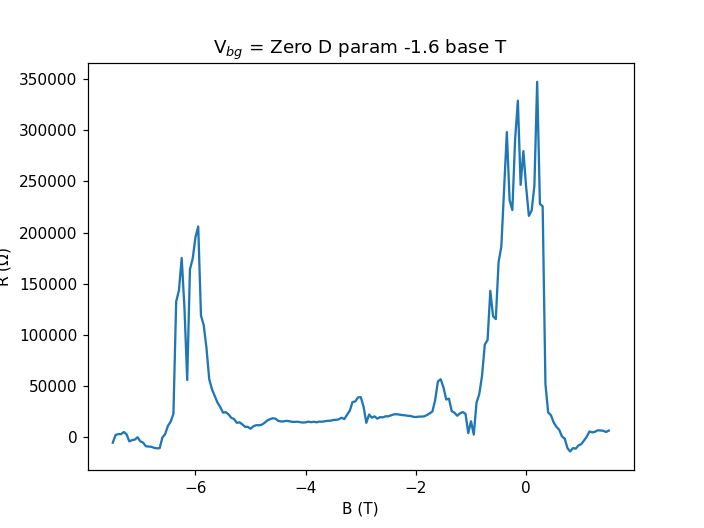

Text(0, 0.5, 'R ($\\Omega$)')

In [818]:
plt.figure()
plt.plot(data35.zeroDparam_set, data35.lockin830_X[:]/0.5e-9, label='')
plt.title('V$_{bg}$ = Zero D param -1.6 base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [287]:
zeroDparam(-1.6)

In [288]:
triton.magnet_sweeprate(0.1)
triton.field(-0.2)
data36, plot36 = npd.data_log(2, triton.field, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.2, 0.001, 10), DataName='M30_hysteresisupzeroD-1p6_830_40-32_0p3nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 130.012 seconds
Started at 2020-05-08 13:45:45
DataSet:
   location = 'data/2020-05-08/#012_M30_hysteresisupzeroD-1p6_830_40-32_0p3nA_13-45-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 13:48:01


In [289]:
triton.magnet_sweeprate(0.1)
triton.field(0.2)
data37, plot37 = npd.data_log(2, triton.field, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.2, 0.001, 10), DataName='M30_hysteresisdownzeroD-1p6_830_40-32_0p3nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 249.994 seconds
Started at 2020-05-08 13:51:53
DataSet:
   location = 'data/2020-05-08/#013_M30_hysteresisdownzeroD-1p6_830_40-32_0p3nA_13-51-53'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 13:56:10


In [290]:
triton.magnet_sweeprate(0.1)
triton.field(-0.2)
data38, plot38 = npd.data_log(2, triton.field, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.2, 0.001, 10), DataName='M30_hysteresisupzeroD-1p6_830_40-32_0p3nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 249.994 seconds
Started at 2020-05-08 13:56:16
DataSet:
   location = 'data/2020-05-08/#014_M30_hysteresisupzeroD-1p6_830_40-32_0p3nA_13-56-16'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 14:00:33


<IPython.core.display.Javascript object>


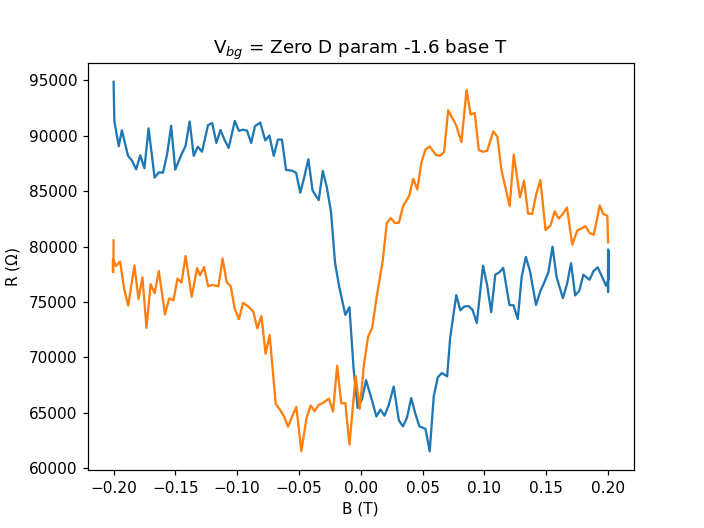

Text(0, 0.5, 'R ($\\Omega$)')

In [292]:
plt.figure()
plt.plot(data37.triton_field, data37.lockin830_X[:]/0.3e-9, label='up')
plt.plot(data38.triton_field, data38.lockin830_X[:]/0.3e-9, label='down')
plt.title('V$_{bg}$ = Zero D param -1.6 base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [293]:
srframe.volt_p1(0.027)

In [294]:
srframe.volt_p5(-0.66)

In [295]:
triton.magnet_sweeprate(0.1)
triton.field(0.2)
data39, plot39 = npd.data_log(2, triton.field, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.2, 0.001, 10), DataName='M30_hysteresisupbg0p027tg-0p66_830_40-32_0p3nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 249.994 seconds
Started at 2020-05-08 14:08:28
DataSet:
   location = 'data/2020-05-08/#015_M30_hysteresisupbg0p027tg-0p66_830_40-32_0p3nA_14-08-28'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 14:12:43


In [296]:
triton.magnet_sweeprate(0.1)
triton.field(-0.2)
data40, plot40 = npd.data_log(2, triton.field, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.2, 0.001, 10), DataName='M30_hysteresisdownbg0p027tg-0p66_830_40-32_0p3nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 250.00599999999997 seconds
Started at 2020-05-08 14:12:49
DataSet:
   location = 'data/2020-05-08/#016_M30_hysteresisdownbg0p027tg-0p66_830_40-32_0p3nA_14-12-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 14:17:06


<IPython.core.display.Javascript object>


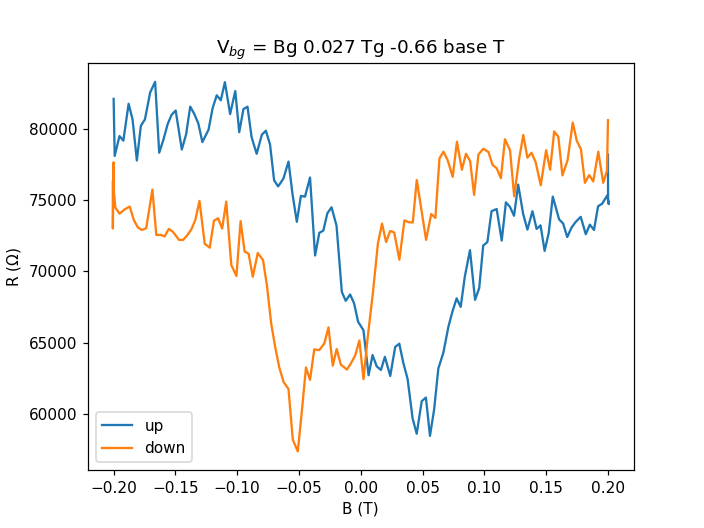

In [297]:
plt.figure()
plt.plot(data39.triton_field, data39.lockin830_X[:]/0.3e-9, label='up')
plt.plot(data40.triton_field, data40.lockin830_X[:]/0.3e-9, label='down')
plt.title('V$_{bg}$ = Bg 0.027 Tg -0.66 base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')
plt.legend()

In [298]:
srframe.volt_p1(-3.22)
srframe.volt_p5(-0.03)

In [299]:
triton.magnet_sweeprate(0.1)
triton.field(0.2)
data41, plot41 = npd.data_log(2, triton.field, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.2, 0.001, 10), DataName='M30_hysteresisupbg-3p22tg-0p03_830_40-32_0p3nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 250.00599999999997 seconds
Started at 2020-05-08 14:25:25
DataSet:
   location = 'data/2020-05-08/#017_M30_hysteresisupbg-3p22tg-0p03_830_40-32_0p3nA_14-25-25'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 14:29:40


In [303]:
zeroDparam(-1.55)

In [304]:
triton.magnet_sweeprate(0.1)
triton.field(-0.2)
data42, plot42 = npd.data_log(2, triton.field, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.2, 0.001, 10), DataName='M30_hysteresisdownzeroD-1p55_830_40-32_0p3nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 250.00599999999997 seconds
Started at 2020-05-08 14:37:26
DataSet:
   location = 'data/2020-05-08/#018_M30_hysteresisdownzeroD-1p55_830_40-32_0p3nA_14-37-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 14:41:41


In [305]:
triton.magnet_sweeprate(0.1)
triton.field(0.2)
data43, plot43 = npd.data_log(2, triton.field, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.2, 0.001, 10), DataName='M30_hysteresisupzeroD-1p55_830_40-32_0p3nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 249.994 seconds
Started at 2020-05-08 14:41:47
DataSet:
   location = 'data/2020-05-08/#019_M30_hysteresisupzeroD-1p55_830_40-32_0p3nA_14-41-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 14:46:02


In [308]:
triton.field()

0.4

In [309]:
triton.magnet_sweeprate(0.1)
triton.field(-0.4)
data44, plot44 = npd.data_log(2, triton.field, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.4, 0.001, 10), DataName='M30_hysteresisupzeroD-1p55_830_40-32_0p3nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 490.0 seconds
Started at 2020-05-08 14:52:42
DataSet:
   location = 'data/2020-05-08/#020_M30_hysteresisupzeroD-1p55_830_40-32_0p3nA_14-52-42'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 15:01:00


In [310]:
triton.magnet_sweeprate(0.1)
triton.field(0.4)
data45, plot45 = npd.data_log(2, triton.field, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.4, 0.001, 10), DataName='M30_hysteresisupzeroD-1p55_830_40-32_0p3nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 489.994 seconds
Started at 2020-05-08 15:01:05
DataSet:
   location = 'data/2020-05-08/#021_M30_hysteresisupzeroD-1p55_830_40-32_0p3nA_15-01-05'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 15:09:22


<IPython.core.display.Javascript object>


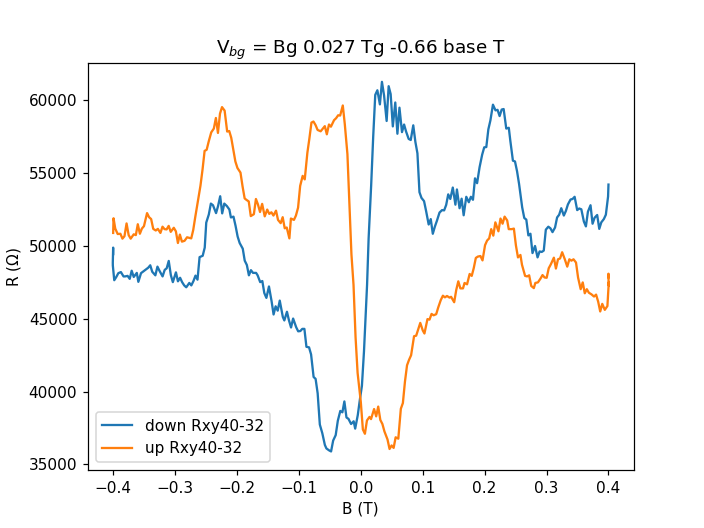

In [317]:
plt.figure()
plt.plot(data44.triton_field, data44.lockin830_X[:]/0.4e-9, label='down Rxy40-32')
plt.plot(data45.triton_field, data45.lockin830_X[:]/0.4e-9, label='up Rxy40-32')
plt.title('V$_{bg}$ = Bg 0.027 Tg -0.66 base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')
plt.legend()

In [312]:
triton.magnet_sweeprate(0.1)#Rxx
triton.field(-0.4)
data46, plot46 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.4, 0.001, 10), DataName='M30_hysteresisupzeroD-1p55_865_28-29_830_40-41_0p3nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 489.994 seconds
Started at 2020-05-08 15:17:57
DataSet:
   location = 'data/2020-05-08/#022_M30_hysteresisupzeroD-1p55_865_28-29_830_40-41_0p3nA_15-17-57'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 15:26:14


In [313]:
triton.magnet_sweeprate(0.1)#Rxx
triton.field(0.4)
data47, plot47 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.4, 0.001, 10), DataName='M30_hysteresisupzeroD-1p55_865_28-29_830_40-41_0p3nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 490.006 seconds
Started at 2020-05-08 15:26:26
DataSet:
   location = 'data/2020-05-08/#023_M30_hysteresisupzeroD-1p55_865_28-29_830_40-41_0p3nA_15-26-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 15:34:43


<IPython.core.display.Javascript object>


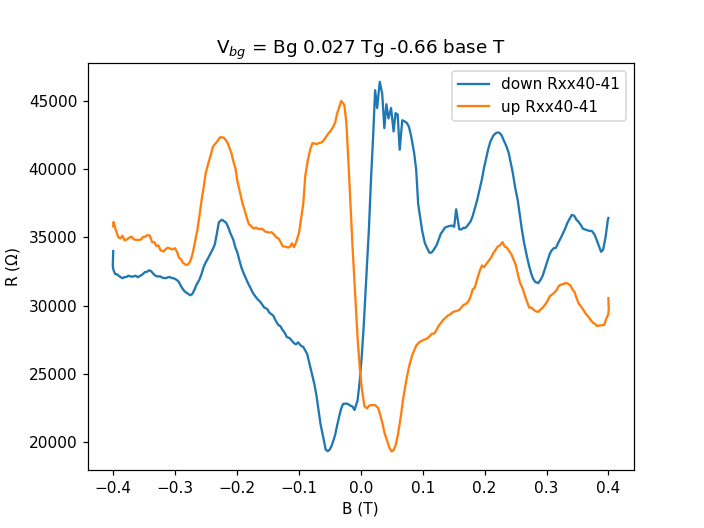

In [316]:
plt.figure()
plt.plot(data46.triton_field, data46.lockin830_X[:]/0.4e-9, label='down Rxx40-41')
plt.plot(data47.triton_field, data47.lockin830_X[:]/0.4e-9, label='up Rxx40-41')
plt.title('V$_{bg}$ = Bg 0.027 Tg -0.66 base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')
plt.legend()

In [318]:
triton.magnet_sweeprate(0.1)#combined Rxx and Rxy
triton.field(-0.4)
data48, plot48 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.4, 0.001, 10), DataName='M30_hysteresisupzeroD-1p55830_40-28_0p4nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 490.006 seconds
Started at 2020-05-08 15:42:47
DataSet:
   location = 'data/2020-05-08/#024_M30_hysteresisupzeroD-1p55830_40-28_0p4nA_15-42-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 15:51:04


In [319]:
triton.magnet_sweeprate(0.1)#combined Rxx and Rxy
triton.field(0.4)
data49, plot49 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.4, 0.001, 10), DataName='M30_hysteresisupzeroD-1p55830_40-28_0p4nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 489.994 seconds
Started at 2020-05-08 15:51:10
DataSet:
   location = 'data/2020-05-08/#025_M30_hysteresisupzeroD-1p55830_40-28_0p4nA_15-51-10'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 15:59:27


In [321]:
triton.magnet_sweeprate(0.1)#combined Rxx and Rxy (drain 28 contact 40-29)
triton.field(-0.4)
data50, plot50 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.4, 0.001, 10), DataName='M30_hysteresisupzeroD-1p55830_40-28_0p4nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 490.006 seconds
Started at 2020-05-08 16:10:26
DataSet:
   location = 'data/2020-05-08/#026_M30_hysteresisupzeroD-1p55830_40-28_0p4nA_16-10-26'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 16:18:42


In [322]:
triton.magnet_sweeprate(0.1)#combined Rxx and Rxy (drain 28 contact 40-29)
triton.field(0.4)
data51, plot51 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.4, 0.001, 10), DataName='M30_hysteresisupzeroD-1p55830_40-28_0p4nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 490.0 seconds
Started at 2020-05-08 16:18:48
DataSet:
   location = 'data/2020-05-08/#027_M30_hysteresisupzeroD-1p55830_40-28_0p4nA_16-18-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 16:27:04


<IPython.core.display.Javascript object>


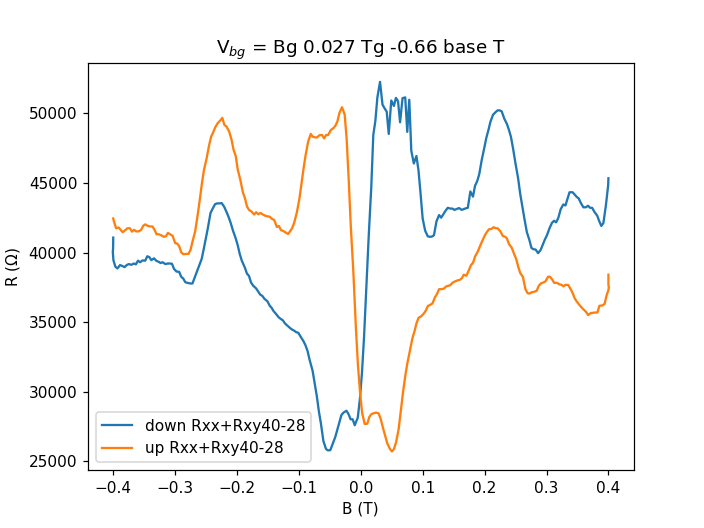

In [320]:
plt.figure()
plt.plot(data48.triton_field, data48.lockin830_X[:]/0.4e-9, label='down Rxx+Rxy40-28')
plt.plot(data49.triton_field, data49.lockin830_X[:]/0.4e-9, label='up Rxx+Rxy40-28')
plt.title('V$_{bg}$ = Bg 0.027 Tg -0.66 base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')
plt.legend()

In [325]:
triton.magnet_sweeprate(0.1)#combined Rxx and Rxy (drain 28 contact 40-29)
triton.field(0.15)
data52, plot52 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.15, 0.001, 10), DataName='M30_hysteresisupzeroD-1p55830_40-28_0p4nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 160.006 seconds
Started at 2020-05-08 16:27:49
DataSet:
   location = 'data/2020-05-08/#028_M30_hysteresisupzeroD-1p55830_40-28_0p4nA_16-27-49'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 16:30:35


In [326]:
triton.magnet_sweeprate(0.04)#combined Rxx and Rxy (drain 28 contact 40-29)
triton.field(-0.15)
data53, plot53 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, -0.15, 0.001, 10), DataName='M30_hysteresisupzeroD-1p55830_40-28_0p4nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 459.994 seconds
Started at 2020-05-08 16:30:48
DataSet:
   location = 'data/2020-05-08/#029_M30_hysteresisupzeroD-1p55830_40-28_0p4nA_16-30-48'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 16:38:34


In [327]:
triton.magnet_sweeprate(0.04)#combined Rxx and Rxy (drain 28 contact 40-29)
triton.field(0.15)
data54, plot54 = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=40, breakif=npd.breakat(triton.field, 0.15, 0.001, 10), DataName='M30_hysteresisupzeroD-1p55830_40-28_0p4nA', XParam=triton.field, YParam=lockin830.X)

Sweep time approximately 459.994 seconds
Started at 2020-05-08 16:38:40
DataSet:
   location = 'data/2020-05-08/#030_M30_hysteresisupzeroD-1p55830_40-28_0p4nA_16-38-40'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (1200,)
   Measured | time0        | time0        | (1200,)
   Measured | triton_field | field        | (1200,)
   Measured | lockin865_X  | X            | (1200,)
   Measured | lockin865_Y  | Y            | (1200,)
   Measured | lockin830_X  | X            | (1200,)
   Measured | lockin830_Y  | Y            | (1200,)
Finished at 2020-05-08 16:46:26


<IPython.core.display.Javascript object>


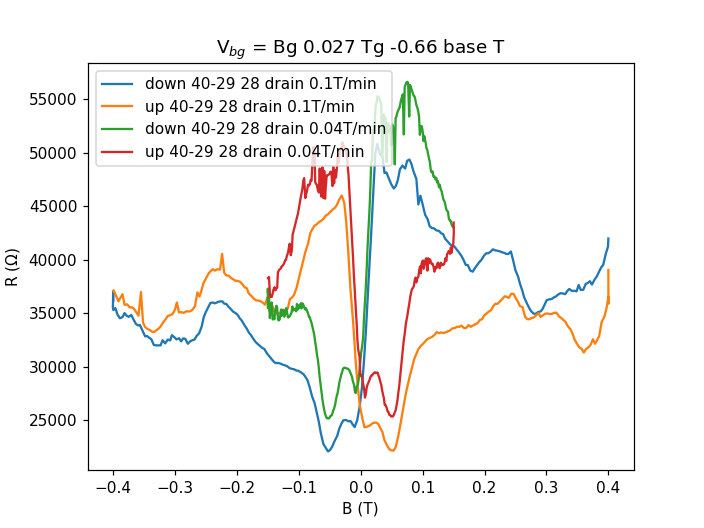

In [330]:
plt.figure()
plt.plot(data50.triton_field, data50.lockin830_X[:]/0.4e-9, label='down 40-29 28 drain 0.1T/min')
plt.plot(data51.triton_field, data51.lockin830_X[:]/0.4e-9, label='up 40-29 28 drain 0.1T/min')
plt.plot(data53.triton_field, data53.lockin830_X[:]/0.4e-9, label='down 40-29 28 drain 0.04T/min')
plt.plot(data54.triton_field, data54.lockin830_X[:]/0.4e-9, label='up 40-29 28 drain 0.04T/min')
plt.title('V$_{bg}$ = Bg 0.027 Tg -0.66 base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')
plt.legend()

still don't know what is going on... come back later

# critical current n dependence, D dependence, Fraunhofer pattern

In [331]:
srframe.volt_p1(0)
srframe.volt_p5(0)

In [333]:
triton.magnet_sweeprate(0.1)

In [334]:
triton.field(-0.0008)

Sweep time approximately 100.48 seconds


In [335]:
# Try a single gate sweep. along the D=0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 181)
data55, plot55 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nA_0T_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-08 17:04:53
DataSet:
   location = 'data/2020-05-08/#031_M30_865_29-28__830_40-41_0p5nA_0T_D0sweep_17-04-52'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (181,)
   Measured | lockin865_X    | X            | (181,)
   Measured | lockin865_Y    | Y            | (181,)
   Measured | lockin830_X    | X            | (181,)
   Measured | lockin830_Y    | Y            | (181,)
Finished at 2020-05-08 17:09:07


In [339]:
# Try a single gate sweep. along the D=0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 181)
data56, plot56 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nA_0T_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-08 17:12:29
DataSet:
   location = 'data/2020-05-08/#032_M30_865_29-28__830_40-41_0p5nA_0T_D0sweep_17-12-28'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (181,)
   Measured | lockin865_X    | X            | (181,)
   Measured | lockin865_Y    | Y            | (181,)
   Measured | lockin830_X    | X            | (181,)
   Measured | lockin830_Y    | Y            | (181,)
Finished at 2020-05-08 17:16:43


In [350]:
# Try a single gate sweep. along the D=0 100uV sensitivity
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 181)
data56, plot56 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nA_0T_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-08 17:21:42
DataSet:
   location = 'data/2020-05-08/#033_M30_865_29-28__830_40-41_0p5nA_0T_D0sweep_17-21-41'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (181,)
   Measured | lockin865_X    | X            | (181,)
   Measured | lockin865_Y    | Y            | (181,)
   Measured | lockin830_X    | X            | (181,)
   Measured | lockin830_Y    | Y            | (181,)
Finished at 2020-05-08 17:25:56


<IPython.core.display.Javascript object>


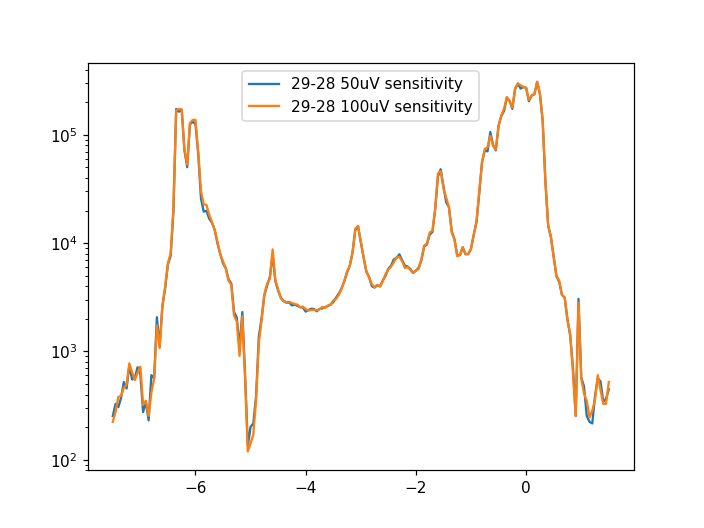

In [511]:
plt.figure()
plt.semilogy(data55.zeroDparam_set, npd.Rxxfromdata(data55, 0.5e-9, 'lockin830'), label='29-28 50uV sensitivity')
#plt.semilogy(data25.zeroDparam_set, npd.Rxxfromdata(data25, 0.5e-9, 'lockin8'), label='29-28 previous')
plt.semilogy(data56.zeroDparam_set, npd.Rxxfromdata(data56, 0.5e-9, 'lockin830'), label='29-28 100uV sensitivity')
plt.legend()

In [361]:
zeroDparam(-4.8)

In [362]:
#zeroDparam(-4.8)
srdc.volt(-7)
time.sleep(30)
Ivals = np.linspace(-7, 7, 281) 
data57, plot57 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_D0_zeroDparam-4p8')
srdc.volt(0)

Started at 2020-05-08 17:36:38
DataSet:
   location = 'data/2020-05-08/#035_M30_865_29-28__830_40-41_0p5nAexc_D0_zeroDparam-4p8_17-36-36'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (281,)
   Measured | lockin865_X   | X            | (281,)
   Measured | lockin865_Y   | Y            | (281,)
   Measured | lockin830_X   | X            | (281,)
   Measured | lockin830_Y   | Y            | (281,)
Finished at 2020-05-08 17:42:24


In [363]:
zeroDparam(-4.5)

In [364]:
srdc.volt(5)

In [365]:
offvals = np.linspace(5, -5, 201)
gvals = np.linspace(-4.5, -5.3, 33)
data58, plot58 = npd.twod_param_sweep(zeroDparam, gvals, srdc.volt, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=6, SetDelay2=1.1, DataName='M30_865_29-28__830_40-41_0p5nAexc_D0_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)
srframe.volt_p1(0)
srdc.volt(0)

Started at 2020-05-08 17:47:42
DataSet:
   location = 'data/2020-05-08/#036_M30_865_29-28__830_40-41_0p5nAexc_D0_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_17-47-39'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (33,)
   Setpoint | srdc_volt_set  | volt         | (33, 201)
   Measured | lockin865_X    | X            | (33, 201)
   Measured | lockin865_Y    | Y            | (33, 201)
   Measured | lockin830_X    | X            | (33, 201)
   Measured | lockin830_Y    | Y            | (33, 201)
Finished at 2020-05-08 20:04:47


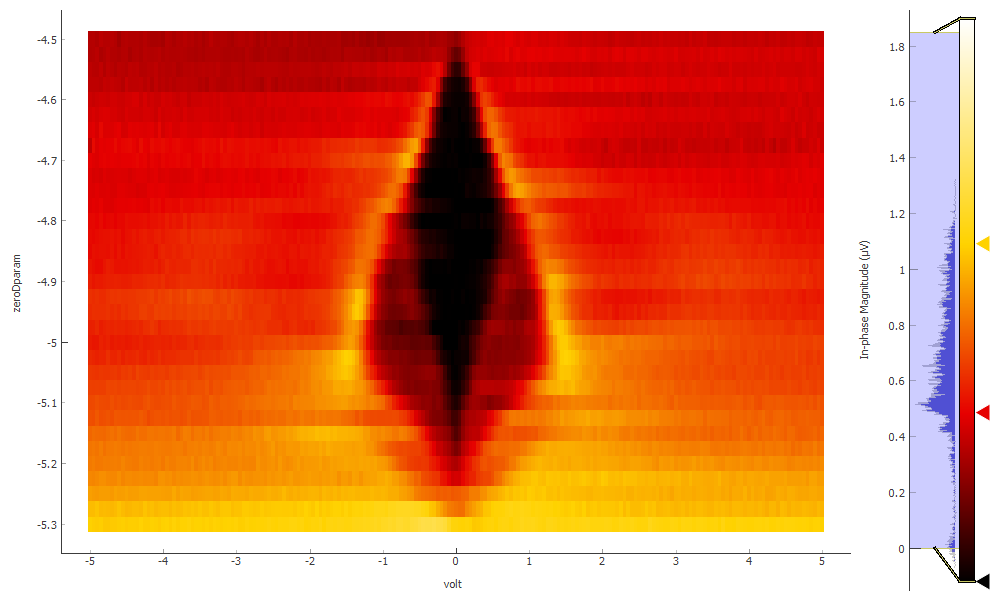

In [366]:
plot58[0]

In [367]:
zeroDparam(-4.8)

In [369]:
triton.field(-0.05)

Sweep time approximately 39.508 seconds


In [371]:
srdc.volt(-2)
time.sleep(30)
bvals = np.linspace(-0.05, 0.05, 51)
offvals = np.linspace(-2, 2, 41)
data59, plot59 = npd.twod_param_sweep(triton.field_set_stable, bvals, srdc.volt, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_D0_vbg-4p8V_FraunhoferbaseT_course')

Started at 2020-05-08 20:50:03
Please wait 10.06 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.122 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.23 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.188 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.212 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.193999999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for o

In [381]:
triton.field(-0.1)

Sweep time approximately 70.006 seconds


In [374]:
zeroDparam(-4.8)

In [379]:
srdc.volt(-2)
time.sleep(30)
bvals = np.linspace(-0.1, 0, 51)
offvals = np.linspace(-2, 2, 41)
data60, plot60 = npd.twod_param_sweep(triton.field_set_stable, bvals, srdc.volt, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_D0_vbg-4p8V_FraunhoferbaseT_course')

Started at 2020-05-08 21:33:24
Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.206 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.206 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.193999999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.193999999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.188 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.176 seconds for the field sweep, plus the time 

In [380]:
zeroDparam(-5.02)

In [394]:
triton.field(-0.05)

Sweep time approximately 42.394000000000005 seconds


In [393]:
srdc.volt(-2)
time.sleep(30)
bvals = np.linspace(-0.05, 0.05, 51)
offvals = np.linspace(-2, 2, 41)
data61, plot61 = npd.twod_param_sweep(triton.field_set_stable, bvals, srdc.volt, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_D0_vbg-5p02V_FraunhoferbaseT_course')

Started at 2020-05-08 22:52:20
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.14 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.176 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.206 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.193999999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for op

In [396]:
zeroDparam(-4.8)

In [397]:
# same as last fraunhofer but finer
srdc.volt(-2)
time.sleep(30)
bvals = np.linspace(-0.05, 0.05, 201)
offvals = np.linspace(-2, 2, 161)
data62, plot62 = npd.twod_param_sweep(triton.field_set_stable, bvals, srdc.volt, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_D0_vbg-4p8V_FraunhoferbaseT')

Started at 2020-05-08 23:41:33
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.312 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.288 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.216 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.288 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.312 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.318 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.294 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.246 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.276 seconds for the field sweep, plus the time required for ope

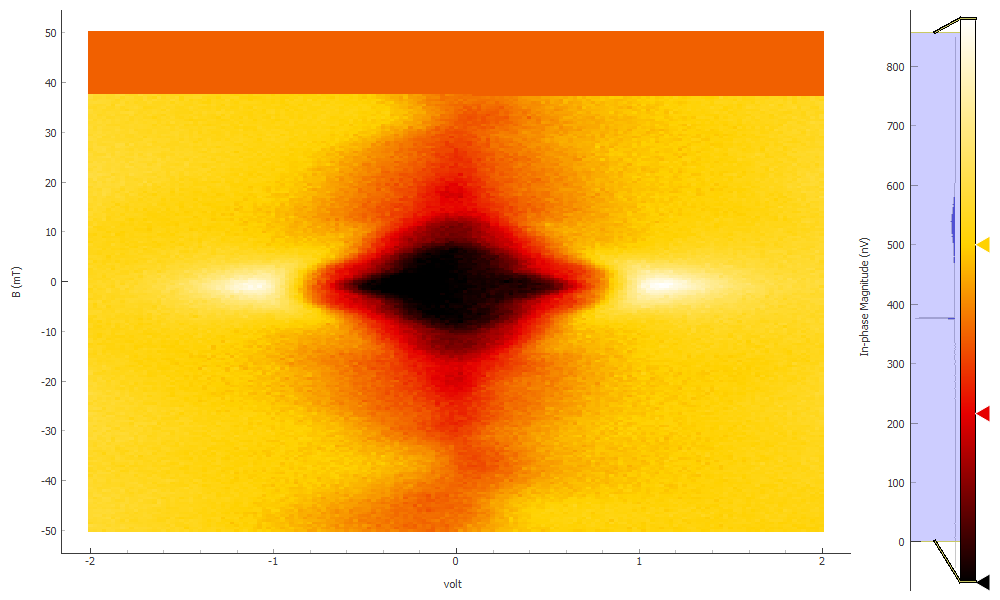

In [399]:
plot62[2]

In [408]:
triton.field()

-0.000843

In [426]:
srdc.volt()

0.0

In [428]:
zeroDparam(-4.8)

In [411]:
#zeroDparam(-4.8)
srdc.volt(-4)
time.sleep(30)
Ivals = np.linspace(-4, 4, 161) 
data63, plot63 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_D0_zeroDparam-4p8')
srdc.volt(0)

Started at 2020-05-09 10:47:40
DataSet:
   location = 'data/2020-05-09/#001_M30_865_29-28__830_40-41_0p5nAexc_D0_zeroDparam-4p8_10-47-38'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (161,)
   Measured | lockin865_X   | X            | (161,)
   Measured | lockin865_Y   | Y            | (161,)
   Measured | lockin830_X   | X            | (161,)
   Measured | lockin830_Y   | Y            | (161,)
Finished at 2020-05-09 10:50:56


In [430]:
def constant_n_maxholeSC_Dsw(Vb):
    slDrc = -0.2058088083627785
    b_maxSC_hole = -1.9757645602826737
    srframe.volt_p1(Vb)
    srframe.volt_p5(slDrc*Vb + b_maxSC_hole)
    
constant_n_maxholeSC = qc.Parameter('constant_n_maxholeSC', set_cmd=constant_n_maxholeSC_Dsw)

In [440]:
constant_n_maxholeSC(-10.5)

In [441]:
#constant_n_maxholeSC(-10.5)
srdc.volt(-5)
time.sleep(30)
Ivals = np.linspace(-5, 5, 201) 
data64, plot64 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-10p5')
srdc.volt(0)

Started at 2020-05-09 11:16:26
DataSet:
   location = 'data/2020-05-09/#002_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-10p5_11-16-24'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (201,)
   Measured | lockin865_X   | X            | (201,)
   Measured | lockin865_Y   | Y            | (201,)
   Measured | lockin830_X   | X            | (201,)
   Measured | lockin830_Y   | Y            | (201,)
Finished at 2020-05-09 11:20:31


In [442]:
constant_n_maxholeSC(-4.8)

In [443]:
#constant_n_maxholeSC(-4.8)
srdc.volt(-5)
time.sleep(60)
Ivals = np.linspace(-5, 5, 201) 
data65, plot65 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-4p8')
srdc.volt(0)

Started at 2020-05-09 11:22:48
DataSet:
   location = 'data/2020-05-09/#003_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-4p8_11-22-46'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (201,)
   Measured | lockin865_X   | X            | (201,)
   Measured | lockin865_Y   | Y            | (201,)
   Measured | lockin830_X   | X            | (201,)
   Measured | lockin830_Y   | Y            | (201,)
Finished at 2020-05-09 11:26:53


In [446]:
constant_n_maxholeSC(0.5)

In [449]:
#constant_n_maxholeSC(0.5)
srdc.volt(-5)
time.sleep(60)
Ivals = np.linspace(-5, 5, 401) 
data66, plot66 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_0p5')
srdc.volt(0)

Started at 2020-05-09 11:35:28
DataSet:
   location = 'data/2020-05-09/#005_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_0p5_11-35-26'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (401,)
   Measured | lockin865_X   | X            | (401,)
   Measured | lockin865_Y   | Y            | (401,)
   Measured | lockin830_X   | X            | (401,)
   Measured | lockin830_Y   | Y            | (401,)
Finished at 2020-05-09 11:43:37


<IPython.core.display.Javascript object>


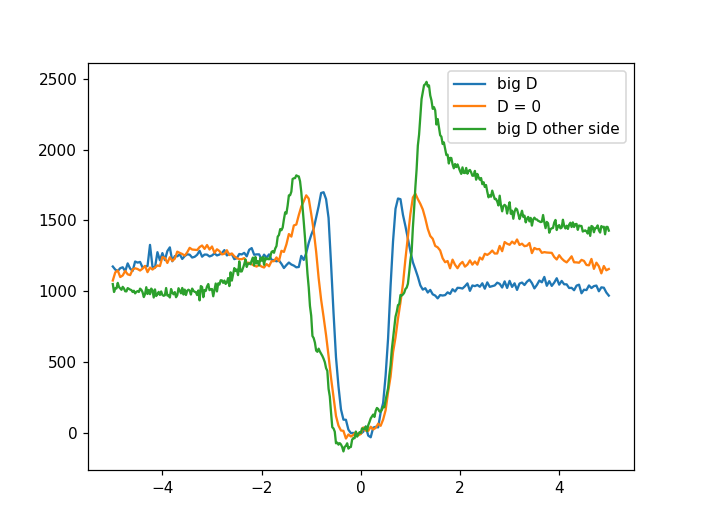

In [450]:
plt.figure()
plt.plot(data64.srdc_volt_set[:], data64.lockin865_X[:]/0.5e-9, label='big D')
plt.plot(data65.srdc_volt_set[:], data65.lockin865_X[:]/0.5e-9, label='D = 0')
plt.plot(data66.srdc_volt_set[:], data66.lockin865_X[:]/0.5e-9, label='big D other side')
plt.legend()

In [452]:
srdc.volt(4)

In [453]:
constant_n_maxholeSC(0.5)

In [454]:
time.sleep(60)
offvals = np.linspace(4, -4, 161)
gvals = np.linspace(0.5, -10.5, 45)
data67, plot67 = npd.twod_param_sweep(constant_n_maxholeSC, gvals, srdc.volt, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=6, SetDelay2=1.1, DataName='M30_865_29-28__830_40-41_0p5nAexc_maxSChole_cosntant_n_D_sweep_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)
srframe.volt_p1(0)
srdc.volt(0)

Started at 2020-05-09 11:50:49
DataSet:
   location = 'data/2020-05-09/#007_M30_865_29-28__830_40-41_0p5nAexc_maxSChole_cosntant_n_D_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_11-50-46'
   <Type>   | <array_id>               | <array.name>         | <array.shape>
   Setpoint | constant_n_maxholeSC_set | constant_n_maxholeSC | (45,)
   Setpoint | srdc_volt_set            | volt                 | (45, 161)
   Measured | lockin865_X              | X                    | (45, 161)
   Measured | lockin865_Y              | Y                    | (45, 161)
   Measured | lockin830_X              | X                    | (45, 161)
   Measured | lockin830_Y              | Y                    | (45, 161)
Finished at 2020-05-09 14:20:00


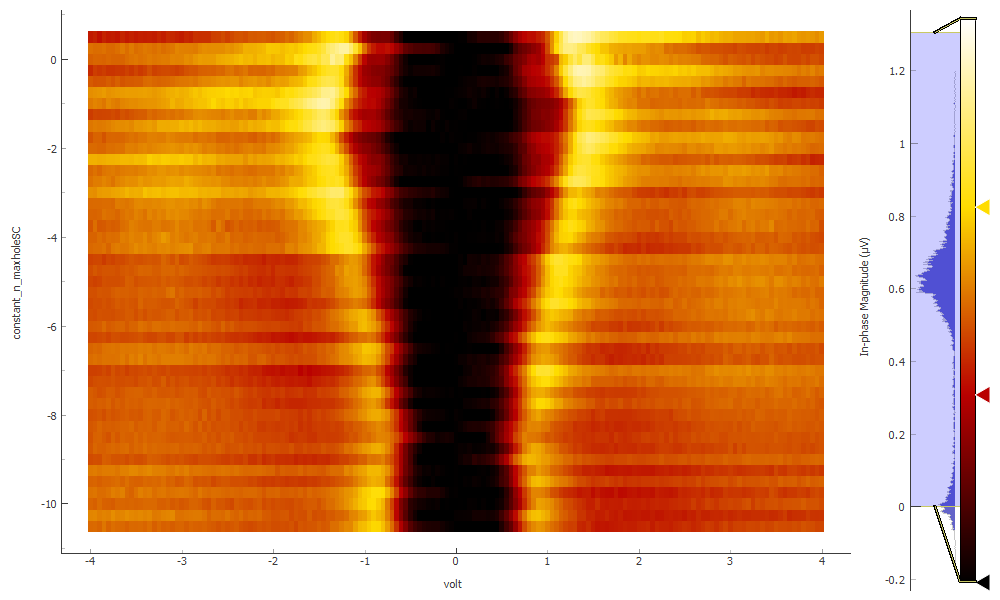

In [455]:
plot67[0]

In [459]:
def constant_n_holeSC2_Dsw(Vb):
    slDrc = -0.2058088083627785
    b_SC_hole2 = -2.0580880836277853
    srframe.volt_p1(Vb)
    srframe.volt_p5(slDrc*Vb + b_SC_hole2)
    
constant_n_holeSC2 = qc.Parameter('constant_n_holeSC2', set_cmd=constant_n_holeSC2_Dsw)

In [460]:
zeroDparam(-5)

In [463]:
constant_n_holeSC2(-10.7)

In [464]:
#constant_n_holeSC2(-10.7)
srdc.volt(-5)
time.sleep(30)
Ivals = np.linspace(-5, 5, 201) 
data68, plot68 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_holeSC2_-10p7')
srdc.volt(0)

Started at 2020-05-09 15:52:29
DataSet:
   location = 'data/2020-05-09/#008_M30_865_29-28__830_40-41_0p5nAexc_constant_n_holeSC2_-10p7_15-52-27'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (201,)
   Measured | lockin865_X   | X            | (201,)
   Measured | lockin865_Y   | Y            | (201,)
   Measured | lockin830_X   | X            | (201,)
   Measured | lockin830_Y   | Y            | (201,)
Finished at 2020-05-09 15:56:34


In [465]:
constant_n_holeSC2(-5)

In [466]:
#constant_n_holeSC2(-5)
srdc.volt(-5)
time.sleep(30)
Ivals = np.linspace(-5, 5, 201) 
data69, plot69 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_holeSC2_-5')
srdc.volt(0)

Started at 2020-05-09 15:58:04
DataSet:
   location = 'data/2020-05-09/#009_M30_865_29-28__830_40-41_0p5nAexc_constant_n_holeSC2_-5_15-58-02'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (201,)
   Measured | lockin865_X   | X            | (201,)
   Measured | lockin865_Y   | Y            | (201,)
   Measured | lockin830_X   | X            | (201,)
   Measured | lockin830_Y   | Y            | (201,)
Finished at 2020-05-09 16:02:18


In [467]:
constant_n_holeSC2(0.3)

In [469]:
#constant_n_holeSC2(0.3)
srdc.volt(-5)
time.sleep(30)
Ivals = np.linspace(-5, 5, 201) 
data70, plot70 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_holeSC2_0p3')
srdc.volt(0)

Started at 2020-05-09 16:03:54
DataSet:
   location = 'data/2020-05-09/#010_M30_865_29-28__830_40-41_0p5nAexc_constant_n_holeSC2_0p3_16-03-52'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (201,)
   Measured | lockin865_X   | X            | (201,)
   Measured | lockin865_Y   | Y            | (201,)
   Measured | lockin830_X   | X            | (201,)
   Measured | lockin830_Y   | Y            | (201,)
Finished at 2020-05-09 16:07:59


<IPython.core.display.Javascript object>


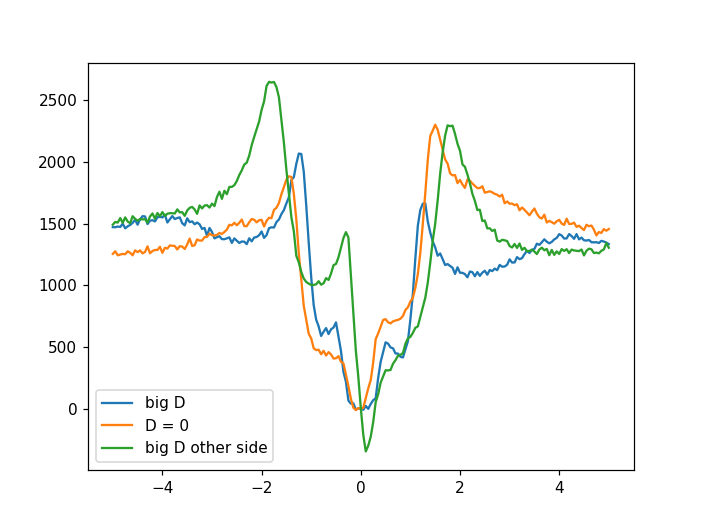

In [470]:
plt.figure()
plt.plot(data68.srdc_volt_set[:], data68.lockin865_X[:]/0.5e-9, label='big D')
plt.plot(data69.srdc_volt_set[:], data69.lockin865_X[:]/0.5e-9, label='D = 0')
plt.plot(data70.srdc_volt_set[:], data70.lockin865_X[:]/0.5e-9, label='big D other side')
plt.legend()

In [471]:
srdc.volt(4)

In [472]:
time.sleep(60)
offvals = np.linspace(4, -4, 161)
gvals = np.linspace(0.3, -10.7, 45)
data71, plot71 = npd.twod_param_sweep(constant_n_holeSC2, gvals, srdc.volt, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=6, SetDelay2=1.1, DataName='M30_865_29-28__830_40-41_0p5nAexc_SChole_cosntant_n_D_sweep2_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)
srframe.volt_p1(0)
srdc.volt(0)

Started at 2020-05-09 16:12:34
DataSet:
   location = 'data/2020-05-09/#011_M30_865_29-28__830_40-41_0p5nAexc_SChole_cosntant_n_D_sweep2_AC0.5nAdvdi_baseT_b=-0.8mT_16-12-31'
   <Type>   | <array_id>             | <array.name>       | <array.shape>
   Setpoint | constant_n_holeSC2_set | constant_n_holeSC2 | (45,)
   Setpoint | srdc_volt_set          | volt               | (45, 161)
   Measured | lockin865_X            | X                  | (45, 161)
   Measured | lockin865_Y            | Y                  | (45, 161)
   Measured | lockin830_X            | X                  | (45, 161)
   Measured | lockin830_Y            | Y                  | (45, 161)
Finished at 2020-05-09 18:42:07


In [473]:
constant_n_maxholeSC(-1.25)

In [479]:
#constant_n_maxholeSC(-1.25)
srdc.volt(-5)
time.sleep(30)
Ivals = np.linspace(-5, 5, 201) 
data72, plot72 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25')
srdc.volt(0)

Started at 2020-05-09 18:48:40
DataSet:
   location = 'data/2020-05-09/#012_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_18-48-39'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (201,)
   Measured | lockin865_X   | X            | (201,)
   Measured | lockin865_Y   | Y            | (201,)
   Measured | lockin830_X   | X            | (201,)
   Measured | lockin830_Y   | Y            | (201,)
Finished at 2020-05-09 18:52:46


In [480]:
triton.field(-0.05)

Sweep time approximately 39.538 seconds


In [481]:
srdc.volt(-3)
time.sleep(30)
bvals = np.linspace(-0.05, 0.05, 51)
offvals = np.linspace(-3, 3, 61)
data73, plot73 = npd.twod_param_sweep(triton.field_set_stable, bvals, srdc.volt, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_FraunhoferbaseT_course')

Started at 2020-05-09 18:59:48
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.14 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.206 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.206 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the sw

In [483]:
triton.field()

-0.049998

In [484]:
# same as last fraunhofer but finer
srdc.volt(-2)
time.sleep(30)
bvals = np.linspace(-0.05, 0.05, 201)
offvals = np.linspace(-2, 2, 161)
data74, plot74 = npd.twod_param_sweep(triton.field_set_stable, bvals, srdc.volt, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_FraunhoferbaseT')

Started at 2020-05-09 20:36:41
Please wait 10.03 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.264 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.324 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.228 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.318 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.3 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.3 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.3 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.3 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.294 seconds for the field sweep, plus the time required for operating th

In [486]:
triton.field(-0.025)

Sweep time approximately 55.0 seconds


In [487]:
# same as last fraunhofer but finer
srdc.volt(-2)
time.sleep(30)
bvals = np.linspace(-0.025, 0.025, 201)
offvals = np.linspace(-2, 2, 161)
data74, plot74 = npd.twod_param_sweep(triton.field_set_stable, bvals, srdc.volt, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_FraunhoferbaseT')

Started at 2020-05-10 09:30:01
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.162 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.168 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.132 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.138 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.162 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.138 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.168 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.174 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.174 seconds for the field sweep, plus the time required for ope

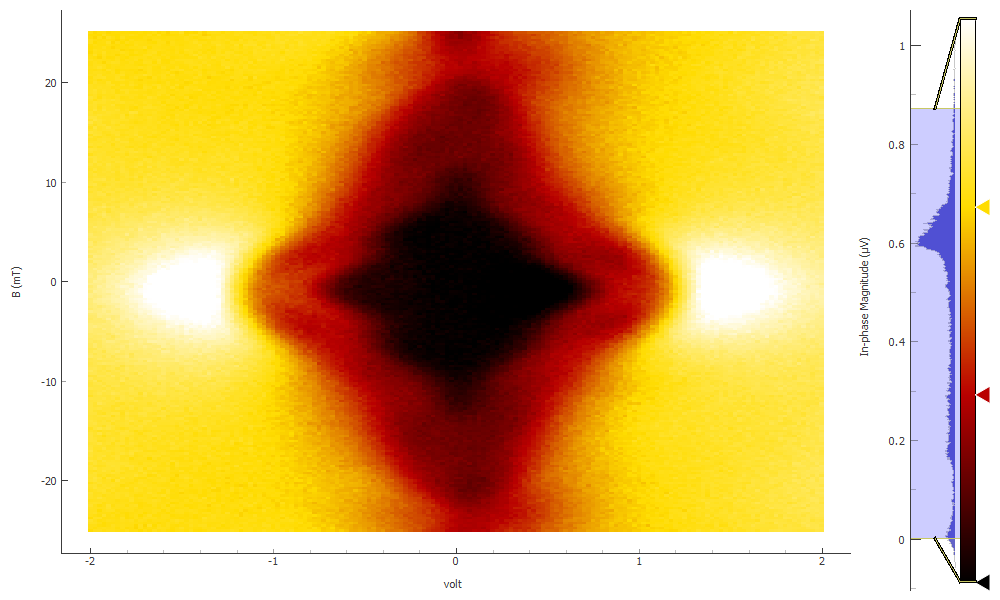

In [492]:
plot74[2]

In [489]:
triton.field()

-0.025078

In [490]:
constant_n_maxholeSC(-4.8)

In [493]:
# D = 0 to prove the supercurrent is smaller
srdc.volt(-2)
time.sleep(30)
bvals = np.linspace(-0.025, 0.025, 201)
offvals = np.linspace(-2, 2, 161)
data75, plot75 = npd.twod_param_sweep(triton.field_set_stable, bvals, srdc.volt, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-4p8_FraunhoferbaseT')

Started at 2020-05-10 22:02:19
Please wait 10.048 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.162 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.126 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.162 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.126 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.162 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.09 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.114 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.144 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.144 seconds for the field sweep, plus the time required for oper

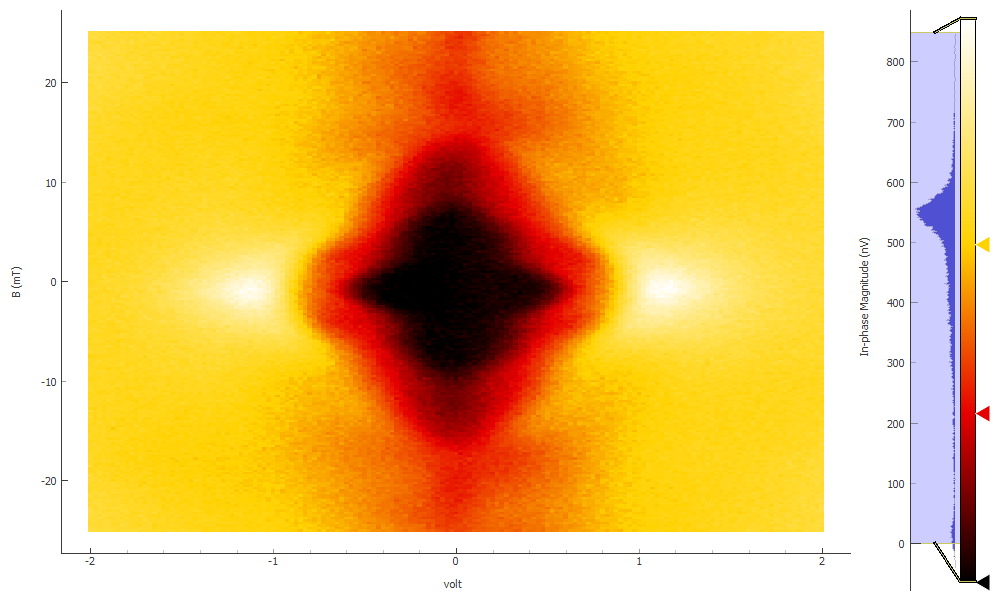

In [499]:
plot75[2]

# some gate sweep along different D line cut and come back to SC dependence

In [495]:
triton.field(-0.0008)

Sweep time approximately 25.48 seconds


In [498]:
srdc.volt(0)

In [506]:
#D=0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 451)
data76, plot76 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nA_-0p8mT_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-11 11:15:02
DataSet:
   location = 'data/2020-05-11/#002_M30_865_29-28__830_40-41_0p5nA_-0p8mT_D0sweep_11-15-01'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (451,)
   Measured | lockin865_X    | X            | (451,)
   Measured | lockin865_Y    | Y            | (451,)
   Measured | lockin830_X    | X            | (451,)
   Measured | lockin830_Y    | Y            | (451,)
Finished at 2020-05-11 11:25:28


switch lockin to have a try

In [517]:
#D=0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 451)
data77, plot77 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_1nA_-0p8mT_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-11 11:59:14
DataSet:
   location = 'data/2020-05-11/#004_M30_865_40-41__830_28-29_1nA_-0p8mT_D0sweep_11-59-13'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (451,)
   Measured | lockin865_X    | X            | (451,)
   Measured | lockin865_Y    | Y            | (451,)
   Measured | lockin830_X    | X            | (451,)
   Measured | lockin830_Y    | Y            | (451,)
Finished at 2020-05-11 12:09:40


In [524]:
#restart the lockin830 and try again

In [525]:
#restart the lockin830 and try again
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 451)
data78, plot78 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_1nA_-0p8mT_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-11 12:26:23
DataSet:
   location = 'data/2020-05-11/#005_M30_865_40-41__830_28-29_1nA_-0p8mT_D0sweep_12-26-22'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (451,)
   Measured | lockin865_X    | X            | (451,)
   Measured | lockin865_Y    | Y            | (451,)
   Measured | lockin830_X    | X            | (451,)
   Measured | lockin830_Y    | Y            | (451,)
Finished at 2020-05-11 12:36:56


In [527]:
#restart the lockin830 now it is normal

In [528]:
lockin865.amplitude(0.05)

In [529]:
#D = 0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 451)
data79, plot79 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_0.5nA_-0p8mT_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-11 12:42:36
DataSet:
   location = 'data/2020-05-11/#006_M30_865_40-41__830_28-29_0.5nA_-0p8mT_D0sweep_12-42-35'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (451,)
   Measured | lockin865_X    | X            | (451,)
   Measured | lockin865_Y    | Y            | (451,)
   Measured | lockin830_X    | X            | (451,)
   Measured | lockin830_Y    | Y            | (451,)
Finished at 2020-05-11 12:53:08


In [532]:
#D = 0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 451)
data80, plot80 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_0.5nA_-0p8mT_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-11 14:23:35
DataSet:
   location = 'data/2020-05-11/#007_M30_865_40-41__830_28-29_0.5nA_-0p8mT_D0sweep_14-23-34'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (451,)
   Measured | lockin865_X    | X            | (451,)
   Measured | lockin865_Y    | Y            | (451,)
   Measured | lockin830_X    | X            | (451,)
   Measured | lockin830_Y    | Y            | (451,)
Finished at 2020-05-11 14:34:08


In [538]:
def constant_D_redline_nsw(Vb):
    slDrc = -0.2058088083627785
    srframe.volt_p1(Vb)
    srframe.volt_p5(-slDrc*Vb - 2.2)
    
constant_D_redline_nsw = qc.Parameter('constant_D_redline_nsw', set_cmd=constant_D_redline_nsw)

In [541]:
constant_D_redline_nsw(0)

In [542]:
#redline
constant_D_redline_nsw(0)
time.sleep(60)
bgnvals = np.linspace(0, 6, 301)
data81, plot81 = npd.single_param_sweep(constant_D_redline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_0.5nA_-0p8mT_redline_sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-11 14:41:15
DataSet:
   location = 'data/2020-05-11/#008_M30_865_40-41__830_28-29_0.5nA_-0p8mT_redline_sweep_14-41-14'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (301,)
   Measured | lockin865_X                | X                      | (301,)
   Measured | lockin865_Y                | Y                      | (301,)
   Measured | lockin830_X                | X                      | (301,)
   Measured | lockin830_Y                | Y                      | (301,)
Finished at 2020-05-11 14:48:17


In [559]:
def constant_D_greenline_nsw(Vb):
    slDrc = -0.2058088083627785
    srframe.volt_p1(Vb)
    srframe.volt_p5(-slDrc*Vb - 1.2)
    
constant_D_greenline_nsw = qc.Parameter('constant_D_greenline_nsw', set_cmd=constant_D_greenline_nsw)

In [564]:
constant_D_greenline_nsw(-4)

In [565]:
#greenline
constant_D_greenline_nsw(-4)
time.sleep(60)
bgnvals = np.linspace(-4, 3.9, 396)
data82, plot82 = npd.single_param_sweep(constant_D_greenline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_0.5nA_-0p8mT_greenline_sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-11 15:02:50
DataSet:
   location = 'data/2020-05-11/#010_M30_865_40-41__830_28-29_0.5nA_-0p8mT_greenline_sweep_15-02-49'
   <Type>   | <array_id>                   | <array.name>             | <array.shape>
   Setpoint | constant_D_greenline_nsw_set | constant_D_greenline_nsw | (396,)
   Measured | lockin865_X                  | X                        | (396,)
   Measured | lockin865_Y                  | Y                        | (396,)
   Measured | lockin830_X                  | X                        | (396,)
   Measured | lockin830_Y                  | Y                        | (396,)
Finished at 2020-05-11 15:12:06


In [584]:
def constant_D_greyline_nsw(Vb):
    slDrc = -0.2058088083627785
    srframe.volt_p1(Vb)
    srframe.volt_p5(-slDrc*Vb + 1.3)
    
constant_D_greyline_nsw = qc.Parameter('constant_D_greyline_nsw', set_cmd=constant_D_greyline_nsw)

In [587]:
constant_D_greyline_nsw(-10)

In [588]:
#greyline
constant_D_greyline_nsw(-10)
time.sleep(60)
bgnvals = np.linspace(-10, -2, 401)
data83, plot83 = npd.single_param_sweep(constant_D_greyline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_0.5nA_-0p8mT_greyline_sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-11 15:24:08
DataSet:
   location = 'data/2020-05-11/#011_M30_865_40-41__830_28-29_0.5nA_-0p8mT_greyline_sweep_15-24-07'
   <Type>   | <array_id>                  | <array.name>            | <array.shape>
   Setpoint | constant_D_greyline_nsw_set | constant_D_greyline_nsw | (401,)
   Measured | lockin865_X                 | X                       | (401,)
   Measured | lockin865_Y                 | Y                       | (401,)
   Measured | lockin830_X                 | X                       | (401,)
   Measured | lockin830_Y                 | Y                       | (401,)
Finished at 2020-05-11 15:33:31


In [608]:
def constant_D_orangeline_nsw(Vb):
    slDrc = -0.2058088083627785
    srframe.volt_p1(Vb)
    srframe.volt_p5(-slDrc*Vb + 2.9)
    
constant_D_orangeline_nsw = qc.Parameter('constant_D_orangeline_nsw', set_cmd=constant_D_orangeline_nsw)

In [610]:
constant_D_orangeline_nsw(-13)

In [611]:
#orangeline
constant_D_orangeline_nsw(-13)
time.sleep(60)
bgnvals = np.linspace(-13, -6.8, 311)
data84, plot84 = npd.single_param_sweep(constant_D_orangeline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_0.5nA_-0p8mT_orangeline_sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-11 15:51:37
DataSet:
   location = 'data/2020-05-11/#012_M30_865_40-41__830_28-29_0.5nA_-0p8mT_orangeline_sweep_15-51-36'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (311,)
   Measured | lockin865_X                   | X                         | (311,)
   Measured | lockin865_Y                   | Y                         | (311,)
   Measured | lockin830_X                   | X                         | (311,)
   Measured | lockin830_Y                   | Y                         | (311,)
Finished at 2020-05-11 15:58:53


<IPython.core.display.Javascript object>


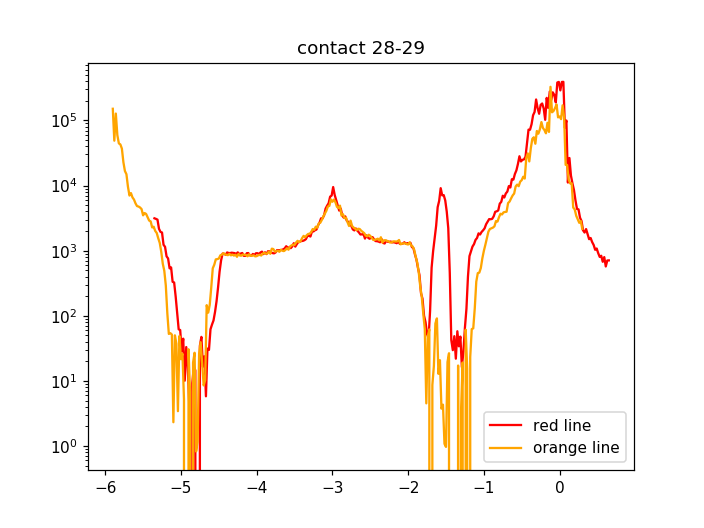

In [622]:
plt.figure()
#plt.semilogy(data79.zeroDparam_set, npd.Rxxfromdata(data79, 0.5e-9, 'lockin865'), label='D=0')
plt.semilogy(data81.constant_D_redline_nsw_set[:]-5.35, npd.Rxxfromdata(data81, 0.5e-9, 'lockin865'), label='red line', color='red')
#plt.semilogy(data82.constant_D_greenline_nsw_set[:]-2.95, npd.Rxxfromdata(data82, 0.5e-9, 'lockin865'), label='green line', color='green')
#plt.semilogy(data83.constant_D_greyline_nsw_set[:]+3.2, npd.Rxxfromdata(data83, 0.5e-9, 'lockin865'), label='grey line', color='grey')
plt.semilogy(data84.constant_D_orangeline_nsw_set[:]+7.1, npd.Rxxfromdata(data84, 0.5e-9, 'lockin865'), label='orange line', color='orange')
plt.title('contact 28-29')
plt.legend()

<IPython.core.display.Javascript object>


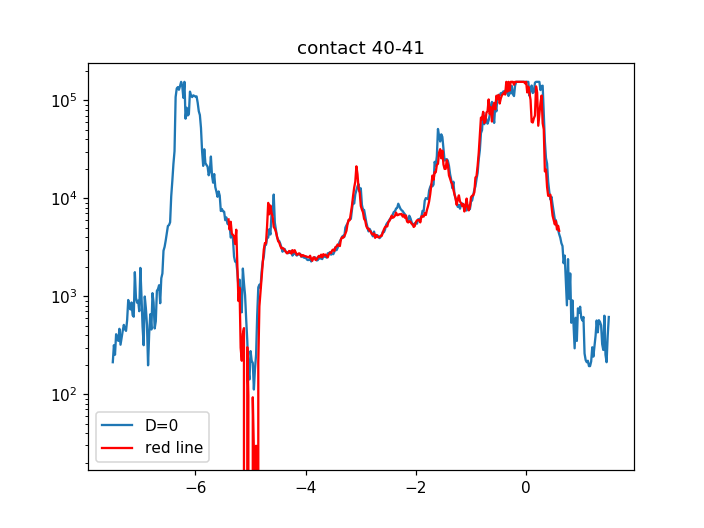

In [637]:
plt.figure()
plt.semilogy(data79.zeroDparam_set, npd.Rxxfromdata(data79, 0.5e-9, 'lockin830'), label='D=0')
plt.semilogy(data81.constant_D_redline_nsw_set[:]-5.4, npd.Rxxfromdata(data81, 0.5e-9, 'lockin830'), label='red line', color='red')
#plt.semilogy(data82.constant_D_greenline_nsw_set[:]-2.95, npd.Rxxfromdata(data82, 0.5e-9, 'lockin830'), label='green line', color='green')
#plt.semilogy(data83.constant_D_greyline_nsw_set[:]+3.2, npd.Rxxfromdata(data83, 0.5e-9, 'lockin830'), label='grey line', color='grey')
#plt.semilogy(data84.constant_D_orangeline_nsw_set[:]+7.1, npd.Rxxfromdata(data84, 0.5e-9, 'lockin830'), label='orange line', color='orange')
plt.title('contact 40-41')
plt.legend()

# now go back to critical current-n, D dependence, focus on  40-41

In [635]:
constant_D_redline_nsw(0)

In [638]:
srdc.volt(4)

In [639]:
offvals = np.linspace(4, -4, 161)
gvals = np.linspace(0, 0.7, 29)
data85, plot85 = npd.twod_param_sweep(constant_D_redline_nsw, gvals, srdc.volt, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=6, SetDelay2=1.1, DataName='M30_865_29-28__830_40-41_0p5nAexc_constantDcut_redline_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)
srframe.volt_p1(0)
srdc.volt(0)

Started at 2020-05-11 16:37:05
DataSet:
   location = 'data/2020-05-11/#013_M30_865_29-28__830_40-41_0p5nAexc_constantDcut_redline_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_16-37-02'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (29,)
   Setpoint | srdc_volt_set              | volt                   | (29, 161)
   Measured | lockin865_X                | X                      | (29, 161)
   Measured | lockin865_Y                | Y                      | (29, 161)
   Measured | lockin830_X                | X                      | (29, 161)
   Measured | lockin830_Y                | Y                      | (29, 161)
Finished at 2020-05-11 18:14:07


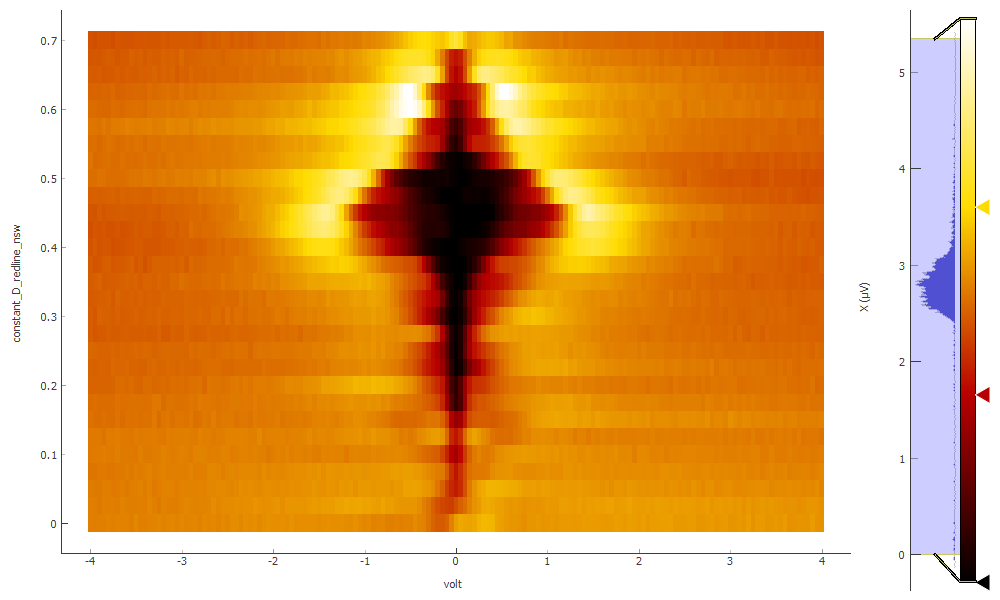

In [652]:
plot85[2]

In [640]:
def constant_n_maxSC_40_41_Dsw(Vb):
    slDrc = -0.2058088083627785
    x8 = 0.475
    b_maxSC_hole40_41 = x8*(-slDrc) - 2.2 - x8*slDrc
    srframe.volt_p1(Vb)
    srframe.volt_p5(Vb*slDrc + b_maxSC_hole40_41)
    
constant_n_maxSC_40_41_Dsw = qc.Parameter('constant_n_maxSC_40_41_Dsw', set_cmd=constant_n_maxSC_40_41_Dsw)

In [648]:
constant_n_maxSC_40_41_Dsw(0.5)

In [649]:
srdc.volt(4)

In [650]:
time.sleep(60)
offvals = np.linspace(4, -4, 161)
gvals = np.linspace(0.5, -10.5, 45)
data86, plot86 = npd.twod_param_sweep(constant_n_maxSC_40_41_Dsw, gvals, srdc.volt, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=6, SetDelay2=1.1, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxSC_40_41_Dsw_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)
srframe.volt_p1(0)
srdc.volt(0)

Started at 2020-05-11 18:39:31
DataSet:
   location = 'data/2020-05-11/#014_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxSC_40_41_Dsw_AC0.5nAdvdi_baseT_b=-0.8mT_18-39-28'
   <Type>   | <array_id>                     | <array.name>               | <array.shape>
   Setpoint | constant_n_maxSC_40_41_Dsw_set | constant_n_maxSC_40_41_Dsw | (45,)
   Setpoint | srdc_volt_set                  | volt                       | (45, 161)
   Measured | lockin865_X                    | X                          | (45, 161)
   Measured | lockin865_Y                    | Y                          | (45, 161)
   Measured | lockin830_X                    | X                          | (45, 161)
   Measured | lockin830_Y                    | Y                          | (45, 161)
Finished at 2020-05-11 21:10:15


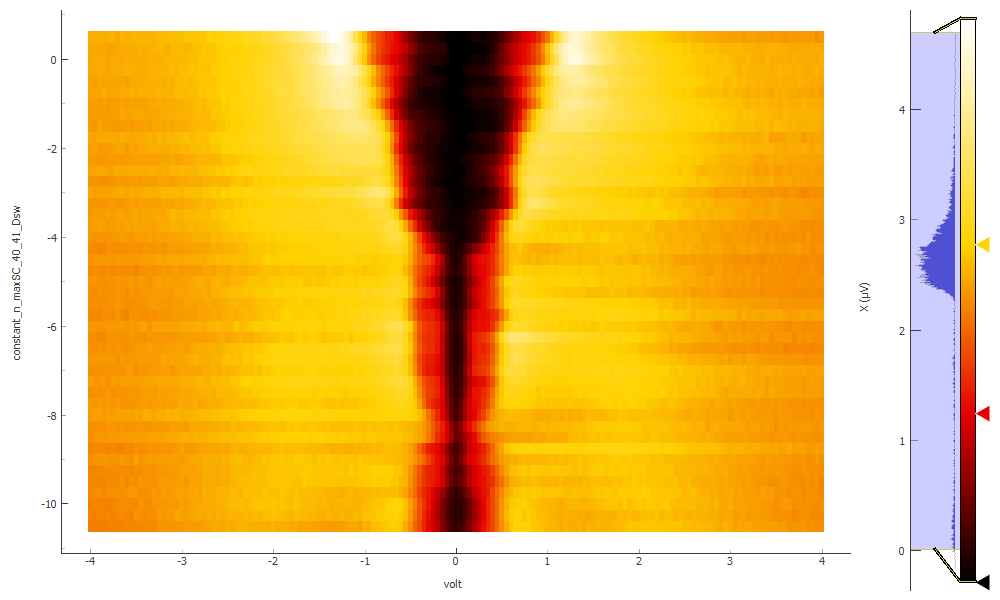

In [651]:
plot86[2]

In [655]:
# see the dvdi asymmtery has direction dependent or not

In [653]:
constant_n_maxholeSC(-1.25)

In [654]:
#constant_n_maxholeSC(-1.25)
srdc.volt(-5)
time.sleep(30)
Ivals = np.linspace(-5, 5, 201) 
data87, plot87 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25')
srdc.volt(0)

Started at 2020-05-11 21:31:12
DataSet:
   location = 'data/2020-05-11/#015_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_21-31-10'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (201,)
   Measured | lockin865_X   | X            | (201,)
   Measured | lockin865_Y   | Y            | (201,)
   Measured | lockin830_X   | X            | (201,)
   Measured | lockin830_Y   | Y            | (201,)
Finished at 2020-05-11 21:35:20


In [656]:
#constant_n_maxholeSC(-1.25)
srdc.volt(5)
time.sleep(30)
Ivals = np.linspace(5, -5, 201) 
data88, plot88 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25')
srdc.volt(0)

Started at 2020-05-11 21:36:07
DataSet:
   location = 'data/2020-05-11/#016_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_21-36-05'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (201,)
   Measured | lockin865_X   | X            | (201,)
   Measured | lockin865_Y   | Y            | (201,)
   Measured | lockin830_X   | X            | (201,)
   Measured | lockin830_Y   | Y            | (201,)
Finished at 2020-05-11 21:40:15


In [660]:
lockin865.sine_outdc(2)

In [661]:
#constant_n_maxholeSC(-1.25)
lockin865.sine_outdc(2)
time.sleep(30)
Ivals = np.linspace(2, -2, 161) 
data89, plot89 = npd.single_param_sweep(lockin865.sine_outdc, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25')
srdc.volt(0)

Started at 2020-05-11 21:48:20
DataSet:
   location = 'data/2020-05-11/#017_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_21-48-19'
   <Type>   | <array_id>               | <array.name> | <array.shape>
   Setpoint | lockin865_sine_outdc_set | sine_outdc   | (161,)
   Measured | lockin865_X              | X            | (161,)
   Measured | lockin865_Y              | Y            | (161,)
   Measured | lockin830_X              | X            | (161,)
   Measured | lockin830_Y              | Y            | (161,)
Finished at 2020-05-11 21:51:40


In [662]:
lockin865.sine_outdc(0)

In [ ]:
#seems better try direct plug in

In [663]:
#constant_n_maxholeSC(-1.25)
lockin865.sine_outdc(2)
time.sleep(30)
Ivals = np.linspace(2, -2, 161) 
data89, plot89 = npd.single_param_sweep(lockin865.sine_outdc, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25')
lockin865.sine_outdc(0)

Started at 2020-05-11 21:55:42
DataSet:
   location = 'data/2020-05-11/#018_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_21-55-40'
   <Type>   | <array_id>               | <array.name> | <array.shape>
   Setpoint | lockin865_sine_outdc_set | sine_outdc   | (161,)
   Measured | lockin865_X              | X            | (161,)
   Measured | lockin865_Y              | Y            | (161,)
   Measured | lockin830_X              | X            | (161,)
   Measured | lockin830_Y              | Y            | (161,)
Finished at 2020-05-11 21:59:01


In [664]:
#now use the new dc source but turn floating to ground

In [665]:
#constant_n_maxholeSC(-1.25)
srdc.volt(2)
time.sleep(30)
Ivals = np.linspace(2, -2, 161) 
data90, plot90 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25')
srdc.volt(0)

Started at 2020-05-11 22:08:27
DataSet:
   location = 'data/2020-05-11/#019_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_22-08-25'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (161,)
   Measured | lockin865_X   | X            | (161,)
   Measured | lockin865_Y   | Y            | (161,)
   Measured | lockin830_X   | X            | (161,)
   Measured | lockin830_Y   | Y            | (161,)
Finished at 2020-05-11 22:11:46


In [666]:
#constant_n_maxholeSC(-1.25)
srdc.volt(5)
time.sleep(30)
Ivals = np.linspace(5, -5, 201) 
data91, plot91 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25')
srdc.volt(0)

Started at 2020-05-11 22:18:12
DataSet:
   location = 'data/2020-05-11/#020_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_22-18-10'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (201,)
   Measured | lockin865_X   | X            | (201,)
   Measured | lockin865_Y   | Y            | (201,)
   Measured | lockin830_X   | X            | (201,)
   Measured | lockin830_Y   | Y            | (201,)
Finished at 2020-05-11 22:22:20


In [667]:
constant_n_maxholeSC(-8.8)

In [668]:
#constant_n_maxholeSC(-8.8)
srdc.volt(5)
time.sleep(30)
Ivals = np.linspace(5, -5, 201) 
data92, plot92 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25')
srdc.volt(0)

Started at 2020-05-11 22:24:57
DataSet:
   location = 'data/2020-05-11/#021_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_22-24-55'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (201,)
   Measured | lockin865_X   | X            | (201,)
   Measured | lockin865_Y   | Y            | (201,)
   Measured | lockin830_X   | X            | (201,)
   Measured | lockin830_Y   | Y            | (201,)
Finished at 2020-05-11 22:29:05


In [669]:
#constant_n_maxholeSC(-8.8) floating
srdc.volt(5)
time.sleep(30)
Ivals = np.linspace(5, -5, 201) 
data93, plot93 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25')
srdc.volt(0)

Started at 2020-05-11 22:30:25
DataSet:
   location = 'data/2020-05-11/#022_M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-1p25_22-30-23'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (201,)
   Measured | lockin865_X   | X            | (201,)
   Measured | lockin865_Y   | Y            | (201,)
   Measured | lockin830_X   | X            | (201,)
   Measured | lockin830_Y   | Y            | (201,)
Finished at 2020-05-11 22:34:33


In [670]:
triton.field(-0.025)

Sweep time approximately 24.508 seconds


In [671]:
#constant_n_maxholeSC(-8.8) floating
srdc.volt(-2)
time.sleep(30)
bvals = np.linspace(-0.025, 0.025, 201)
offvals = np.linspace(-2, 2, 161)
data94, plot94 = npd.twod_param_sweep(triton.field_set_stable, bvals, srdc.volt, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_maxholeSC_-8p8_FraunhoferbaseT')

Started at 2020-05-11 22:39:06
Please wait 10.036 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.12 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.156 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.108 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.144 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.168 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.12 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.114 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.168 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.144 seconds for the field sweep, plus the time required for opera

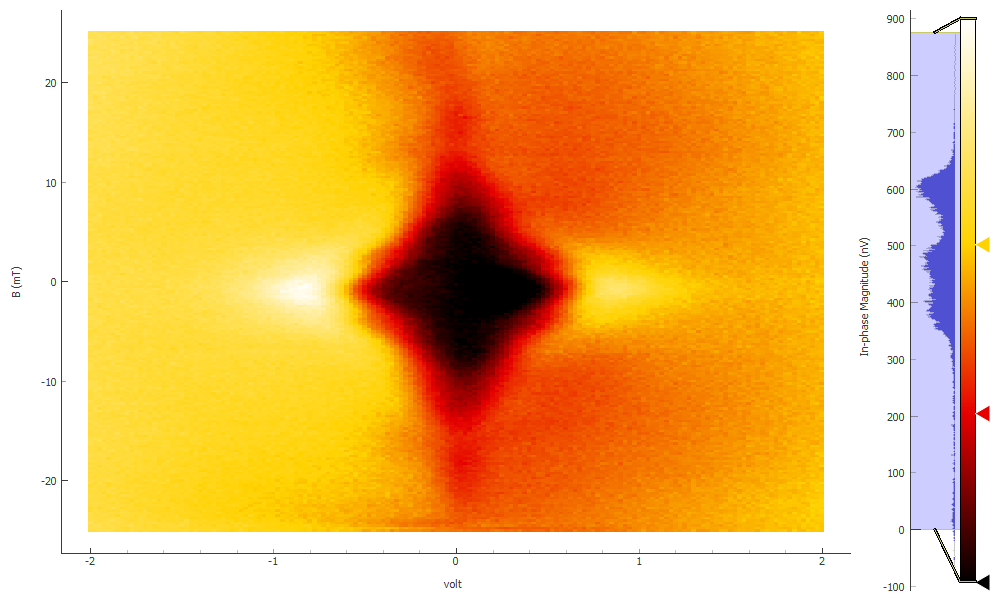

In [687]:
plot94[2]

In [677]:
srdc.volt(0)

In [678]:
def constant_n_SC2_40_41_Dsw(Vb):
    slDrc = -0.2058088083627785
    x10 = 0.45
    b_SC2_hole40_41 = x10*(-slDrc) - 2.2 - x10*slDrc
    srframe.volt_p1(Vb)
    srframe.volt_p5(Vb*slDrc + b_SC2_hole40_41)
    
constant_n_SC2_40_41_Dsw = qc.Parameter('constant_n_SC2_40_41_Dsw', set_cmd=constant_n_SC2_40_41_Dsw)

In [680]:
constant_n_SC2_40_41_Dsw(0.5)

In [681]:
#constant_n_SC2_40_41_Dsw(0.5)
lockin865.sine_outdc(-2)
time.sleep(30)
Ivals = np.linspace(-2, 2, 161) 
data95, plot95 = npd.single_param_sweep(lockin865.sine_outdc, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_0p5')
lockin865.sine_outdc(0)

Started at 2020-05-12 12:38:57
DataSet:
   location = 'data/2020-05-12/#001_M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_0p5_12-38-55'
   <Type>   | <array_id>               | <array.name> | <array.shape>
   Setpoint | lockin865_sine_outdc_set | sine_outdc   | (161,)
   Measured | lockin865_X              | X            | (161,)
   Measured | lockin865_Y              | Y            | (161,)
   Measured | lockin830_X              | X            | (161,)
   Measured | lockin830_Y              | Y            | (161,)
Finished at 2020-05-12 12:42:16


In [683]:
#constant_n_SC2_40_41_Dsw(0.5) floating
srdc.volt(-2)
time.sleep(30)
Ivals = np.linspace(-2, 2, 161) 
data96, plot96 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_0p5')
srdc.volt(0)

Started at 2020-05-12 12:48:34
DataSet:
   location = 'data/2020-05-12/#002_M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_0p5_12-48-32'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (161,)
   Measured | lockin865_X   | X            | (161,)
   Measured | lockin865_Y   | Y            | (161,)
   Measured | lockin830_X   | X            | (161,)
   Measured | lockin830_Y   | Y            | (161,)
Finished at 2020-05-12 12:51:53


In [684]:
#constant_n_SC2_40_41_Dsw(0.5) ground
srdc.volt(-2)
time.sleep(30)
Ivals = np.linspace(-2, 2, 161) 
data97, plot97 = npd.single_param_sweep(srdc.volt, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_0p5')
srdc.volt(0)

Started at 2020-05-12 12:53:22
DataSet:
   location = 'data/2020-05-12/#003_M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_0p5_12-53-20'
   <Type>   | <array_id>    | <array.name> | <array.shape>
   Setpoint | srdc_volt_set | volt         | (161,)
   Measured | lockin865_X   | X            | (161,)
   Measured | lockin865_Y   | Y            | (161,)
   Measured | lockin830_X   | X            | (161,)
   Measured | lockin830_Y   | Y            | (161,)
Finished at 2020-05-12 12:56:40


In [685]:
lockin865.sine_outdc(-2)

In [686]:
time.sleep(60)
offvals = np.linspace(-2, 2, 161)
gvals = np.linspace(0.5, -10.5, 45)
data98, plot98 = npd.twod_param_sweep(constant_n_SC2_40_41_Dsw, gvals, lockin865.sine_outdc, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=6, SetDelay2=1.1, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)
srframe.volt_p1(0)
lockin865.sine_outdc(0)

Started at 2020-05-12 13:03:05
DataSet:
   location = 'data/2020-05-12/#004_M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_AC0.5nAdvdi_baseT_b=-0.8mT_13-03-02'
   <Type>   | <array_id>                   | <array.name>             | <array.shape>
   Setpoint | constant_n_SC2_40_41_Dsw_set | constant_n_SC2_40_41_Dsw | (45,)
   Setpoint | lockin865_sine_outdc_set     | sine_outdc               | (45, 161)
   Measured | lockin865_X                  | X                        | (45, 161)
   Measured | lockin865_Y                  | Y                        | (45, 161)
   Measured | lockin830_X                  | X                        | (45, 161)
   Measured | lockin830_Y                  | Y                        | (45, 161)
Finished at 2020-05-12 15:30:25


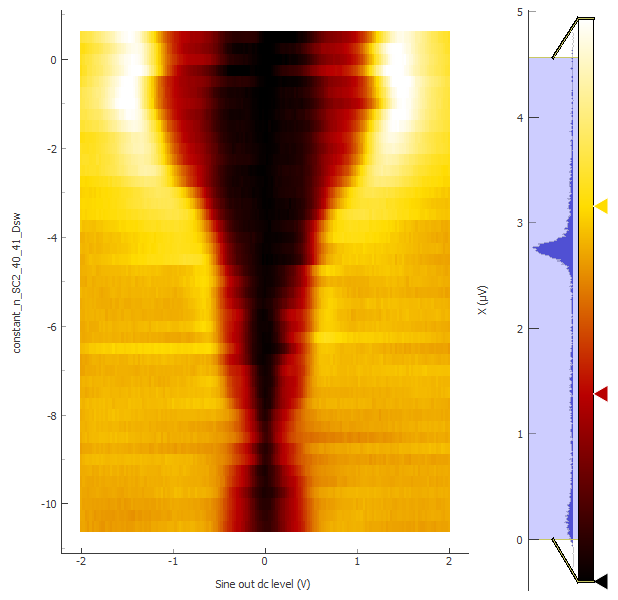

In [703]:
plot98[2]

In [688]:
constant_n_SC2_40_41_Dsw(-1)

In [689]:
#constant_n_SC2_40_41_Dsw(-1)
lockin865.sine_outdc(-2)
time.sleep(30)
Ivals = np.linspace(-2, 2, 161) 
data99, plot99 = npd.single_param_sweep(lockin865.sine_outdc, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_-1')
lockin865.sine_outdc(0)

Started at 2020-05-12 15:42:51
DataSet:
   location = 'data/2020-05-12/#005_M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_-1_15-42-49'
   <Type>   | <array_id>               | <array.name> | <array.shape>
   Setpoint | lockin865_sine_outdc_set | sine_outdc   | (161,)
   Measured | lockin865_X              | X            | (161,)
   Measured | lockin865_Y              | Y            | (161,)
   Measured | lockin830_X              | X            | (161,)
   Measured | lockin830_Y              | Y            | (161,)
Finished at 2020-05-12 15:46:10


In [692]:
constant_n_SC2_40_41_Dsw(-4.9)

In [693]:
#constant_n_SC2_40_41_Dsw(-4.9)
lockin865.sine_outdc(-2)
time.sleep(30)
Ivals = np.linspace(-2, 2, 161) 
data100, plot100 = npd.single_param_sweep(lockin865.sine_outdc, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_-4p9')
lockin865.sine_outdc(0)

Started at 2020-05-12 15:51:04
DataSet:
   location = 'data/2020-05-12/#006_M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_-4p9_15-51-02'
   <Type>   | <array_id>               | <array.name> | <array.shape>
   Setpoint | lockin865_sine_outdc_set | sine_outdc   | (161,)
   Measured | lockin865_X              | X            | (161,)
   Measured | lockin865_Y              | Y            | (161,)
   Measured | lockin830_X              | X            | (161,)
   Measured | lockin830_Y              | Y            | (161,)
Finished at 2020-05-12 15:54:23


In [694]:
constant_n_SC2_40_41_Dsw(-1)

In [697]:
triton.field(-0.05)

Sweep time approximately 42.412 seconds


In [696]:
lockin865.sine_outdc(-2)
time.sleep(30)
bvals = np.linspace(-0.05, 0.05, 51)
offvals = np.linspace(-2, 2, 81)
data101, plot101 = npd.twod_param_sweep(triton.field_set_stable, bvals, lockin865.sine_outdc, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_-1_FraunhoferbaseT_course')

Started at 2020-05-12 15:59:18
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.206 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.23 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.188 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.212 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.193999999999999 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.2 seconds for the field sweep, plus the time required for operating the switch...
Please wait 11.193999999999999 seconds for the field sweep, plus the time

In [698]:
lockin865.sine_outdc(-2)
time.sleep(30)
bvals = np.linspace(-0.025, 0.025, 201)
offvals = np.linspace(-2, 2, 161)
data102, plot102 = npd.twod_param_sweep(triton.field_set_stable, bvals, lockin865.sine_outdc, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_-1_FraunhoferbaseT')

Started at 2020-05-12 17:00:24
Please wait 25.03 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.132 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.156 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.174 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.186 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.144 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.15 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.132 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.156 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.198 seconds for the field sweep, plus the time required for opera

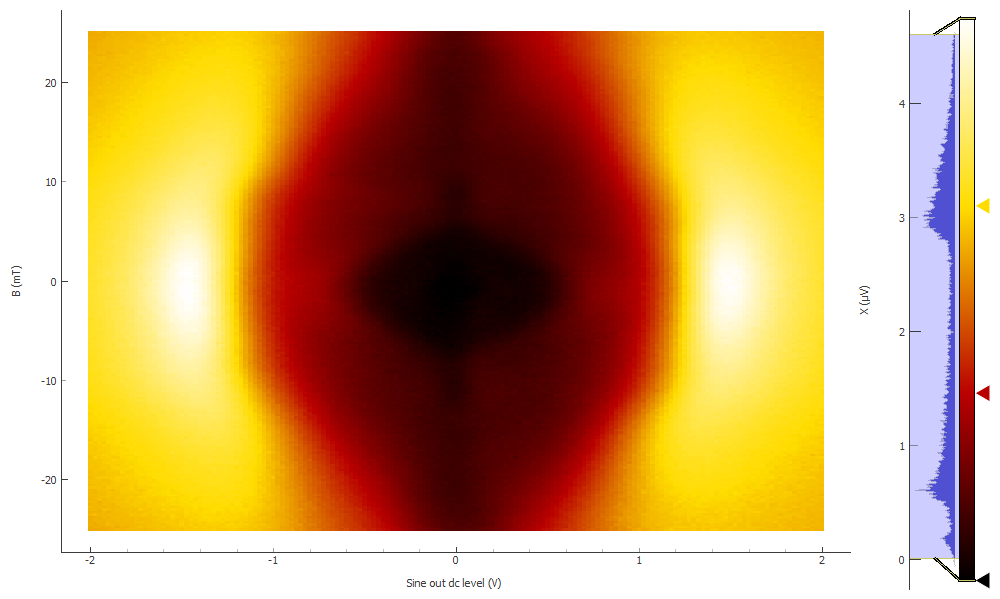

In [705]:
plot102[0]

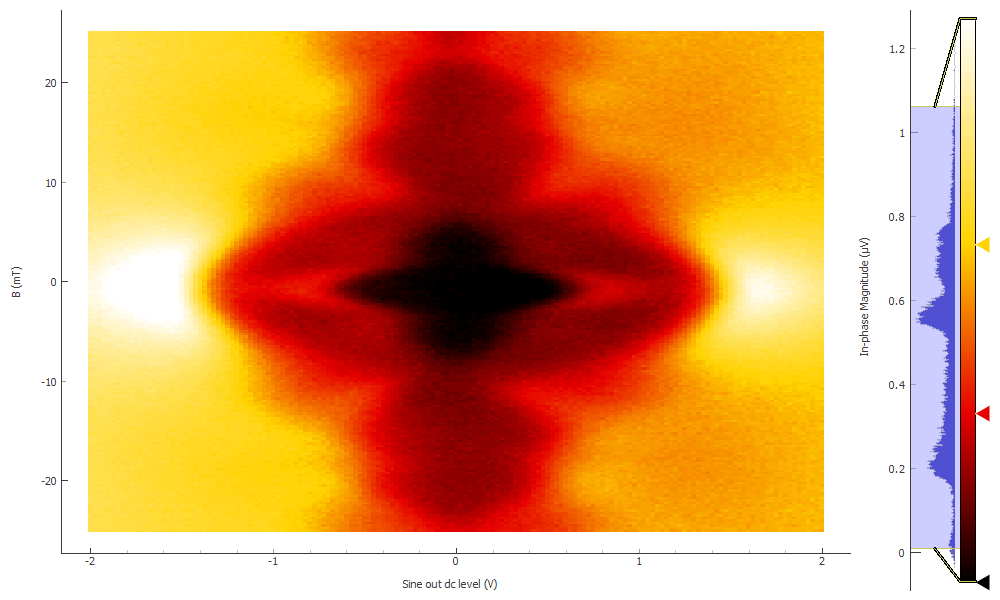

In [706]:
plot102[2]

In [699]:
lockin865.sine_outdc(0)

In [700]:
triton.field(-0.025)

Sweep time approximately 40.006 seconds


In [701]:
constant_n_SC2_40_41_Dsw(-4.9)

In [702]:
lockin865.sine_outdc(-2)
time.sleep(30)
bvals = np.linspace(-0.025, 0.025, 201)
offvals = np.linspace(-2, 2, 161)
data103, plot103 = npd.twod_param_sweep(triton.field_set_stable, bvals, lockin865.sine_outdc, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_SC2_40_41_Dsw_-4p9_FraunhoferbaseT')

Started at 2020-05-13 05:38:27
Please wait 10.03 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.144 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.156 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.108 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.222 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.12 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.156 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.108 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.138 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.144 seconds for the field sweep, plus the time required for opera

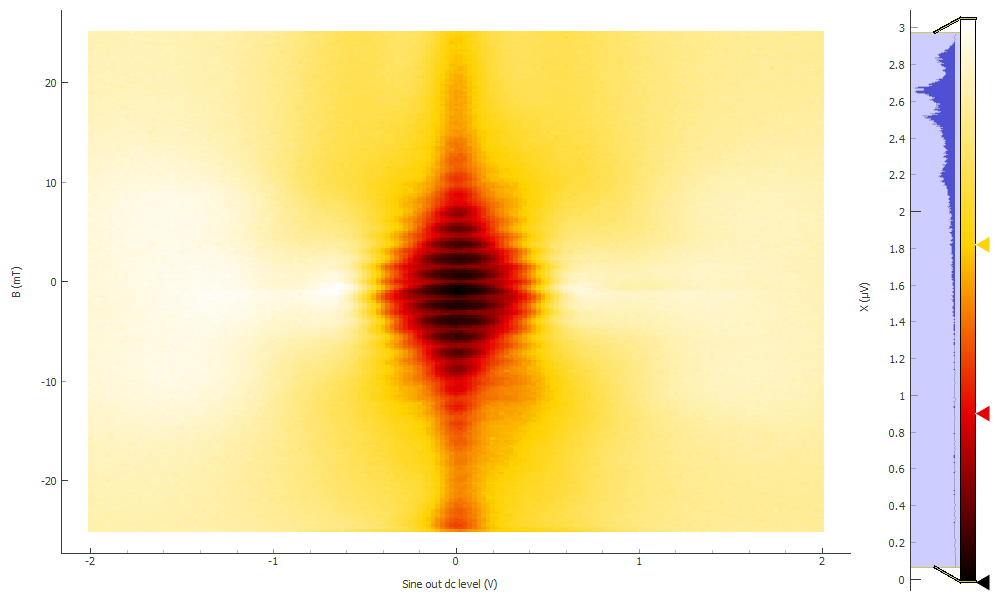

In [707]:
plot103[0]

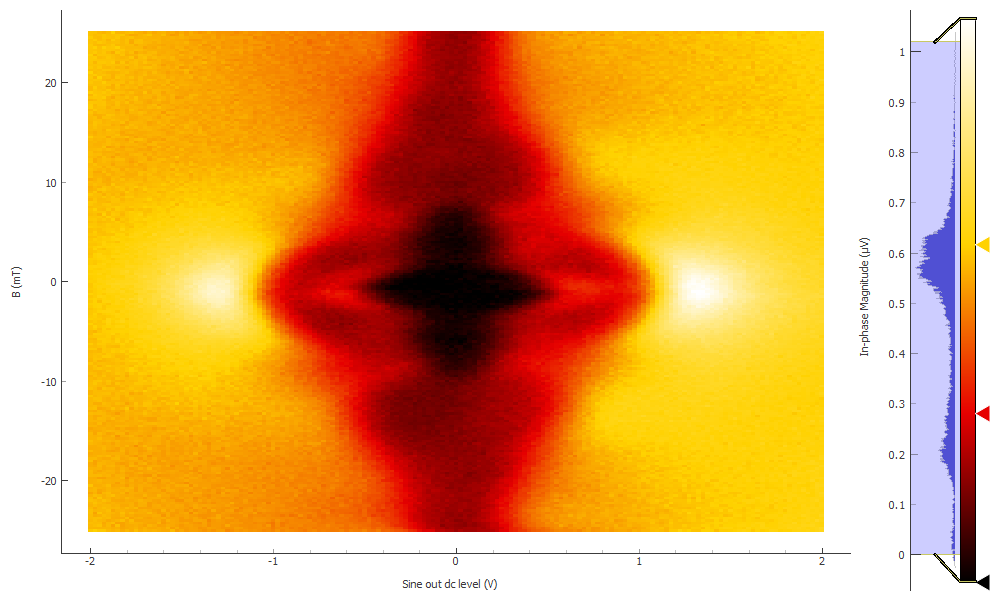

In [708]:
plot103[2]

In [704]:
lockin865.sine_outdc(0)

# 28-29 electron side SC

In [709]:
triton.field(-0.0008)

Sweep time approximately 25.474 seconds


In [711]:
constant_D_orangeline_nsw(-13)

In [712]:
#orangeline
constant_D_orangeline_nsw(-13)
time.sleep(60)
bgnvals = np.linspace(-13, -6.8, 311)
data104, plot104 = npd.single_param_sweep(constant_D_orangeline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_0.5nA_-0p8mT_orangeline_sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-13 18:22:02
DataSet:
   location = 'data/2020-05-13/#002_M30_865_40-41__830_28-29_0.5nA_-0p8mT_orangeline_sweep_18-22-01'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (311,)
   Measured | lockin865_X                   | X                         | (311,)
   Measured | lockin865_Y                   | Y                         | (311,)
   Measured | lockin830_X                   | X                         | (311,)
   Measured | lockin830_Y                   | Y                         | (311,)
Finished at 2020-05-13 18:29:17


<IPython.core.display.Javascript object>


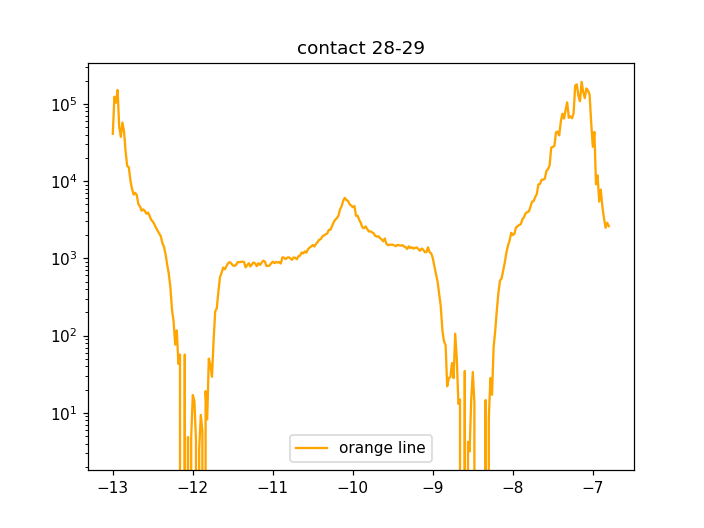

In [741]:
plt.figure()
plt.semilogy(data104.constant_D_orangeline_nsw_set[:], npd.Rxxfromdata(data104, 0.5e-9, 'lockin865'), label='orange line', color='orange')
plt.title('contact 28-29')
plt.legend()

In [714]:
constant_D_orangeline_nsw(-9)

In [715]:
lockin865.sine_outdc(-2)

In [716]:
offvals = np.linspace(-2, 2, 161)
gvals = np.linspace(-9, -8, 41)
data105, plot105 = npd.twod_param_sweep(constant_D_orangeline_nsw, gvals, lockin865.sine_outdc, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=6, SetDelay2=1.1, DataName='M30_865_29-28__830_40-41_0p5nAexc_constantDcut_orangeline_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)
srframe.volt_p1(0)
lockin865.sine_outdc(0)

Started at 2020-05-13 18:35:27
DataSet:
   location = 'data/2020-05-13/#003_M30_865_29-28__830_40-41_0p5nAexc_constantDcut_orangeline_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_18-35-24'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (41,)
   Setpoint | lockin865_sine_outdc_set      | sine_outdc                | (41, 161)
   Measured | lockin865_X                   | X                         | (41, 161)
   Measured | lockin865_Y                   | Y                         | (41, 161)
   Measured | lockin830_X                   | X                         | (41, 161)
   Measured | lockin830_Y                   | Y                         | (41, 161)
Finished at 2020-05-13 20:49:26


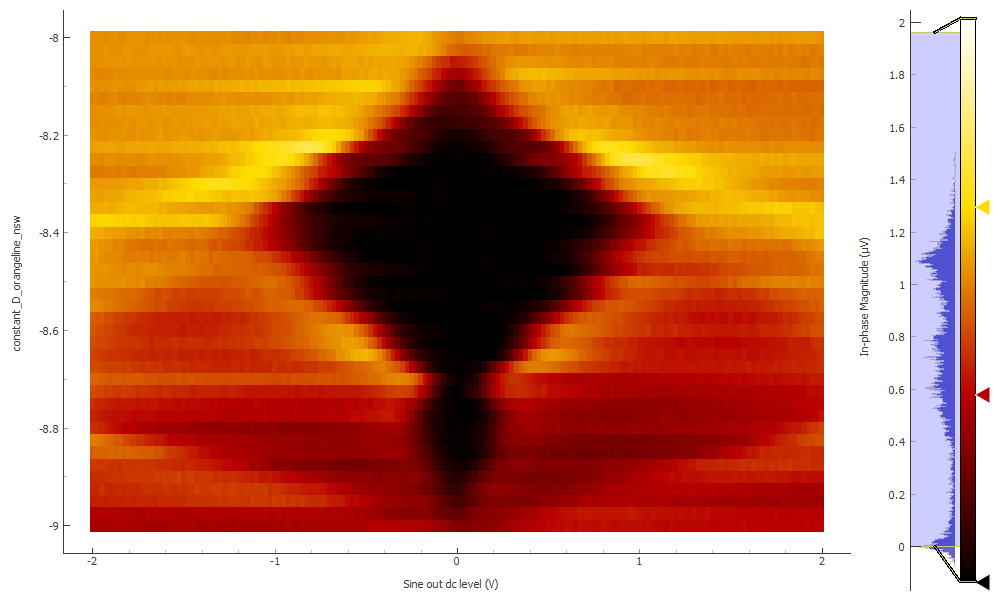

In [724]:
plot105[0]

In [717]:
def constant_n_electronSC_28_29_Dsw(Vb):
    slDrc = -0.2058088083627785
    x5 = -8.375
    b_maxSC_electron_28_29 = x5*(-slDrc) + 2.9 - x5*slDrc
    srframe.volt_p1(Vb)
    srframe.volt_p5(Vb*slDrc + b_maxSC_electron_28_29)
    
constant_n_electronSC_28_29_Dsw = qc.Parameter('constant_n_electronSC_28_29_Dsw', set_cmd=constant_n_electronSC_28_29_Dsw)

In [722]:
constant_n_electronSC_28_29_Dsw(-9.5)

In [725]:
lockin865.sine_outdc(-2)

In [726]:
time.sleep(60)
offvals = np.linspace(-2, 2, 161)
gvals = np.linspace(-9.5, 6, 63)
data106, plot106 = npd.twod_param_sweep(constant_n_electronSC_28_29_Dsw, gvals, lockin865.sine_outdc, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=6, SetDelay2=1.1, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)
srframe.volt_p1(0)
lockin865.sine_outdc(0)

Started at 2020-05-13 21:20:54
DataSet:
   location = 'data/2020-05-13/#004_M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw_AC0.5nAdvdi_baseT_b=-0.8mT_21-20-51'
   <Type>   | <array_id>                          | <array.name>                    | <array.shape>
   Setpoint | constant_n_electronSC_28_29_Dsw_set | constant_n_electronSC_28_29_Dsw | (63,)
   Setpoint | lockin865_sine_outdc_set            | sine_outdc                      | (63, 161)
   Measured | lockin865_X                         | X                               | (63, 161)
   Measured | lockin865_Y                         | Y                               | (63, 161)
   Measured | lockin830_X                         | X                               | (63, 161)
   Measured | lockin830_Y                         | Y                               | (63, 161)
Finished at 2020-05-14 00:46:56


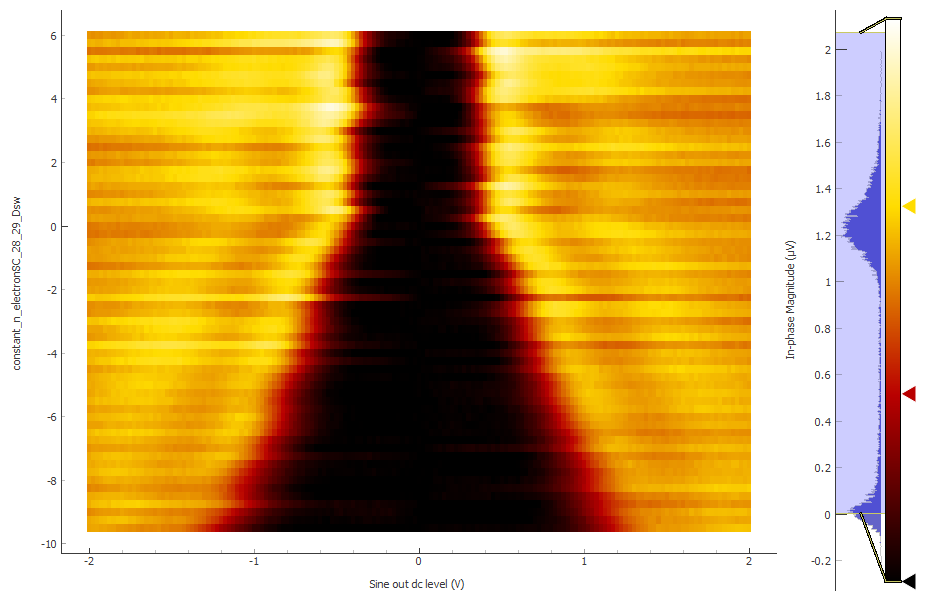

In [730]:
plot106[0]

In [727]:
constant_n_electronSC_28_29_Dsw(-9.5)

In [731]:
lockin865.sine_outdc(-2)

In [733]:
triton.field()

-0.025098

In [734]:
lockin865.sine_outdc(-2)
time.sleep(30)
bvals = np.linspace(-0.025, 0.025, 201)
offvals = np.linspace(-2, 2, 161)
data107, plot107 = npd.twod_param_sweep(triton.field_set_stable, bvals, lockin865.sine_outdc, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw_-9p5_FraunhoferbaseT')

Started at 2020-05-14 00:50:31
Please wait 10.024 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.174 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.126 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.192 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.156 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.108 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.126 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.108 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.12 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.12 seconds for the field sweep, plus the time required for opera

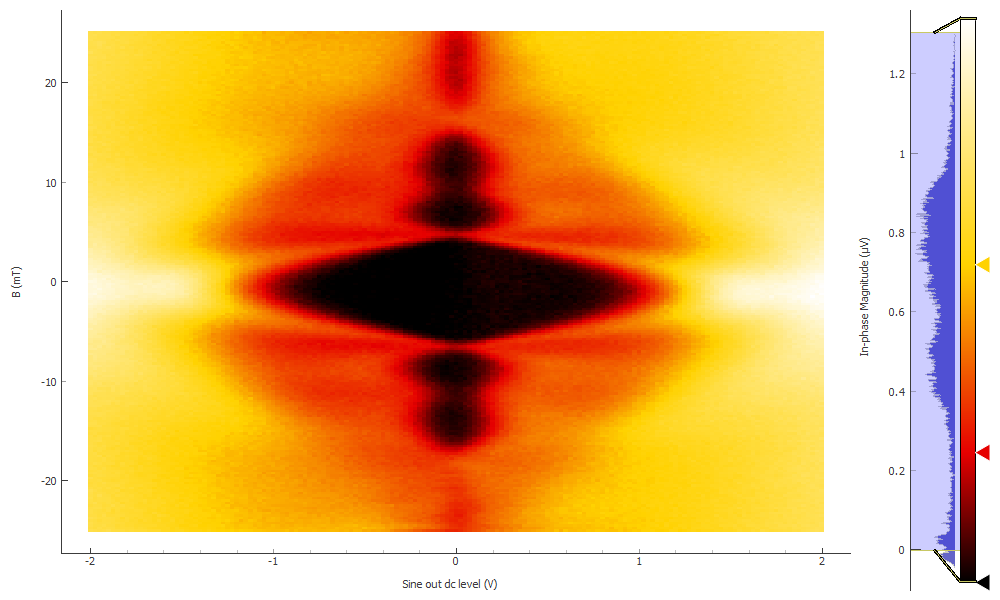

In [736]:
plot107[2]

In [737]:
triton.field(-0.0008)

Sweep time approximately 25.48 seconds


In [738]:
srframe.volt_p5(0)
srframe.volt_p1(0)
lockin865.sine_outdc(0)

In [739]:
zeroDparam(-7.5)

In [742]:
#D = 0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 451)
data108, plot108 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_0.5nA_-0p8mT_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-14 13:47:02
DataSet:
   location = 'data/2020-05-14/#002_M30_865_40-41__830_28-29_0.5nA_-0p8mT_D0sweep_13-47-01'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (451,)
   Measured | lockin865_X    | X            | (451,)
   Measured | lockin865_Y    | Y            | (451,)
   Measured | lockin830_X    | X            | (451,)
   Measured | lockin830_Y    | Y            | (451,)
Finished at 2020-05-14 13:57:33


<IPython.core.display.Javascript object>


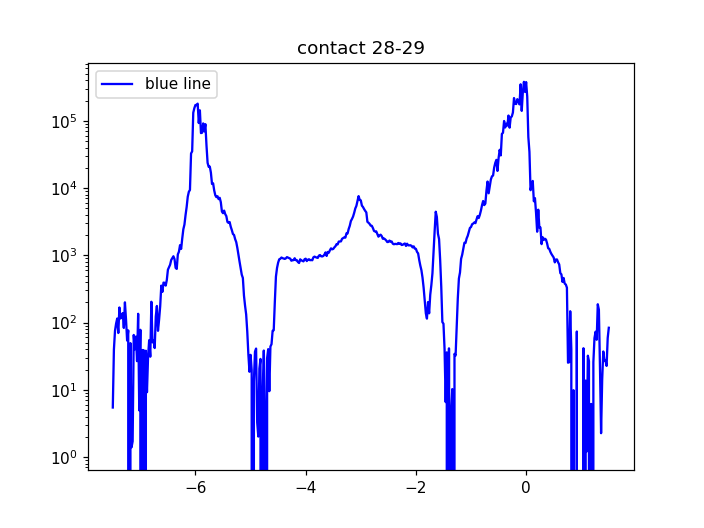

In [744]:
plt.figure()
plt.semilogy(data108.zeroDparam_set[:], npd.Rxxfromdata(data108, 0.5e-9, 'lockin865'), label='blue line', color='blue')
plt.title('contact 28-29')
plt.legend()

In [746]:
zeroDparam(-2)

In [747]:
lockin865.sine_outdc(-2)

In [749]:
#accidentally delet one line

In [750]:
constant_D_redline_nsw(0)

In [751]:
#redline
constant_D_redline_nsw(0)
time.sleep(60)
bgnvals = np.linspace(0, 6, 301)
data110, plot110 = npd.single_param_sweep(constant_D_redline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_0.5nA_-0p8mT_redline_sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-14 16:19:57
DataSet:
   location = 'data/2020-05-14/#004_M30_865_40-41__830_28-29_0.5nA_-0p8mT_redline_sweep_16-19-56'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (301,)
   Measured | lockin865_X                | X                      | (301,)
   Measured | lockin865_Y                | Y                      | (301,)
   Measured | lockin830_X                | X                      | (301,)
   Measured | lockin830_Y                | Y                      | (301,)
Finished at 2020-05-14 16:26:58


<IPython.core.display.Javascript object>


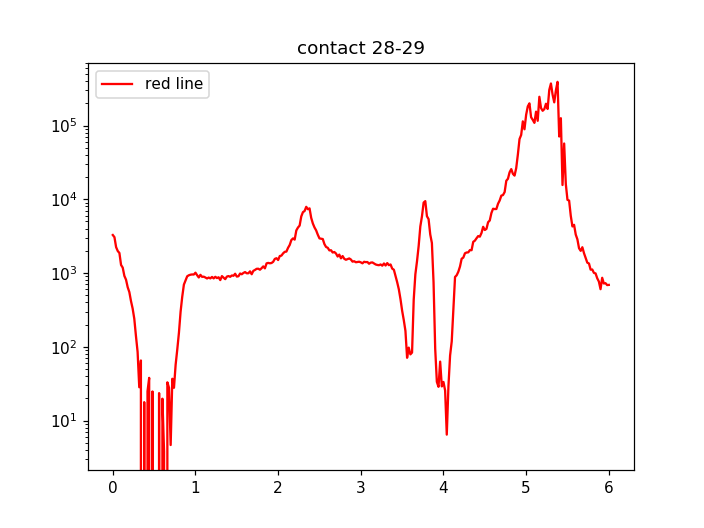

In [752]:
plt.figure()
plt.semilogy(data110.constant_D_redline_nsw_set[:], npd.Rxxfromdata(data110, 0.5e-9, 'lockin865'), label='red line', color='red')
plt.title('contact 28-29')
plt.legend()

In [753]:
constant_D_redline_nsw(3.3)

In [754]:
lockin865.sine_outdc(-2)

In [755]:
offvals = np.linspace(-2, 2, 161)
gvals = np.linspace(3.3, 4.3, 41)
data111, plot111 = npd.twod_param_sweep(constant_D_redline_nsw, gvals, lockin865.sine_outdc, offvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=6, SetDelay2=1.1, DataName='M30_865_29-28__830_40-41_0p5nAexc_constantDcut_redline_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT')
srframe.volt_p5(0)
srframe.volt_p1(0)
lockin865.sine_outdc(0)

Started at 2020-05-14 16:32:04
DataSet:
   location = 'data/2020-05-14/#005_M30_865_29-28__830_40-41_0p5nAexc_constantDcut_redline_Vbg_sweep_AC0.5nAdvdi_baseT_b=-0.8mT_16-32-01'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (41,)
   Setpoint | lockin865_sine_outdc_set   | sine_outdc             | (41, 161)
   Measured | lockin865_X                | X                      | (41, 161)
   Measured | lockin865_Y                | Y                      | (41, 161)
   Measured | lockin830_X                | X                      | (41, 161)
   Measured | lockin830_Y                | Y                      | (41, 161)
Finished at 2020-05-14 18:46:14


In [756]:
constant_n_electronSC_28_29_Dsw(-9.5)

In [757]:
#constant_n_electronSC_28_29_Dsw(-9.5)
lockin865.sine_outdc(-2)
time.sleep(30)
Ivals = np.linspace(-2, 2, 161) 
data112, plot112 = npd.single_param_sweep(lockin865.sine_outdc, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw-9p5')
lockin865.sine_outdc(0)

Started at 2020-05-14 18:48:31
DataSet:
   location = 'data/2020-05-14/#006_M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw-9p5_18-48-29'
   <Type>   | <array_id>               | <array.name> | <array.shape>
   Setpoint | lockin865_sine_outdc_set | sine_outdc   | (161,)
   Measured | lockin865_X              | X            | (161,)
   Measured | lockin865_Y              | Y            | (161,)
   Measured | lockin830_X              | X            | (161,)
   Measured | lockin830_Y              | Y            | (161,)
Finished at 2020-05-14 18:51:49


In [758]:
constant_n_electronSC_28_29_Dsw(-1.33)

In [759]:
#constant_n_electronSC_28_29_Dsw(-1.33)
lockin865.sine_outdc(-2)
time.sleep(30)
Ivals = np.linspace(-2, 2, 161) 
data113, plot113 = npd.single_param_sweep(lockin865.sine_outdc, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw-1p33')
lockin865.sine_outdc(0)

Started at 2020-05-14 18:53:13
DataSet:
   location = 'data/2020-05-14/#007_M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw-1p33_18-53-12'
   <Type>   | <array_id>               | <array.name> | <array.shape>
   Setpoint | lockin865_sine_outdc_set | sine_outdc   | (161,)
   Measured | lockin865_X              | X            | (161,)
   Measured | lockin865_Y              | Y            | (161,)
   Measured | lockin830_X              | X            | (161,)
   Measured | lockin830_Y              | Y            | (161,)
Finished at 2020-05-14 18:56:32


In [760]:
constant_n_electronSC_28_29_Dsw(6)

In [761]:
#constant_n_electronSC_28_29_Dsw(-1.33)
lockin865.sine_outdc(-2)
time.sleep(30)
Ivals = np.linspace(-2, 2, 161) 
data114, plot114 = npd.single_param_sweep(lockin865.sine_outdc, Ivals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw6')
lockin865.sine_outdc(0)

Started at 2020-05-14 18:58:33
DataSet:
   location = 'data/2020-05-14/#008_M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw6_18-58-31'
   <Type>   | <array_id>               | <array.name> | <array.shape>
   Setpoint | lockin865_sine_outdc_set | sine_outdc   | (161,)
   Measured | lockin865_X              | X            | (161,)
   Measured | lockin865_Y              | Y            | (161,)
   Measured | lockin830_X              | X            | (161,)
   Measured | lockin830_Y              | Y            | (161,)
Finished at 2020-05-14 19:01:52


In [762]:
constant_n_electronSC_28_29_Dsw(-1.33)

In [763]:
lockin865.sine_outdc(-2)

In [764]:
triton.field(-0.025)

Sweep time approximately 24.496000000000002 seconds


In [765]:
lockin865.sine_outdc(-2)
time.sleep(30)
bvals = np.linspace(-0.025, 0.025, 201)
offvals = np.linspace(-2, 2, 161)
data115, plot115 = npd.twod_param_sweep(triton.field_set_stable, bvals, lockin865.sine_outdc, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw_-1p33_FraunhoferbaseT')

Started at 2020-05-14 19:04:05
Please wait 10.024 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.15 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.102 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.132 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.126 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.168 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.102 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.114 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.12 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.132 seconds for the field sweep, plus the time required for opera

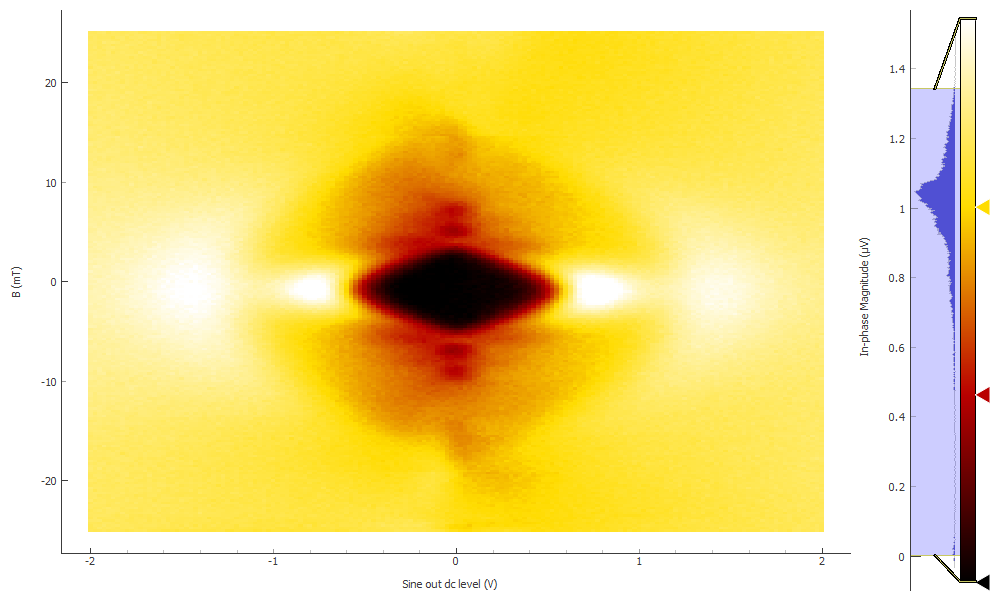

In [774]:
plot115[2]

In [766]:
constant_n_electronSC_28_29_Dsw(6)

In [767]:
lockin865.sine_outdc(-2)

In [768]:
triton.field(-0.025)

Sweep time approximately 40.0 seconds


In [769]:
time.sleep(60)

In [770]:
lockin865.sine_outdc(-2)
time.sleep(30)
bvals = np.linspace(-0.025, 0.025, 201)
offvals = np.linspace(-2, 2, 161)
data116, plot116 = npd.twod_param_sweep(triton.field_set_stable, bvals, lockin865.sine_outdc, offvals, lockin830.X, lockin830.Y, lockin865.X, lockin865.Y, SetDelay1=12, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nAexc_constant_n_electronSC_28_29_Dsw_6_FraunhoferbaseT')

Started at 2020-05-15 07:43:04
Please wait 10.012 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.12 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.15 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.162 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.186 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.174 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.114 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.15 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.114 seconds for the field sweep, plus the time required for operating the switch...
Please wait 10.132 seconds for the field sweep, plus the time required for operat

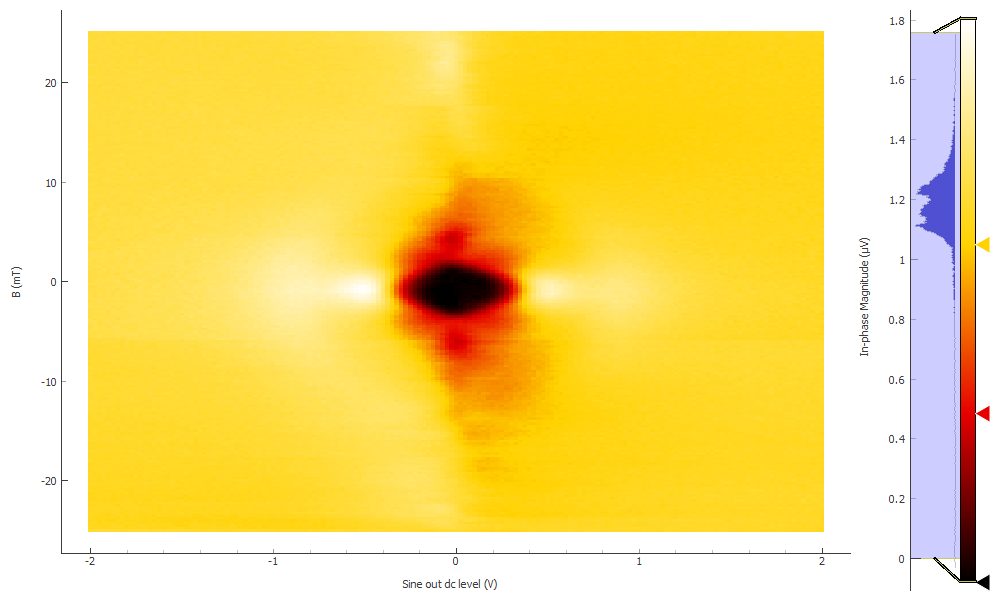

In [775]:
plot116[2]

In [772]:
triton.field(-0.0008)

Sweep time approximately 25.48 seconds


In [773]:
lockin865.sine_outdc(0)

get a resistance line cut along the electron side half filling

In [797]:
constant_D_redline_nsw(3.783)#this gate point seems to be maximized at red line

In [799]:
def constant_n_correlated_electron_28_29_Dsw(Vb):
    slDrc = -0.2058088083627785
    x8 = 3.783
    b_correlated_electron_28_29 = x8*(-slDrc) - 2.2 - x8*slDrc
    srframe.volt_p1(Vb)
    srframe.volt_p5(Vb*slDrc + b_correlated_electron_28_29)
    
constant_n_correlated_electron_28_29_Dsw = qc.Parameter('constant_n_correlated_electron_28_29_Dsw', set_cmd=constant_n_correlated_electron_28_29_Dsw)

In [803]:
constant_n_correlated_electron_28_29_Dsw(6)

In [804]:
#the electron half filling D sweep 
constant_n_correlated_electron_28_29_Dsw(6)
time.sleep(60)
bgnvals = np.linspace(6, -10, 641)
data117, plot117 = npd.single_param_sweep(constant_n_correlated_electron_28_29_Dsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_0.5nA_-0p8mT_constant_n_correlated_electron_28_29_Dsw', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-15 20:46:44
DataSet:
   location = 'data/2020-05-15/#002_M30_865_40-41__830_28-29_0.5nA_-0p8mT_constant_n_correlated_electron_28_29_Dsw_20-46-43'
   <Type>   | <array_id>                                   | <array.name>                             | <array.shape>
   Setpoint | constant_n_correlated_electron_28_29_Dsw_set | constant_n_correlated_electron_28_29_Dsw | (641,)
   Measured | lockin865_X                                  | X                                        | (641,)
   Measured | lockin865_Y                                  | Y                                        | (641,)
   Measured | lockin830_X                                  | X                                        | (641,)
   Measured | lockin830_Y                                  | Y                                        | (641,)
Finished at 2020-05-15 21:01:42


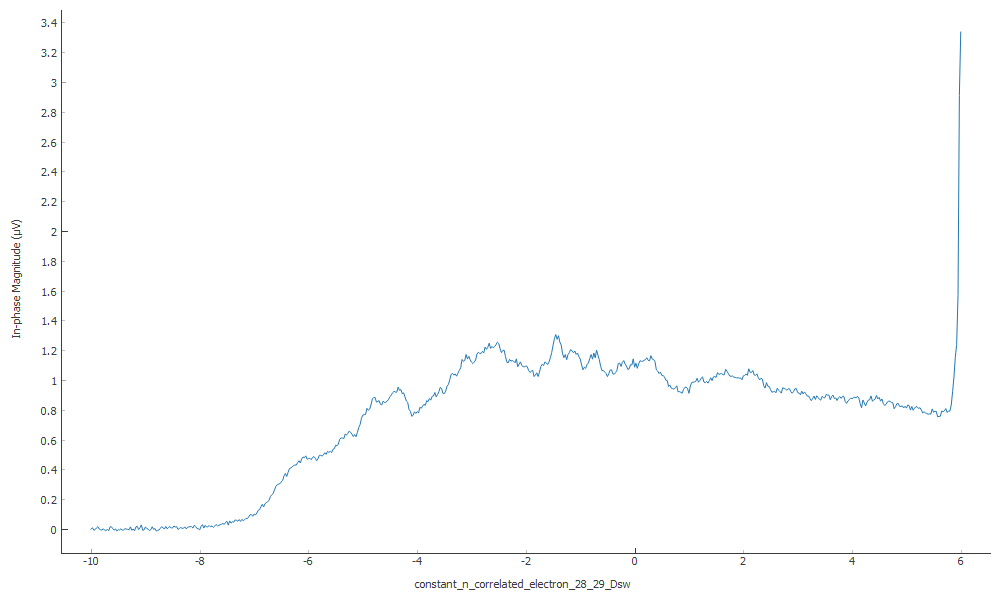

In [805]:
plot117[0]

In [806]:
# when sweep the half filling peak is not maxmized, can come back later

# D = 0 Rxy fan diagram

In [807]:
zeroDparam(-7.5)

In [808]:
#D = 0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 451)
data118, plot118 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_0.5nA_-0p8mT_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-15 21:05:22
DataSet:
   location = 'data/2020-05-15/#003_M30_865_40-41__830_28-29_0.5nA_-0p8mT_D0sweep_21-05-21'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (451,)
   Measured | lockin865_X    | X            | (451,)
   Measured | lockin865_Y    | Y            | (451,)
   Measured | lockin830_X    | X            | (451,)
   Measured | lockin830_Y    | Y            | (451,)
Finished at 2020-05-15 21:15:54


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


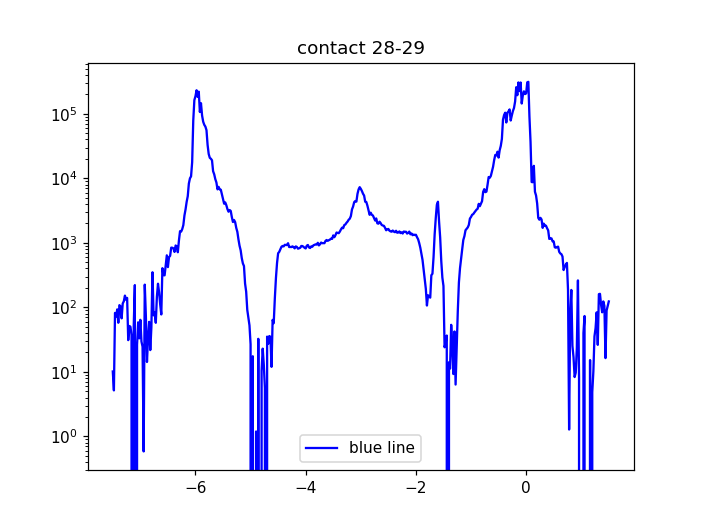

In [809]:
plt.figure()
plt.semilogy(data118.zeroDparam_set[:], npd.Rxxfromdata(data118, 0.5e-9, 'lockin865'), label='blue line', color='blue')
plt.title('contact 28-29')
plt.legend()

<IPython.core.display.Javascript object>


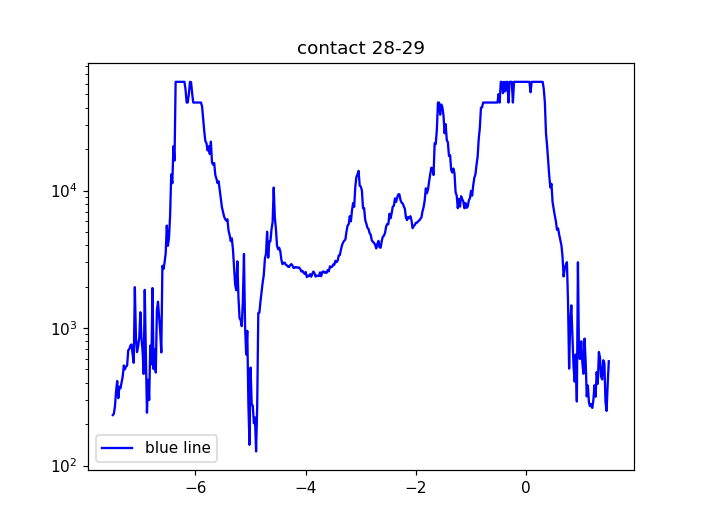

In [810]:
plt.figure()
plt.semilogy(data118.zeroDparam_set[:], npd.Rxxfromdata(data118, 0.5e-9, 'lockin830'), label='blue line', color='blue')
plt.title('contact 28-29')
plt.legend()

In [811]:
# now change the electrodes

source drain not changing, lockin865 V+29 V-42 lockin 830 V+32 V-40

In [813]:
lockin865.amplitude(0.1)

In [814]:
zeroDparam(-7.5)

In [815]:
#D = 0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 451)
data119, plot119 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-42__830_32-40_1nA_-0p8mT_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-15 21:26:56
DataSet:
   location = 'data/2020-05-15/#004_M30_865_28-42__830_32-40_1nA_-0p8mT_D0sweep_21-26-55'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (451,)
   Measured | lockin865_X    | X            | (451,)
   Measured | lockin865_Y    | Y            | (451,)
   Measured | lockin830_X    | X            | (451,)
   Measured | lockin830_Y    | Y            | (451,)
Finished at 2020-05-15 21:37:28


C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


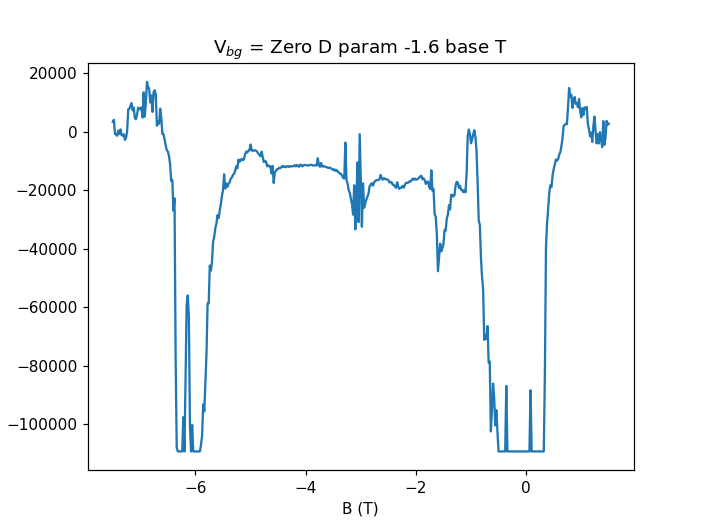

Text(0, 0.5, 'R ($\\Omega$)')

In [816]:
plt.figure()
plt.plot(data119.zeroDparam_set, data119.lockin830_X[:]/1e-9, label='')
plt.title('V$_{bg}$ = Zero D param -1.6 base T')
plt.xlabel('B (T)')
plt.ylabel('R ($\Omega$)')

In [819]:
zeroDparam(-7.5)

In [820]:
triton.field(0)

Sweep time approximately 10.492 seconds


In [821]:
bgnvals = np.linspace(-7.5, 1.5, 451)
bvals = np.linspace(0, 8, 161)
data120, plot120 = npd.twod_param_sweep(triton.field_set_stable, bvals, zeroDparam, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=15, SetDelay2=1.2, Param2_SetBetween=0, DataName='M30_865_28-42__830_32-40_1nA_baseT_B-n_D0_sweep')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-15 21:41:21
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the

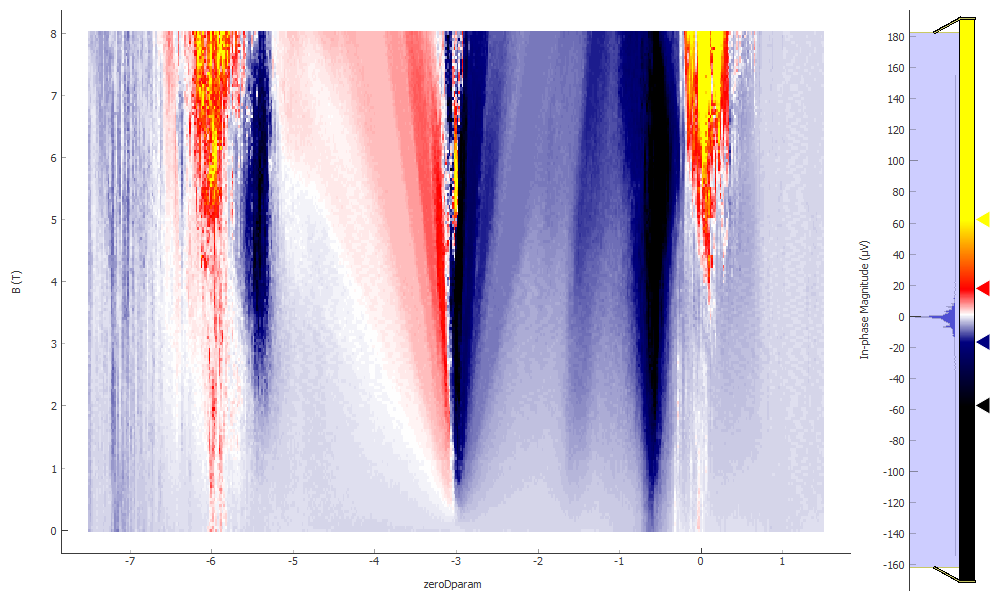

In [822]:
plot120[0]

# 28-29 40-41 topgate backgate 2D scan with magnetic field

switch back to Rxx measurement 

In [824]:
lockin865.amplitude(0.1)

In [825]:
zeroDparam(-7.5)

In [826]:
#D = 0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 451)
data121, plot121 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29_830_40-41_1nA_8T_D0sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-17 10:50:23
DataSet:
   location = 'data/2020-05-17/#001_M30_865_28-29_830_40-41_1nA_8T_D0sweep_10-50-22'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (451,)
   Measured | lockin865_X    | X            | (451,)
   Measured | lockin865_Y    | Y            | (451,)
   Measured | lockin830_X    | X            | (451,)
   Measured | lockin830_Y    | Y            | (451,)
Finished at 2020-05-17 11:01:08


In [827]:
bgvals = np.linspace(-11, 6, 171)
tgvals = np.linspace(-1.7, 1.5, 97)
srframe.volt_p1(-11)
srframe.volt_p5(-1.7)
time.sleep(60)
data122, plot122 = npd.twod_param_sweep(srframe.volt_p5, tgvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=25, SetDelay2=1.1, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_1nA_2dgatesweep_8T_rough')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-17 11:10:59
DataSet:
   location = 'data/2020-05-17/#002_M30_865_29-28__830_40-41_1nA_2dgatesweep_8T_rough_11-10-56'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (97,)
   Setpoint | srframe_volt_p1_set | volt_p1      | (97, 171)
   Measured | lockin865_X         | X            | (97, 171)
   Measured | lockin865_Y         | Y            | (97, 171)
   Measured | lockin830_X         | X            | (97, 171)
   Measured | lockin830_Y         | Y            | (97, 171)
Finished at 2020-05-17 16:23:44
Keyboard Interrupt


In [829]:
lockin865.sensitivity(1e-5)

In [830]:
lockin830.sensitivity()

0.0001

In [831]:
bgvals = np.linspace(-11, 6, 273)
tgvals = np.linspace(-1.7, 1.5, 193)
srframe.volt_p1(-11)
srframe.volt_p5(-1.7)
time.sleep(60)
data123, plot123 = npd.twod_param_sweep(srframe.volt_p5, tgvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=25, SetDelay2=1.1, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_1nA_2dgatesweep_8T')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-17 16:27:32
DataSet:
   location = 'data/2020-05-17/#003_M30_865_29-28__830_40-41_1nA_2dgatesweep_8T_16-27-29'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (193,)
   Setpoint | srframe_volt_p1_set | volt_p1      | (193, 273)
   Measured | lockin865_X         | X            | (193, 273)
   Measured | lockin865_Y         | Y            | (193, 273)
   Measured | lockin830_X         | X            | (193, 273)
   Measured | lockin830_Y         | Y            | (193, 273)
Finished at 2020-05-18 13:12:44


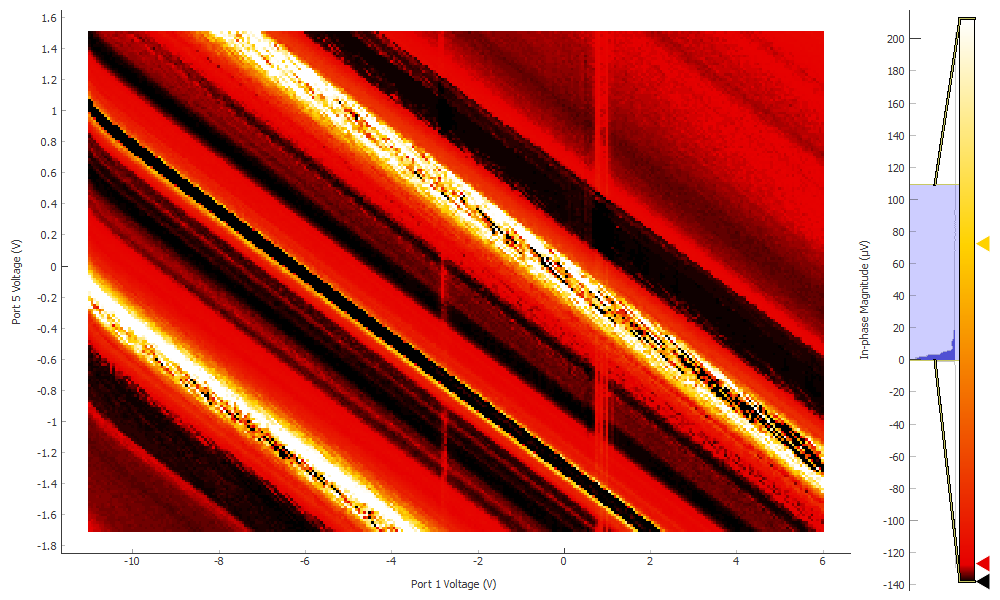

In [869]:
plot123[0]

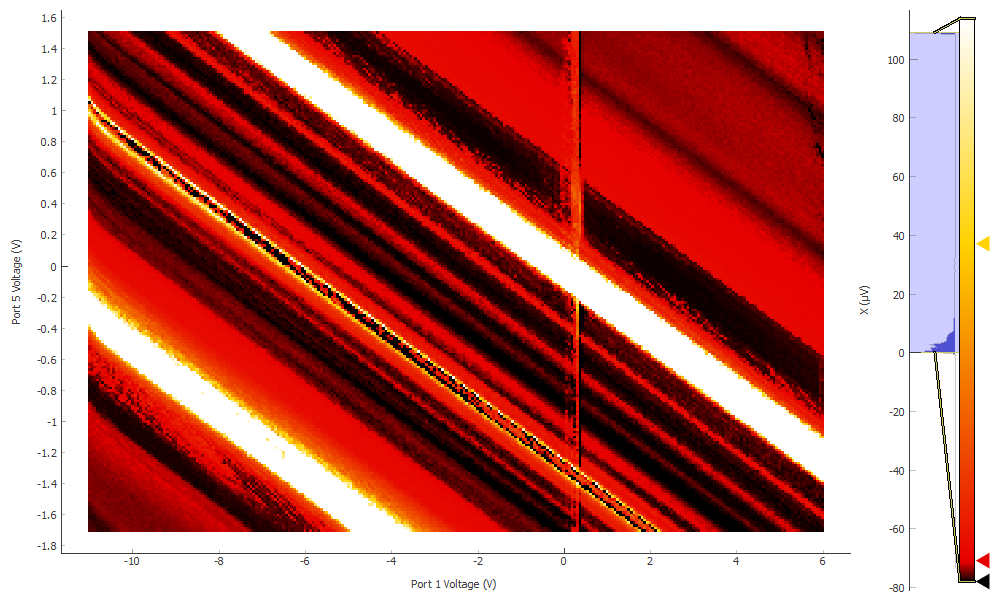

In [870]:
plot123[2]

In [836]:
triton.magnet_sweeprate()

0.1

In [864]:
triton.field()

5.0

In [865]:
bgvals = np.linspace(-11, 6, 273)
tgvals = np.linspace(-1.7, 1.5, 193)
srframe.volt_p1(-11)
srframe.volt_p5(-1.7)
time.sleep(60)
data124, plot124 = npd.twod_param_sweep(srframe.volt_p5, tgvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=25, SetDelay2=1.1, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_1nA_2dgatesweep_5T')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-18 14:07:31
DataSet:
   location = 'data/2020-05-18/#001_M30_865_29-28__830_40-41_1nA_2dgatesweep_5T_14-07-28'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p5_set | volt_p5      | (193,)
   Setpoint | srframe_volt_p1_set | volt_p1      | (193, 273)
   Measured | lockin865_X         | X            | (193, 273)
   Measured | lockin865_Y         | Y            | (193, 273)
   Measured | lockin830_X         | X            | (193, 273)
   Measured | lockin830_Y         | Y            | (193, 273)
Finished at 2020-05-19 10:31:36
Keyboard Interrupt


In [867]:
triton.field(0)

Sweep time approximately 3010.012 seconds


# fan diagram along several constant D cuts

In [873]:
constant_D_orangeline_nsw(-14)

In [874]:
#orangeline
constant_D_orangeline_nsw(-14)
time.sleep(60)
bgnvals = np.linspace(-14, -6.8, 361)
data125, plot125 = npd.single_param_sweep(constant_D_orangeline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_40-41__830_28-29_1nA_0T_orangeline_sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-19 13:06:40
DataSet:
   location = 'data/2020-05-19/#001_M30_865_40-41__830_28-29_1nA_0T_orangeline_sweep_13-06-39'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (361,)
   Measured | lockin865_X                   | X                         | (361,)
   Measured | lockin865_Y                   | Y                         | (361,)
   Measured | lockin830_X                   | X                         | (361,)
   Measured | lockin830_Y                   | Y                         | (361,)
Finished at 2020-05-19 13:15:06


In [914]:
triton.field()

-0.000473

In [915]:
constant_D_orangeline_nsw(-13.6)

In [916]:
time.sleep(60)

In [917]:
bgnvals = np.linspace(-13.6, -6.8, 341)
bvals = np.linspace(0, 8, 161)
data126, plot126 = npd.twod_param_sweep(triton.field_set_stable, bvals, constant_D_orangeline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=20, SetDelay2=1.2, Param2_SetBetween=-13.6, DataName='M30_865_29-28_830_40-41_1nA_baseT_B-n_orangeline_sweep')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-19 19:01:52
Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating t

In [927]:
#magnet quenched

In [31]:
triton.magnet_POC()

0

In [32]:
triton.magnet_swh()

0

In [925]:
triton.magnet_sweeprate()

0.1

In [943]:
triton.field()

7.400055

In [944]:
constant_D_orangeline_nsw(-13.6)

In [945]:
time.sleep(60)

In [946]:
bgnvals = np.linspace(-13.6, -6.8, 341)
bvals = np.linspace(7.4, 8, 13)
data127, plot127 = npd.twod_param_sweep(triton.field_set_stable, bvals, constant_D_orangeline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=20, SetDelay2=1.2, Param2_SetBetween=-13.6, DataName='M30_865_29-28_830_40-41_1nA_baseT_B-n_orangeline_sweep')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-20 20:22:17
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 4570.0 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-05-20/#001_M30_865_29-28_830_40-41_1nA_baseT_B-n_orangeline_sweep_20-22-14'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | triton_field_set_stable_set   | field_set_stable          | (13,)
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (13, 341)
   Measured | lockin865_X                   | X                         | (13, 341)
   Measured | lockin865_Y         

In [948]:
#clamped again go to persistent mode

In [1012]:
triton.field()

0.0

In [1007]:
constant_D_orangeline_nsw(-13.6)

In [1008]:
time.sleep(60)

In [1009]:
bgnvals = np.linspace(-13.6, -6.8, 341)
bvals = np.linspace(7.4, 8, 13)
data128, plot128 = npd.twod_param_sweep(triton.field_set_stable, bvals, constant_D_orangeline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=20, SetDelay2=1.2, Param2_SetBetween=-13.6, DataName='M30_865_29-28_830_40-41_1nA_baseT_B-n_orangeline_sweep')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-20 23:17:11
Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-05-20/#002_M30_865_29-28_830_40-41_1nA_baseT_B-n_orangeline_sweep_23-17-08'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | triton_field_set_stable_set   | field_set_stable          | (13,)
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (13, 341)
   Measured | lockin865_X                   | X                         | (13, 341)
   Measured | lockin865_Y                   | Y                         | (13, 341)
   Measured | lockin830_X                   | X                         | (13, 341)
   Measured | lockin830_Y                   | Y                         | (13, 341)
Finished at 2020-05-20 23:28:19
Keyboard Interrupt


In [ ]:
#magnet rest for one night

In [1014]:
triton.field(0)

Sweep time approximately 10.0 seconds


In [1015]:
triton.magnet_sweeprate()

0.15

In [1016]:
#get the other D field line cut first, start from zero field, persistent mode

In [1023]:
constant_D_redline_nsw(6)

In [1024]:
#redline
constant_D_redline_nsw(6)
time.sleep(60)
bgnvals = np.linspace(6, -0.5, 326)
data129, plot129 = npd.single_param_sweep(constant_D_redline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29_830_40-41_1nA_0T_redline_sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-21 10:25:16
DataSet:
   location = 'data/2020-05-21/#001_M30_865_28-29_830_40-41_1nA_0T_redline_sweep_10-25-14'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (326,)
   Measured | lockin865_X                | X                      | (326,)
   Measured | lockin865_Y                | Y                      | (326,)
   Measured | lockin830_X                | X                      | (326,)
   Measured | lockin830_Y                | Y                      | (326,)
Finished at 2020-05-21 10:32:53


<IPython.core.display.Javascript object>


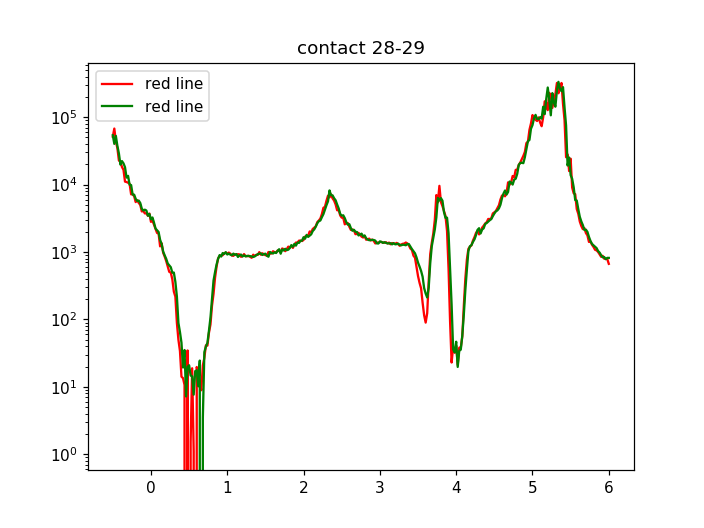

In [1057]:
plt.figure()
plt.semilogy(data129.constant_D_redline_nsw_set[:], npd.Rxxfromdata(data129, 1e-9, 'lockin865'), label='red line', color='red')
plt.semilogy(data132.constant_D_redline_nsw_set[:], npd.Rxxfromdata(data132, 1e-9, 'lockin865'), label='red line', color='green')
plt.title('contact 28-29')
plt.legend()

In [1028]:
constant_D_redline_nsw(6)
time.sleep(60)

In [1029]:
bgnvals = np.linspace(6, -0.5, 326)
bvals = np.linspace(0, 8, 161)
data130, plot130 = npd.twod_param_sweep(triton.field_set_stable, bvals, constant_D_redline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=20, SetDelay2=1.2, Param2_SetBetween=6, DataName='M30_865_29-28_830_40-41_1nA_baseT_B-n_redline_sweep')
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-21 10:37:34
Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.992 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.98 seconds for the field sweep, plus the time required for operating the switch...
DataSet:
   location = 'data/2020-05-21/#002_M30_865_29-28_830_40-41_1nA_baseT_B-n_redline_sweep_10-37-30'
   <Type>   | <array_id>                  | <array.name>           | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable       | (161,)
   Setpoint | constant_D_redline_nsw_set  | constant_D_redline_nsw | (161, 326)
   Measured | lockin865_X                 | X                      | (161, 326)
   Measured | lockin865_Y  

In [1035]:
srframe.volt_p5(0)

In [1036]:
lockin865.amplitude(0.1)

In [1037]:
srdc.output(1)

In [1043]:
srdc.volt(-2.2)

In [1044]:
del constant_D_redline_nsw

In [9]:
def constant_D_redline_nsw(Vb):
    slDrc = -0.2058088083627785
    srframe.volt_p1(Vb)
    srdc.volt(-slDrc*Vb - 2.2)
    
constant_D_redline_nsw = qc.Parameter('constant_D_redline_nsw', set_cmd=constant_D_redline_nsw)

In [1053]:
constant_D_redline_nsw(6)

In [1050]:
#redline
constant_D_redline_nsw(6)
time.sleep(60)
bgnvals = np.linspace(6, -0.5, 326)
data131, plot131 = npd.single_param_sweep(constant_D_redline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29_830_40-41_1nA_0T_redline_sweep', YParam=[lockin865.X, lockin830.X])
srframe.volt_p5(0)
srframe.volt_p1(0)

Started at 2020-05-21 13:28:31
DataSet:
   location = 'data/2020-05-21/#003_M30_865_28-29_830_40-41_1nA_0T_redline_sweep_13-28-30'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (326,)
   Measured | lockin865_X                | X                      | (326,)
   Measured | lockin865_Y                | Y                      | (326,)
   Measured | lockin830_X                | X                      | (326,)
   Measured | lockin830_Y                | Y                      | (326,)
Finished at 2020-05-21 13:35:50


In [1051]:
srdc.volt(0)

In [1054]:
#redline cable plugged
constant_D_redline_nsw(6)
time.sleep(60)
bgnvals = np.linspace(6, -0.5, 326)
data132, plot132 = npd.single_param_sweep(constant_D_redline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29_830_40-41_1nA_0T_redline_sweep', YParam=[lockin865.X, lockin830.X])
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-21 13:40:33
DataSet:
   location = 'data/2020-05-21/#004_M30_865_28-29_830_40-41_1nA_0T_redline_sweep_13-40-32'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (326,)
   Measured | lockin865_X                | X                      | (326,)
   Measured | lockin865_Y                | Y                      | (326,)
   Measured | lockin830_X                | X                      | (326,)
   Measured | lockin830_Y                | Y                      | (326,)
Finished at 2020-05-21 13:47:53


In [12]:
constant_D_redline_nsw(6)
time.sleep(60)

In [13]:
bgnvals = np.linspace(6, -0.5, 651)
bvals = np.linspace(0, 8, 161)
data133, plot133 = npd.twod_param_sweep(triton.field_set_stable, bvals, constant_D_redline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=20, SetDelay2=1.2, Param2_SetBetween=6, DataName='M30_865_29-28_830_40-41_1nA_baseT_B-n_redline_sweep')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-21 14:33:39
Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.628 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.628 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.628 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.628 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.628 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for operating the switch...
Please wait 24.634 seconds for the field sweep, plus the time required for opera

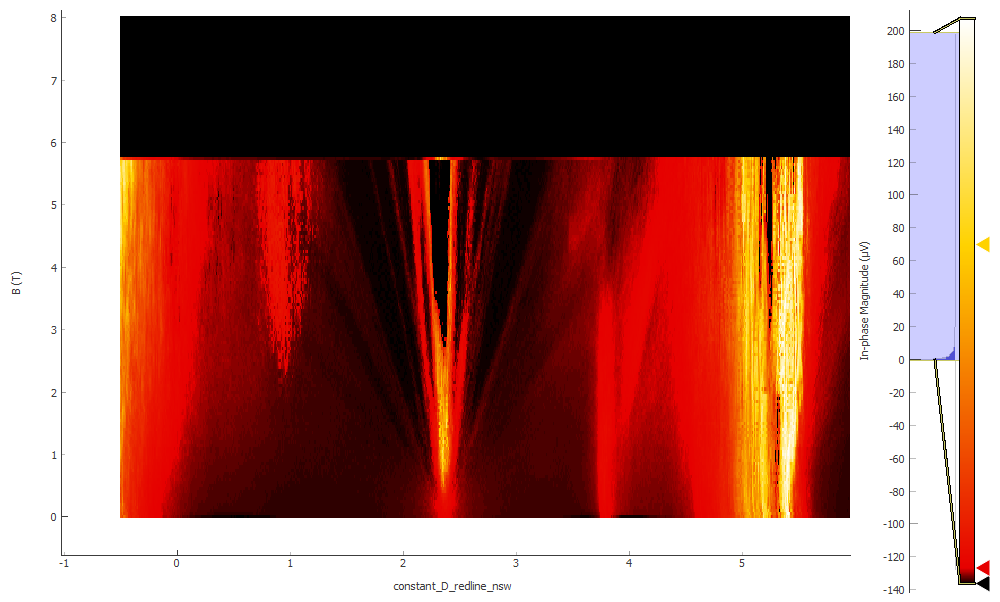

In [49]:
plot133[0]

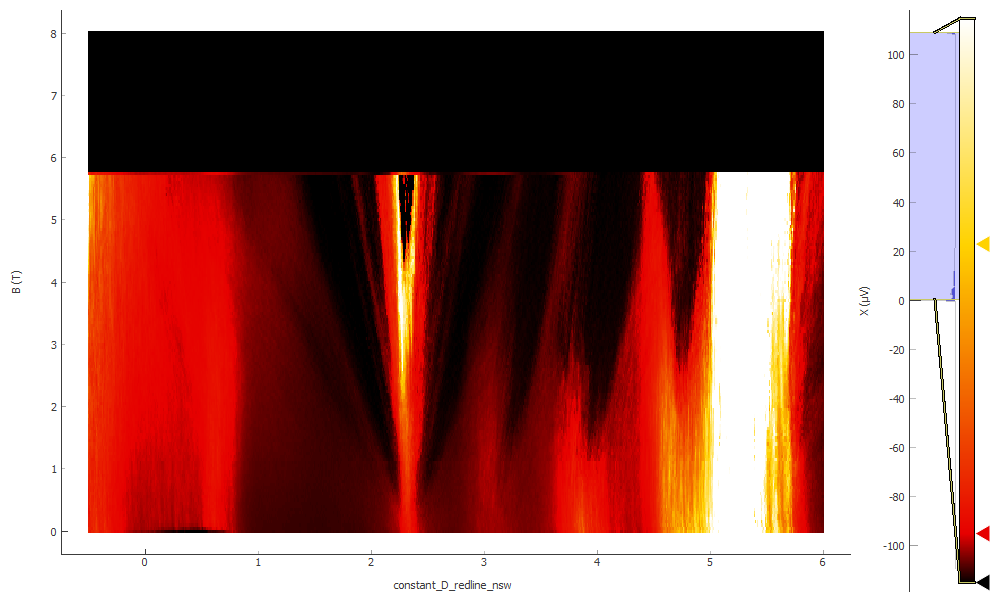

In [50]:
plot133[2]

In [15]:
triton.magnet_sweeprate(0.1)

In [16]:
triton.field(5.6)

Sweep time approximately 3370.0 seconds


In [43]:
triton.read_temps()

MC - on:  0.0463536 K
MC_cernox - off:  321.181 K
still - off:  0.725779 K
cold_plate - off:  0.0643325 K
magnet - on:  4.48513 K
PT2h - off:  3.33546 K
PT2p - off:  3.53654 K
PT1h - off:  46.9204 K
PT1p - off:  60.8963 K


In [19]:
# 0 T for one night

In [37]:
triton.magnet_sweeprate()

0.1

In [44]:
triton.field()

2.39852

In [45]:
constant_D_redline_nsw(6)
time.sleep(60)

In [46]:
bgnvals = np.linspace(6, -0.5, 651)
bvals = np.linspace(5.7, 8, 47)
data134, plot134 = npd.twod_param_sweep(triton.field_set_stable, bvals, constant_D_redline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=20, SetDelay2=1.2, Param2_SetBetween=6, DataName='M30_865_29-28_830_40-41_1nA_baseT_B-n_redline_sweep')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-23 11:34:05
Please wait 10.006 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.988 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.018 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.994 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.988 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 39.976 seconds for the field sweep, plus the time required for operating the switch...
Please wait 40.0 seconds for the field sweep, plus the time required for operating

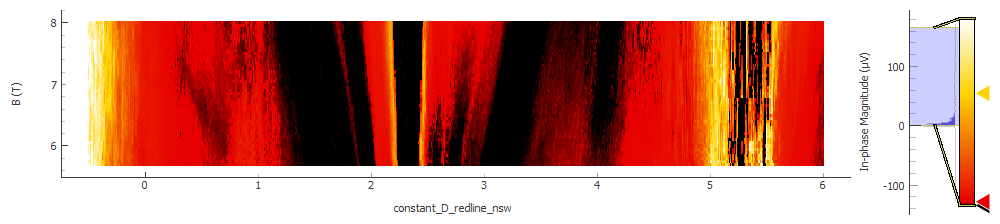

In [47]:
plot134[0]

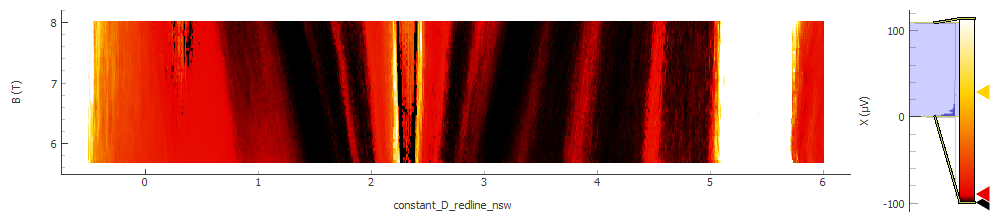

In [48]:
plot134[2]

In [10]:
def constant_D_orangeline_nsw(Vb):
    slDrc = -0.2058088083627785
    srframe.volt_p1(Vb)
    srdc.volt(-slDrc*Vb + 2.9)
    
constant_D_orangeline_nsw = qc.Parameter('constant_D_orangeline_nsw', set_cmd=constant_D_orangeline_nsw)

In [106]:
constant_D_orangeline_nsw(-13.6)

In [110]:
time.sleep(60)

In [111]:
bgnvals = np.linspace(-13.6, -6.8, 341)
bvals = np.linspace(7.4, 8, 13)
data135, plot135 = npd.twod_param_sweep(triton.field_set_stable, bvals, constant_D_orangeline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=20, SetDelay2=1.2, Param2_SetBetween=-13.6, DataName='M30_865_29-28_830_40-41_1nA_baseT_B-n_orangeline_sweep')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-24 16:12:05
Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 30.003999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.98 seconds for the field sweep, plus the time required for operating the switch...
Please wait 29.997999999999998 seconds for the field sweep, plus the time required for operating the switch.

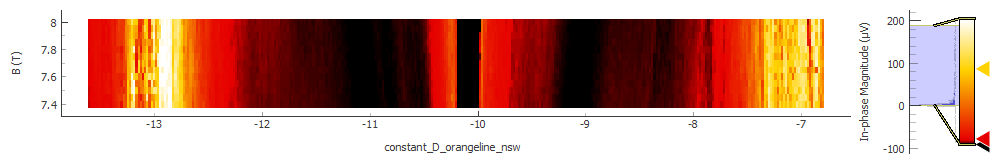

In [113]:
plot135[0]

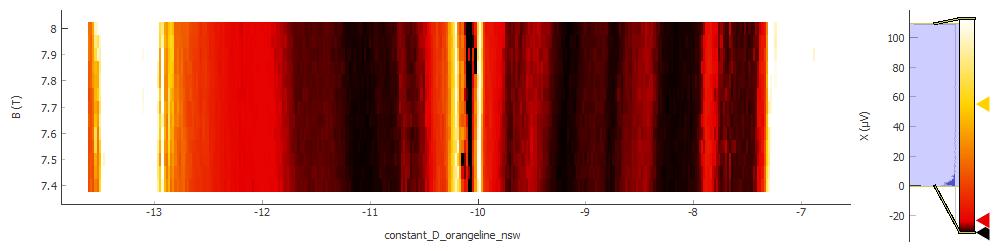

In [115]:
plot135[2]

In [177]:
triton.field()

1.48112

In [137]:
triton.magnet_sweeprate(0.15)

In [ ]:
triton.magnet_swh()

In [179]:
triton.read_temps()

MC - on:  0.0649567 K
MC_cernox - off:  321.181 K
still - off:  0.725779 K
cold_plate - off:  0.0643325 K
magnet - on:  4.6179 K
PT2h - off:  3.33546 K
PT2p - off:  3.53654 K
PT1h - off:  46.9204 K
PT1p - off:  60.8963 K


# T dependence along different constant D line cut

In [181]:
lockin865.amplitude(0.05)

In [11]:
def zerofieldsw(Vb):
    slDrc = -0.2058088083627785
    srframe.volt_p1(Vb)
    srdc.volt(-slDrc*Vb)
    
zeroDparam = qc.Parameter('zeroDparam', set_cmd=zerofieldsw)

In [182]:
constant_D_orangeline_nsw(-13.6)

In [183]:
#orangeline
constant_D_orangeline_nsw(-13.6)
time.sleep(60)
bgnvals = np.linspace(-13.6, -6.8, 341)
data136, plot136 = npd.single_param_sweep(constant_D_orangeline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29_830_40-41_0.5nA_-0p8mT_orangeline_sweep', YParam=[lockin865.X, lockin830.X])
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-24 23:05:11
DataSet:
   location = 'data/2020-05-24/#003_M30_865_28-29_830_40-41_0.5nA_-0p8mT_orangeline_sweep_23-05-10'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (341,)
   Measured | lockin865_X                   | X                         | (341,)
   Measured | lockin865_Y                   | Y                         | (341,)
   Measured | lockin830_X                   | X                         | (341,)
   Measured | lockin830_Y                   | Y                         | (341,)
Finished at 2020-05-24 23:12:51


In [145]:
data_other1 = qc.load_data('data/2020-05-11/#012_M30_865_40-41__830_28-29_0.5nA_-0p8mT_orangeline_sweep_15-51-36')

<IPython.core.display.Javascript object>


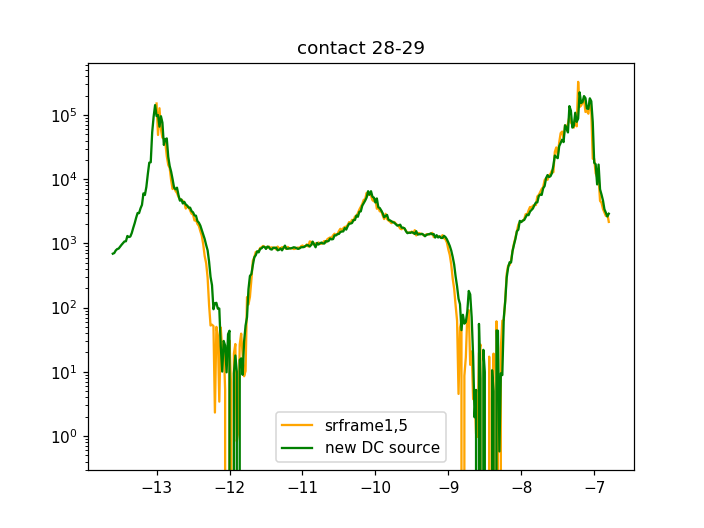

In [184]:
plt.figure()
plt.semilogy(data_other1.constant_D_orangeline_nsw_set[:], npd.Rxxfromdata(data_other1, 0.5e-9, 'lockin865'), label='srframe1,5', color='orange')
plt.semilogy(data136.constant_D_orangeline_nsw_set[:], npd.Rxxfromdata(data136, 0.5e-9, 'lockin865'), label='new DC source', color='green')
plt.title('contact 28-29')
plt.legend()

In [185]:
zeroDparam(-7.5)

In [186]:
#D = 0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 451)
data137, plot137 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29__830_40-41_0.5nA_-0p8mT_D0sweep', YParam=[lockin865.X, lockin830.X])
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-24 23:16:04
DataSet:
   location = 'data/2020-05-24/#004_M30_865_28-29__830_40-41_0.5nA_-0p8mT_D0sweep_23-16-03'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (451,)
   Measured | lockin865_X    | X            | (451,)
   Measured | lockin865_Y    | Y            | (451,)
   Measured | lockin830_X    | X            | (451,)
   Measured | lockin830_Y    | Y            | (451,)
Finished at 2020-05-24 23:26:22


In [151]:
data_other2 = qc.load_data('data/2020-05-11/#006_M30_865_40-41__830_28-29_0.5nA_-0p8mT_D0sweep_12-42-35')

<IPython.core.display.Javascript object>


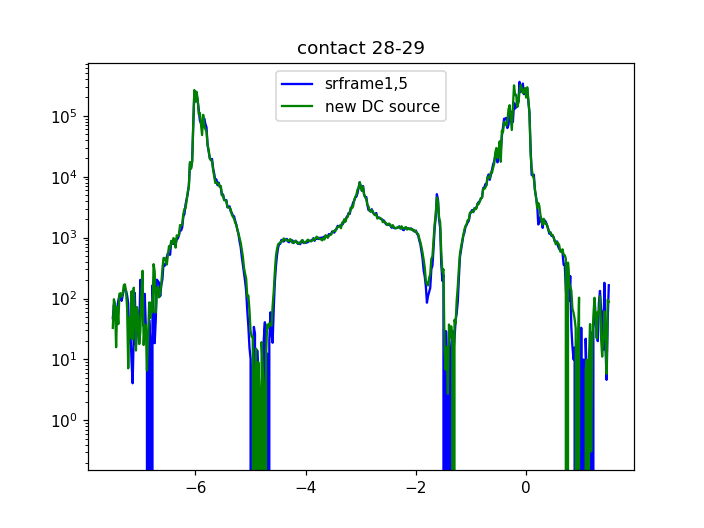

In [187]:
plt.figure()
plt.semilogy(data_other2.zeroDparam_set[:], npd.Rxxfromdata(data_other2, 0.5e-9, 'lockin865'), label='srframe1,5', color='blue')
plt.semilogy(data137.zeroDparam_set[:], npd.Rxxfromdata(data137, 0.5e-9, 'lockin865'), label='new DC source', color='green')
plt.title('contact 28-29')
plt.legend()

In [188]:
constant_D_redline_nsw(6)

In [189]:
constant_D_redline_nsw(6)
time.sleep(60)
bgnvals = np.linspace(6, -0.5, 326)
data138, plot138 = npd.single_param_sweep(constant_D_redline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29_830_40-41_0.5nA_-0p8mT_redline_sweep', YParam=[lockin865.X, lockin830.X])
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-24 23:28:30
DataSet:
   location = 'data/2020-05-24/#005_M30_865_28-29_830_40-41_0.5nA_-0p8mT_redline_sweep_23-28-29'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (326,)
   Measured | lockin865_X                | X                      | (326,)
   Measured | lockin865_Y                | Y                      | (326,)
   Measured | lockin830_X                | X                      | (326,)
   Measured | lockin830_Y                | Y                      | (326,)
Finished at 2020-05-24 23:35:49


In [156]:
data_other3 = qc.load_data('data/2020-05-11/#008_M30_865_40-41__830_28-29_0.5nA_-0p8mT_redline_sweep_14-41-14')

<IPython.core.display.Javascript object>


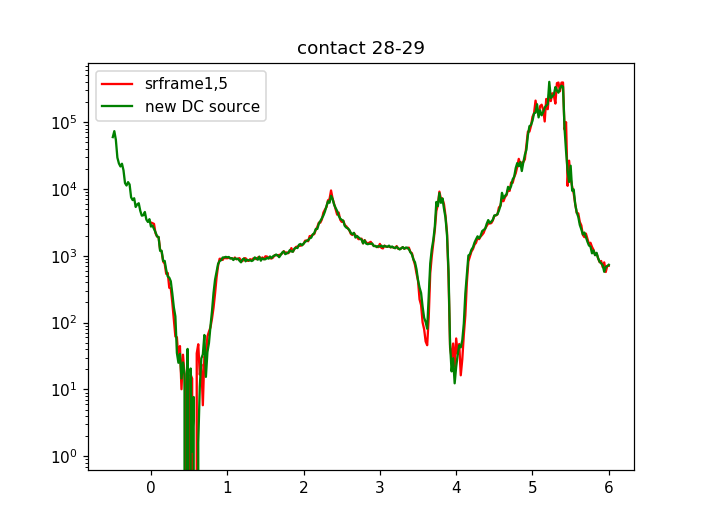

In [190]:
plt.figure()
plt.semilogy(data_other3.constant_D_redline_nsw_set[:], npd.Rxxfromdata(data_other3, 0.5e-9, 'lockin865'), label='srframe1,5', color='red')
plt.semilogy(data138.constant_D_redline_nsw_set[:], npd.Rxxfromdata(data138, 0.5e-9, 'lockin865'), label='new DC source', color='green')
plt.title('contact 28-29')
plt.legend()

In [191]:
constant_D_orangeline_nsw(-13.6)

In [192]:
#orangeline base T cable unplugged
constant_D_orangeline_nsw(-13.6)
time.sleep(60)
bgnvals = np.linspace(-13.6, -6.8, 681)
data139, plot139 = npd.single_param_sweep(constant_D_orangeline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29_830_40-41_0p5nA_-0p8mT_orangeline_sweep', YParam=[lockin865.X, lockin830.X])
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-24 23:38:16
DataSet:
   location = 'data/2020-05-24/#006_M30_865_28-29_830_40-41_0p5nA_-0p8mT_orangeline_sweep_23-38-15'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (681,)
   Measured | lockin865_X                   | X                         | (681,)
   Measured | lockin865_Y                   | Y                         | (681,)
   Measured | lockin830_X                   | X                         | (681,)
   Measured | lockin830_Y                   | Y                         | (681,)
Finished at 2020-05-24 23:53:33


In [193]:
triton.pid_range(3.16)

In [194]:
triton.pid_setpoint(0.05)

In [195]:
triton.pid_mode(1)

In [196]:
triton.pid_range(10)

In [197]:
constant_D_orangeline_nsw(-13.6)

In [198]:
constant_D_orangeline_nsw(-13.6)
time.sleep(60)
Tvals = np.linspace(0.05, 1, 20)
bgnvals = np.linspace(-13.6, -6.8, 681)
data140, plot140 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, constant_D_orangeline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=-13.6, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweepto1K_orangeline_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-25 00:00:48
DataSet:
   location = 'data/2020-05-25/#001_M30_865_28-29_830_40-41_0p5nA_gateTsweepto1K_orangeline_0p5nA_00-00-45'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | triton_pid_setpoint_set       | pid_setpoint              | (20,)
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (20, 681)
   Measured | lockin865_X                   | X                         | (20, 681)
   Measured | lockin865_Y                   | Y                         | (20, 681)
   Measured | lockin830_X                   | X                         | (20, 681)
   Measured | lockin830_Y                   | Y                         | (20, 681)
Finished at 2020-05-25 06:25:33


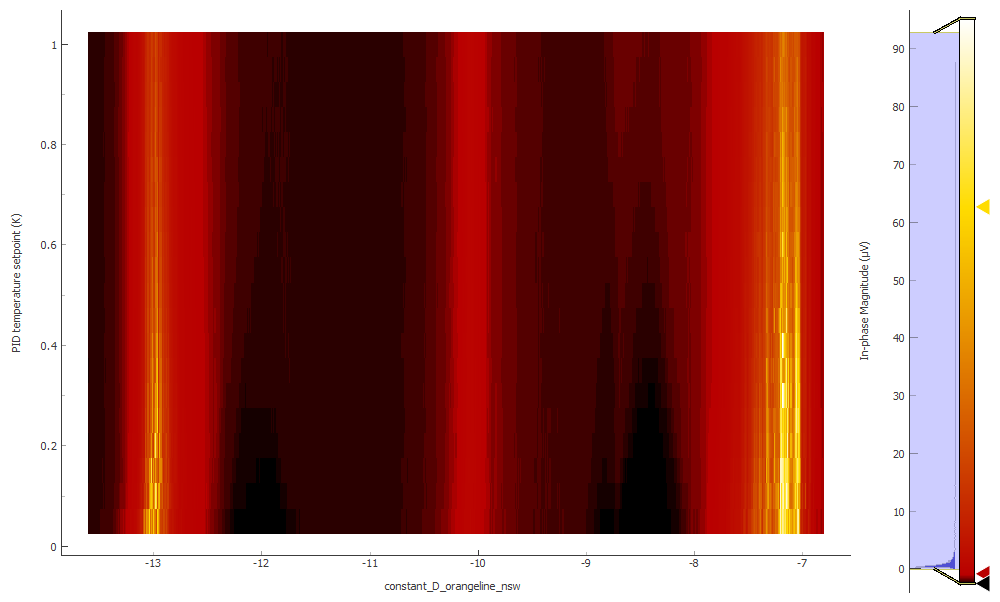

In [233]:
plot140[0]

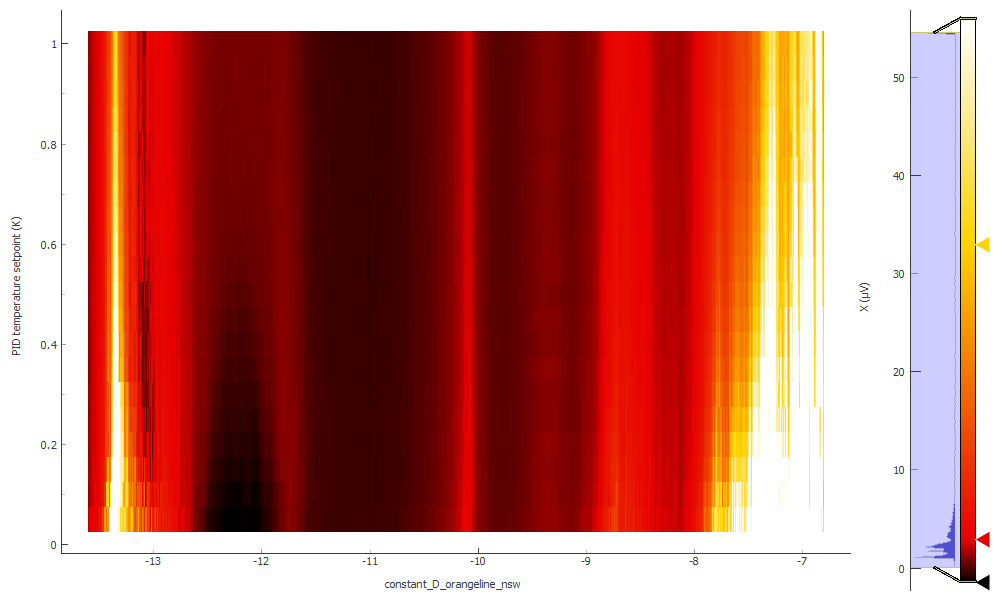

In [234]:
plot140[2]

In [199]:
triton.pid_range(31.6)
time.sleep(10)

In [200]:
triton.pid_setpoint(1.1)

In [201]:
constant_D_orangeline_nsw(-13.6)
time.sleep(60)
Tvals = np.linspace(1.1, 1.4, 4)
bgnvals = np.linspace(-13.6, -6.8, 681)
data141, plot141 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, constant_D_orangeline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=-13.6, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep1p1to1p4K_orangeline_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-25 06:27:40
DataSet:
   location = 'data/2020-05-25/#002_M30_865_28-29_830_40-41_0p5nA_gateTsweep1p1to1p4K_orangeline_0p5nA_06-27-37'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | triton_pid_setpoint_set       | pid_setpoint              | (4,)
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (4, 681)
   Measured | lockin865_X                   | X                         | (4, 681)
   Measured | lockin865_Y                   | Y                         | (4, 681)
   Measured | lockin830_X                   | X                         | (4, 681)
   Measured | lockin830_Y                   | Y                         | (4, 681)
Finished at 2020-05-25 07:44:41


In [202]:
triton.pid_range(100)
time.sleep(10)

In [203]:
triton.pid_setpoint(1.5)

In [204]:
constant_D_orangeline_nsw(-13.6)
time.sleep(60)
Tvals = np.linspace(1.5, 2, 6)
bgnvals = np.linspace(-13.6, -6.8, 681)
data142, plot142 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, constant_D_orangeline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=-13.6, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep1p5to2K_orangeline_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-25 07:46:48
DataSet:
   location = 'data/2020-05-25/#003_M30_865_28-29_830_40-41_0p5nA_gateTsweep1p5to2K_orangeline_0p5nA_07-46-45'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | triton_pid_setpoint_set       | pid_setpoint              | (6,)
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (6, 681)
   Measured | lockin865_X                   | X                         | (6, 681)
   Measured | lockin865_Y                   | Y                         | (6, 681)
   Measured | lockin830_X                   | X                         | (6, 681)
   Measured | lockin830_Y                   | Y                         | (6, 681)
Finished at 2020-05-25 09:42:14


In [205]:
triton.pid_setpoint(2.1)

In [206]:
constant_D_orangeline_nsw(-13.6)
time.sleep(60)
Tvals = np.linspace(2.1, 10, 80)
bgnvals = np.linspace(-13.6, -6.8, 681)
data143, plot143 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, constant_D_orangeline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=-13.6, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep2p1to10K_orangeline_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-25 11:57:49
DataSet:
   location = 'data/2020-05-25/#004_M30_865_28-29_830_40-41_0p5nA_gateTsweep2p1to10K_orangeline_0p5nA_11-57-46'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | triton_pid_setpoint_set       | pid_setpoint              | (80,)
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (80, 681)
   Measured | lockin865_X                   | X                         | (80, 681)
   Measured | lockin865_Y                   | Y                         | (80, 681)
   Measured | lockin830_X                   | X                         | (80, 681)
   Measured | lockin830_Y                   | Y                         | (80, 681)
Finished at 2020-05-26 13:37:44


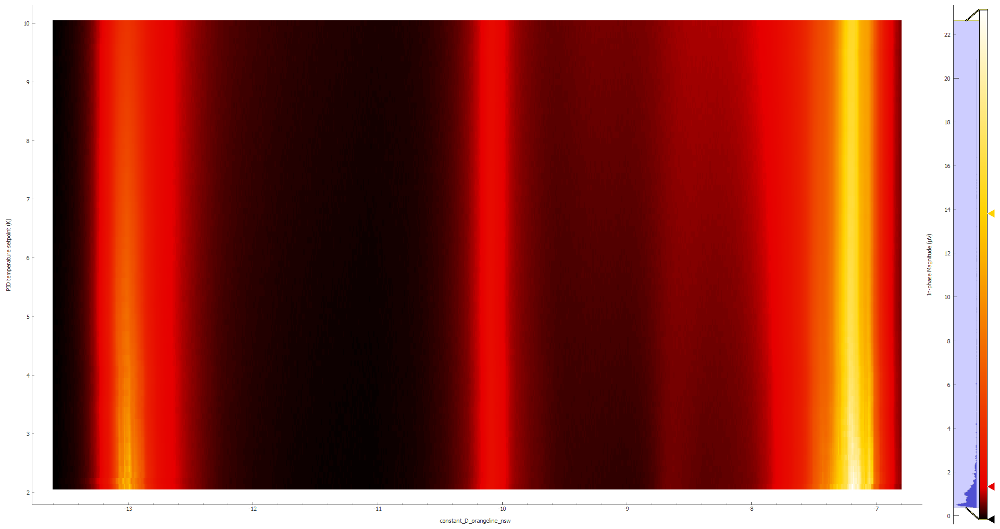

In [235]:
plot143[0]

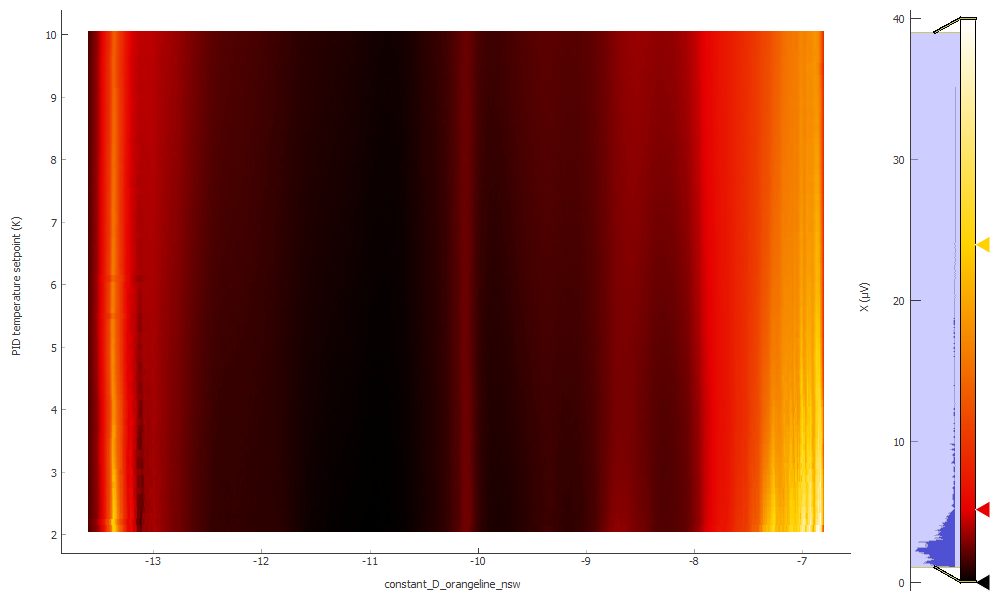

In [236]:
plot143[2]

In [207]:
triton.pid_setpoint(11)

In [208]:
constant_D_orangeline_nsw(-13.6)
time.sleep(60)
Tvals = np.linspace(11, 30, 20)
bgnvals = np.linspace(-13.6, -6.8, 681)
data144, plot144 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, constant_D_orangeline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.1, Param2_SetBetween=-13.6, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep11to30K_orangeline_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-26 13:57:05
DataSet:
   location = 'data/2020-05-26/#001_M30_865_28-29_830_40-41_0p5nA_gateTsweep11to30K_orangeline_0p5nA_13-57-02'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | triton_pid_setpoint_set       | pid_setpoint              | (20,)
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (20, 681)
   Measured | lockin865_X                   | X                         | (20, 681)
   Measured | lockin865_Y                   | Y                         | (20, 681)
   Measured | lockin830_X                   | X                         | (20, 681)
   Measured | lockin830_Y                   | Y                         | (20, 681)
Finished at 2020-05-26 19:55:59


In [210]:
triton.pid_setpoint(31)

In [211]:
constant_D_orangeline_nsw(-13.6)
time.sleep(60)
Tvals = np.linspace(31, 40, 10)
bgnvals = np.linspace(-13.6, -6.8, 681)
data145, plot145 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, constant_D_orangeline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=420, SetDelay2=1.1, Param2_SetBetween=-13.6, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep31to40K_orangeline_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-26 20:11:01
DataSet:
   location = 'data/2020-05-26/#002_M30_865_28-29_830_40-41_0p5nA_gateTsweep31to40K_orangeline_0p5nA_20-10-58'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | triton_pid_setpoint_set       | pid_setpoint              | (10,)
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (10, 681)
   Measured | lockin865_X                   | X                         | (10, 681)
   Measured | lockin865_Y                   | Y                         | (10, 681)
   Measured | lockin830_X                   | X                         | (10, 681)
   Measured | lockin830_Y                   | Y                         | (10, 681)
Finished at 2020-05-26 23:40:27


In [213]:
triton.pid_mode(0)

In [232]:
triton.read_temps()

MC - on:  0.0319642 K
MC_cernox - on:  321.181 K
still - on:  0.726745 K
cold_plate - off:  0.0643325 K
magnet - off:  4.20814 K
PT2h - off:  3.33546 K
PT2p - off:  3.53654 K
PT1h - off:  46.9204 K
PT1p - off:  60.8963 K


In [237]:
constant_D_redline_nsw(6)
time.sleep(60)
bgnvals = np.linspace(6, -0.5, 326)
data146, plot146 = npd.single_param_sweep(constant_D_redline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29_830_40-41_0.5nA_-0p8mT_redline_sweep', YParam=[lockin865.X, lockin830.X])
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-27 09:49:44
DataSet:
   location = 'data/2020-05-27/#001_M30_865_28-29_830_40-41_0.5nA_-0p8mT_redline_sweep_09-49-43'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (326,)
   Measured | lockin865_X                | X                      | (326,)
   Measured | lockin865_Y                | Y                      | (326,)
   Measured | lockin830_X                | X                      | (326,)
   Measured | lockin830_Y                | Y                      | (326,)
Finished at 2020-05-27 09:57:04


<IPython.core.display.Javascript object>


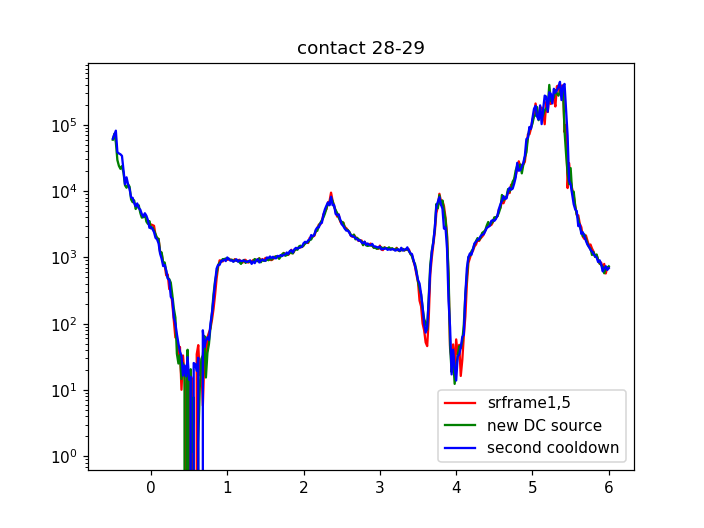

In [249]:
plt.figure()
plt.semilogy(data_other3.constant_D_redline_nsw_set[:], npd.Rxxfromdata(data_other3, 0.5e-9, 'lockin865'), label='srframe1,5', color='red')
plt.semilogy(data138.constant_D_redline_nsw_set[:], npd.Rxxfromdata(data138, 0.5e-9, 'lockin865'), label='new DC source', color='green')
plt.semilogy(data146.constant_D_redline_nsw_set[:], npd.Rxxfromdata(data146, 0.5e-9, 'lockin865'), label='second cooldown', color='blue')
plt.title('contact 28-29')
plt.legend()

In [241]:
#redline base T cable unplugged
constant_D_redline_nsw(6)
time.sleep(60)
bgnvals = np.linspace(6, -0.5, 651)
data147, plot147 = npd.single_param_sweep(constant_D_redline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29_830_40-41_0.5nA_-0p8mT_redline_sweep', YParam=[lockin865.X, lockin830.X])
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-27 10:01:40
DataSet:
   location = 'data/2020-05-27/#002_M30_865_28-29_830_40-41_0.5nA_-0p8mT_redline_sweep_10-01-39'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (651,)
   Measured | lockin865_X                | X                      | (651,)
   Measured | lockin865_Y                | Y                      | (651,)
   Measured | lockin830_X                | X                      | (651,)
   Measured | lockin830_Y                | Y                      | (651,)
Finished at 2020-05-27 10:16:18


In [246]:
triton.pid_range(10)

In [243]:
triton.pid_setpoint(0.05)

In [247]:
triton.pid_mode(1)

In [250]:
constant_D_redline_nsw(6)
time.sleep(60)
Tvals = np.linspace(0.05, 1, 20)
bgnvals = np.linspace(6, -0.5, 651)
data148, plot148 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, constant_D_redline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=6, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweepto1K_redline_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-27 10:26:47
DataSet:
   location = 'data/2020-05-27/#003_M30_865_28-29_830_40-41_0p5nA_gateTsweepto1K_redline_0p5nA_10-26-44'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | triton_pid_setpoint_set    | pid_setpoint           | (20,)
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (20, 651)
   Measured | lockin865_X                | X                      | (20, 651)
   Measured | lockin865_Y                | Y                      | (20, 651)
   Measured | lockin830_X                | X                      | (20, 651)
   Measured | lockin830_Y                | Y                      | (20, 651)
Finished at 2020-05-27 16:36:58


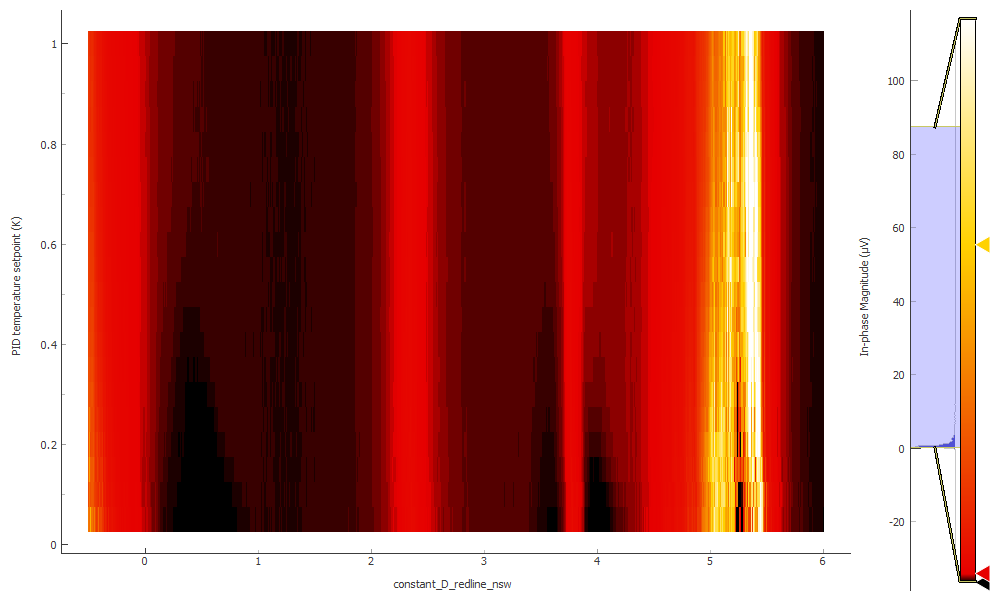

In [272]:
plot148[0]

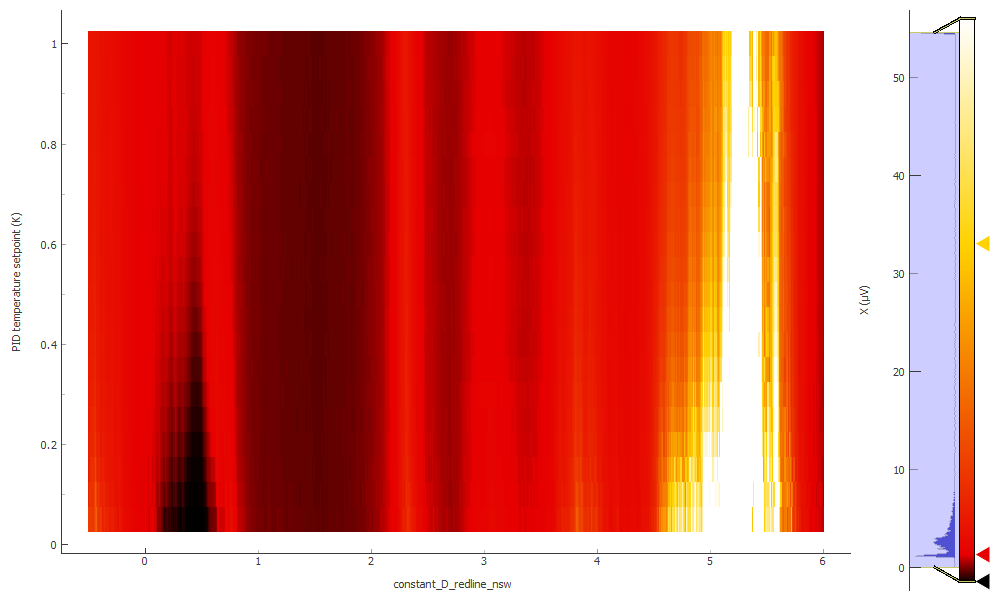

In [273]:
plot148[2]

In [251]:
triton.pid_range(31.6)
time.sleep(10)

In [252]:
triton.pid_setpoint(1.1)

In [253]:
constant_D_redline_nsw(6)
time.sleep(60)
Tvals = np.linspace(1.1, 1.4, 4)
bgnvals = np.linspace(6, -0.5, 651)
data149, plot149 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, constant_D_redline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=6, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep1p1to1p4K_redline_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-27 16:38:38
DataSet:
   location = 'data/2020-05-27/#004_M30_865_28-29_830_40-41_0p5nA_gateTsweep1p1to1p4K_redline_0p5nA_16-38-35'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | triton_pid_setpoint_set    | pid_setpoint           | (4,)
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (4, 651)
   Measured | lockin865_X                | X                      | (4, 651)
   Measured | lockin865_Y                | Y                      | (4, 651)
   Measured | lockin830_X                | X                      | (4, 651)
   Measured | lockin830_Y                | Y                      | (4, 651)
Finished at 2020-05-27 17:52:40


In [254]:
triton.pid_range(100)
time.sleep(10)

In [255]:
triton.pid_setpoint(1.5)

In [256]:
constant_D_redline_nsw(6)
time.sleep(60)
Tvals = np.linspace(1.5, 2, 6)
bgnvals = np.linspace(6, -0.5, 651)
data150, plot150 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, constant_D_redline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=6, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep1p5to2K_redline_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-27 17:54:20
DataSet:
   location = 'data/2020-05-27/#005_M30_865_28-29_830_40-41_0p5nA_gateTsweep1p5to2K_redline_0p5nA_17-54-18'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | triton_pid_setpoint_set    | pid_setpoint           | (6,)
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (6, 651)
   Measured | lockin865_X                | X                      | (6, 651)
   Measured | lockin865_Y                | Y                      | (6, 651)
   Measured | lockin830_X                | X                      | (6, 651)
   Measured | lockin830_Y                | Y                      | (6, 651)
Finished at 2020-05-27 19:45:27


In [257]:
triton.pid_range(100)

In [258]:
triton.pid_mode(1)

In [259]:
triton.pid_setpoint(2.1)

In [260]:
constant_D_redline_nsw(6)
time.sleep(60)
Tvals = np.linspace(2.1, 10, 80)
bgnvals = np.linspace(6, -0.5, 651)
data151, plot151 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, constant_D_redline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=6, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep2p1to10K_redline_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-27 20:12:55
DataSet:
   location = 'data/2020-05-27/#006_M30_865_28-29_830_40-41_0p5nA_gateTsweep2p1to10K_redline_0p5nA_20-12-53'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | triton_pid_setpoint_set    | pid_setpoint           | (80,)
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (80, 651)
   Measured | lockin865_X                | X                      | (80, 651)
   Measured | lockin865_Y                | Y                      | (80, 651)
   Measured | lockin830_X                | X                      | (80, 651)
   Measured | lockin830_Y                | Y                      | (80, 651)
Finished at 2020-05-28 20:56:46


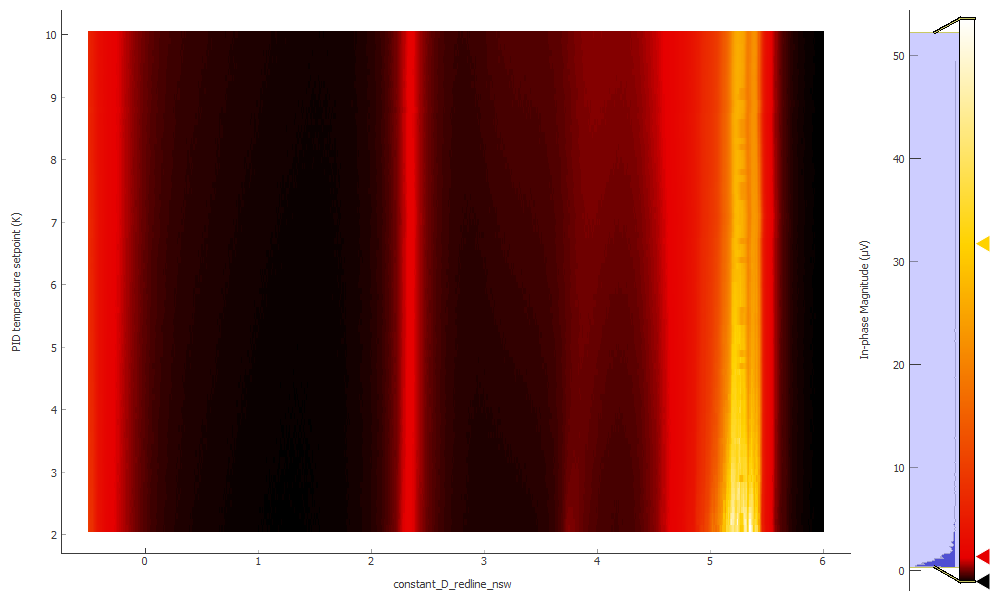

In [274]:
plot151[0]

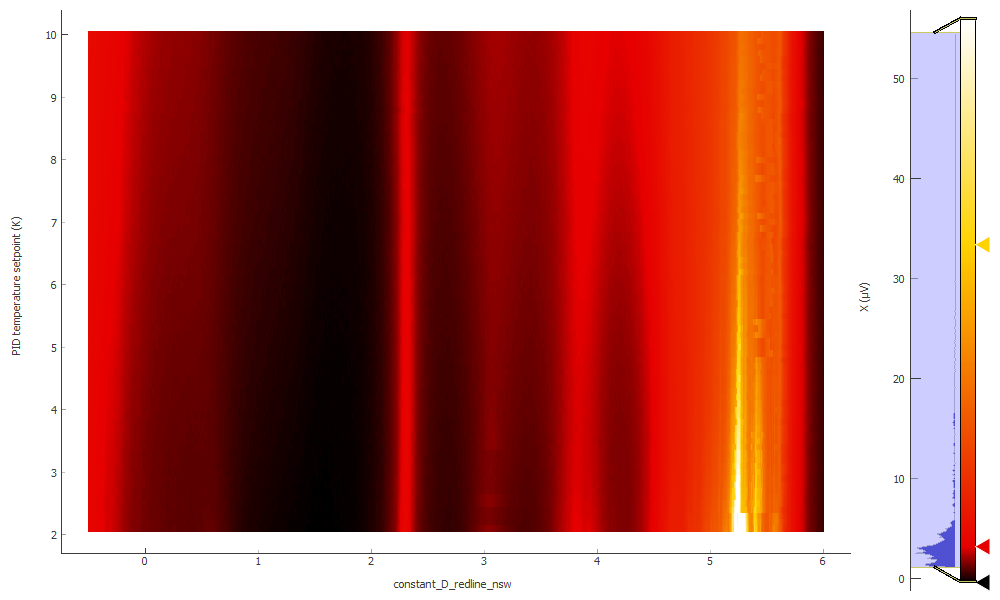

In [275]:
plot151[2]

In [261]:
triton.pid_setpoint(11)

In [262]:
constant_D_redline_nsw(6)
time.sleep(60)
Tvals = np.linspace(11, 30, 20)
bgnvals = np.linspace(6, -0.5, 651)
data152, plot152 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, constant_D_redline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.1, Param2_SetBetween=6, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep11to30K_redline_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-28 21:13:40
DataSet:
   location = 'data/2020-05-28/#001_M30_865_28-29_830_40-41_0p5nA_gateTsweep11to30K_redline_0p5nA_21-13-37'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | triton_pid_setpoint_set    | pid_setpoint           | (20,)
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (20, 651)
   Measured | lockin865_X                | X                      | (20, 651)
   Measured | lockin865_Y                | Y                      | (20, 651)
   Measured | lockin830_X                | X                      | (20, 651)
   Measured | lockin830_Y                | Y                      | (20, 651)
Finished at 2020-05-29 03:00:05


In [263]:
triton.write('SET:DEV:V1:VALV:SIG:STATE:CLOSE')

In [264]:
time.sleep(60)

In [265]:
triton.pid_setpoint(31)

In [266]:
constant_D_redline_nsw(6)
time.sleep(60)
Tvals = np.linspace(31, 40, 10)
bgnvals = np.linspace(6, -0.5, 651)
data153, plot153 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, constant_D_redline_nsw, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=420, SetDelay2=1.1, Param2_SetBetween=6, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep31to40K_redline_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-05-29 03:02:35
DataSet:
   location = 'data/2020-05-29/#001_M30_865_28-29_830_40-41_0p5nA_gateTsweep31to40K_redline_0p5nA_03-02-32'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | triton_pid_setpoint_set    | pid_setpoint           | (10,)
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (10, 651)
   Measured | lockin865_X                | X                      | (10, 651)
   Measured | lockin865_Y                | Y                      | (10, 651)
   Measured | lockin830_X                | X                      | (10, 651)
   Measured | lockin830_Y                | Y                      | (10, 651)
Finished at 2020-05-29 06:26:07


In [268]:
triton.pid_mode(0)

In [270]:
lockin865.amplitude(0)

full cooldown

In [282]:
triton.read_temps()

MC - on:  10.5236 K
MC_cernox - on:  10.4771 K
still - on:  8.95689 K
cold_plate - off:  0.0643325 K
magnet - off:  4.20814 K
PT2h - off:  3.33546 K
PT2p - off:  3.53654 K
PT1h - off:  46.9204 K
PT1p - off:  60.8963 K


In [283]:
triton.close()

# after the power outage

In [388]:
triton.close()

In [389]:
npd.instrumentinitialize.triton_instrs('triton')

Connected to: OXFORD INSTRUMENTS Triton (serial:N/A, firmware:2.449) in 0.01s


In [81]:
triton.alltempsenable()

In [249]:
triton.read_temps()

MC - on:  1.14789 K
MC_cernox - on:  1.21336 K
still - on:  0.956455 K
cold_plate - off:  0.0667477 K
magnet - off:  3.80367 K
PT2h - off:  3.20227 K
PT2p - off:  3.38735 K
PT1h - off:  46.4802 K
PT1p - off:  57.0621 K


In [248]:
triton.read_pressures()

P1:  44.5226
P2:  1100.63
P3:  1.25
P4:  6.0
P5:  190.939
POVC:  0.0003


In [233]:
triton.read_valves()

V1:  OPEN
V2:  CLOSE
V3:  CLOSE
V4:  CLOSE
V5:  OPEN
V6:  CLOSE
V7:  CLOSE
V8:  CLOSE
V9:  CLOSE


In [247]:
triton.read_pumps()

Turbo: 1,  speed: 508.0 Hz
KNF: 1
Forepump: 1


In [215]:
triton.action()

'Condensing'

In [372]:
triton.write('SET:SYS:DR:ACTN:STOP')

In [251]:
triton.write('SET:DEV:V9:VALV:SIG:STATE:CLOSE')

In [243]:
triton.write('SET:DEV:V9:VALV:SIG:STATE:OPEN')

In [150]:
triton.write('SET:DEV:V2:VALV:SIG:STATE:OPEN')

In [159]:
triton.ask('READ:DEV:COMP:PUMP:SIG:STATE')

'STAT:DEV:COMP:PUMP:SIG:STATE:ON'

In [374]:
for i in range(1, 10):
    triton.write('SET:DEV:V' + str(i) + ':VALV:SIG:STATE:CLOSE')

In [375]:
triton.write('SET:DEV:COMP:PUMP:SIG:STATE:OFF')
triton.write('SET:DEV:FP:PUMP:SIG:STATE:OFF')
triton.write('SET:DEV:TURB1:PUMP:SIG:STATE:OFF')

In [171]:
triton.write('SET:SYS:DR:ACTN:CLDN')

In [307]:
triton.ask('SET:DEV:FP:PUMP:SIG:STATE:OFF')

'STAT:SET:DEV:FP:PUMP:SIG:STATE:OFF:VALID'

In [359]:
triton.ask('READ:DEV:C1:PTC:SIG:MCUR')

'STAT:DEV:C1:PTC:SIG:MCUR:31.631A'

In [373]:
triton.write('SET:DEV:V4:VALV:SIG:STATE:CLOSE')

In [123]:
srdc.output(1)

In [124]:
lockin865.amplitude(0.05)

In [130]:
zeroDparam(-7.5)

In [131]:
#D = 0
zeroDparam(-7.5)
time.sleep(60)
bgnvals = np.linspace(-7.5, 1.5, 451)
data154, plot154 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29__830_40-41_0.5nA_-0p8mT_D0sweep', YParam=[lockin865.X, lockin830.X])
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-04 10:41:52
DataSet:
   location = 'data/2020-06-04/#001_M30_865_28-29__830_40-41_0.5nA_-0p8mT_D0sweep_10-41-48'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (451,)
   Measured | lockin865_X    | X            | (451,)
   Measured | lockin865_Y    | Y            | (451,)
   Measured | lockin830_X    | X            | (451,)
   Measured | lockin830_Y    | Y            | (451,)
Finished at 2020-06-04 10:51:58


In [132]:
data_other1 = qc.load_data('data/2020-05-24/#004_M30_865_28-29__830_40-41_0.5nA_-0p8mT_D0sweep_23-16-03')

<IPython.core.display.Javascript object>


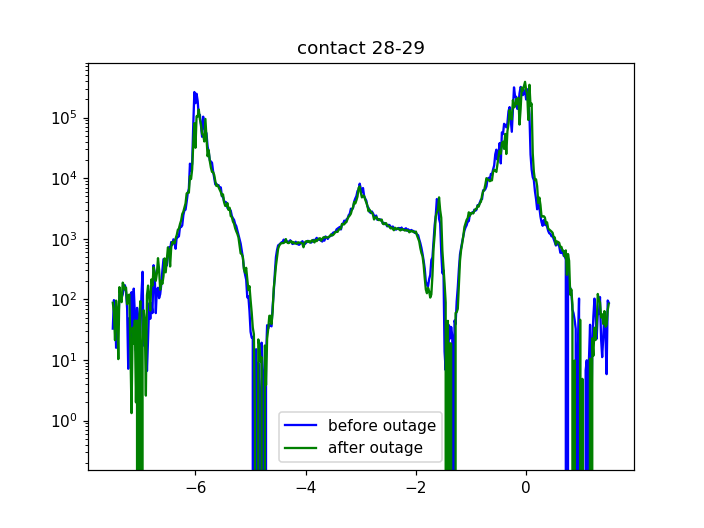

In [158]:
plt.figure()
plt.semilogy(data_other1.zeroDparam_set[:], npd.Rxxfromdata(data_other1, 0.5e-9, 'lockin865'), label='before outage', color='blue')
plt.semilogy(data154.zeroDparam_set[:], npd.Rxxfromdata(data154, 0.5e-9, 'lockin865'), label='after outage', color='green')
plt.title('contact 28-29')
plt.legend()

In [140]:
constant_D_orangeline_nsw(-13.6)

In [141]:
#orangeline
constant_D_orangeline_nsw(-13.6)
time.sleep(60)
bgnvals = np.linspace(-13.6, -6.8, 341)
data155, plot155 = npd.single_param_sweep(constant_D_orangeline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29_830_40-41_0.5nA_-0p8mT_orangeline_sweep', YParam=[lockin865.X, lockin830.X])
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-04 10:58:21
DataSet:
   location = 'data/2020-06-04/#002_M30_865_28-29_830_40-41_0.5nA_-0p8mT_orangeline_sweep_10-58-20'
   <Type>   | <array_id>                    | <array.name>              | <array.shape>
   Setpoint | constant_D_orangeline_nsw_set | constant_D_orangeline_nsw | (341,)
   Measured | lockin865_X                   | X                         | (341,)
   Measured | lockin865_Y                   | Y                         | (341,)
   Measured | lockin830_X                   | X                         | (341,)
   Measured | lockin830_Y                   | Y                         | (341,)
Finished at 2020-06-04 11:05:59


In [142]:
data_other2 = qc.load_data('data/2020-05-24/#003_M30_865_28-29_830_40-41_0.5nA_-0p8mT_orangeline_sweep_23-05-10')

<IPython.core.display.Javascript object>


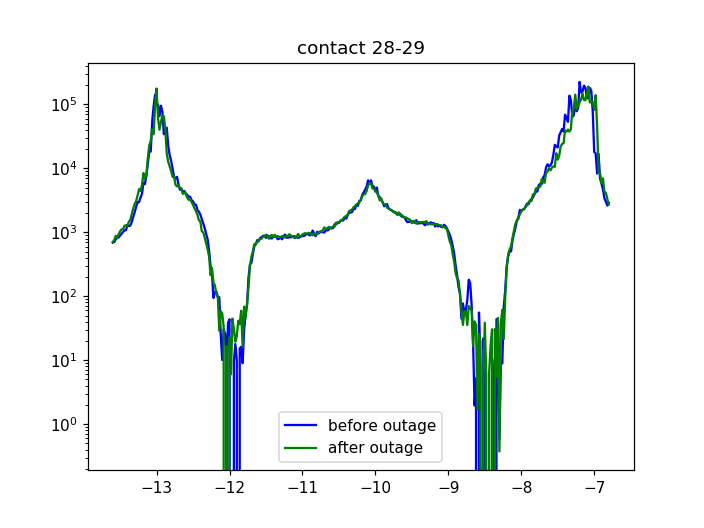

In [159]:
plt.figure()
plt.semilogy(data_other2.constant_D_orangeline_nsw_set[:], npd.Rxxfromdata(data_other2, 0.5e-9, 'lockin865'), label='before outage', color='blue')
plt.semilogy(data155.constant_D_orangeline_nsw_set[:], npd.Rxxfromdata(data155, 0.5e-9, 'lockin865'), label='after outage', color='green')
plt.title('contact 28-29')
plt.legend()

In [147]:
constant_D_redline_nsw(6)

In [148]:
constant_D_redline_nsw(6)
time.sleep(60)
bgnvals = np.linspace(6, -0.5, 326)
data156, plot156 = npd.single_param_sweep(constant_D_redline_nsw, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29_830_40-41_0.5nA_-0p8mT_redline_sweep', YParam=[lockin865.X, lockin830.X])
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-04 12:21:24
DataSet:
   location = 'data/2020-06-04/#003_M30_865_28-29_830_40-41_0.5nA_-0p8mT_redline_sweep_12-21-23'
   <Type>   | <array_id>                 | <array.name>           | <array.shape>
   Setpoint | constant_D_redline_nsw_set | constant_D_redline_nsw | (326,)
   Measured | lockin865_X                | X                      | (326,)
   Measured | lockin865_Y                | Y                      | (326,)
   Measured | lockin830_X                | X                      | (326,)
   Measured | lockin830_Y                | Y                      | (326,)
Finished at 2020-06-04 12:28:42


In [149]:
data_other3 = qc.load_data('data/2020-05-27/#001_M30_865_28-29_830_40-41_0.5nA_-0p8mT_redline_sweep_09-49-43')

<IPython.core.display.Javascript object>


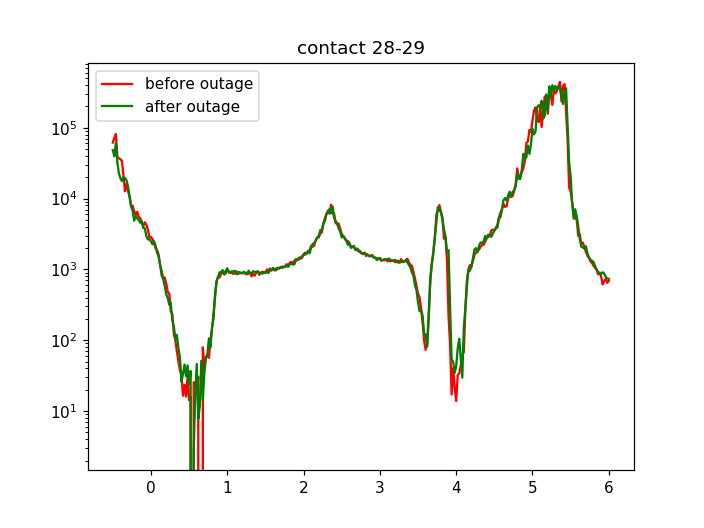

In [160]:
plt.figure()
plt.semilogy(data_other3.constant_D_redline_nsw_set[:], npd.Rxxfromdata(data_other3, 0.5e-9, 'lockin865'), label='before outage', color='red')
plt.semilogy(data156.constant_D_redline_nsw_set[:], npd.Rxxfromdata(data156, 0.5e-9, 'lockin865'), label='after outage', color='green')
plt.title('contact 28-29')
plt.legend()

# continue T dependence at D = 0

In [151]:
zeroDparam(-6.5)

In [152]:
# cable unplugged
zeroDparam(-6.5)
time.sleep(60)
bgnvals = np.linspace(-6.5, 0.6, 711)
data157, plot157 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29_830_40-41_0.5nA_-0p8mT_D0sweep_baseT', YParam=[lockin865.X, lockin830.X])
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-04 12:39:15
DataSet:
   location = 'data/2020-06-04/#004_M30_865_28-29_830_40-41_0.5nA_-0p8mT_D0sweep_baseT_12-39-14'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (711,)
   Measured | lockin865_X    | X            | (711,)
   Measured | lockin865_Y    | Y            | (711,)
   Measured | lockin830_X    | X            | (711,)
   Measured | lockin830_Y    | Y            | (711,)
Finished at 2020-06-04 12:55:10


In [161]:
triton.pid_setpoint(0.05)

In [162]:
triton.pid_range(3.16)

In [163]:
triton.pid_mode(1)

In [165]:
triton.pid_range(10)

In [166]:
zeroDparam(-6.5)
time.sleep(60)
Tvals = np.linspace(0.05, 1, 20)
bgnvals = np.linspace(-6.5, 0.6, 711)
data158, plot158 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, zeroDparam, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=-6.5, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweepto1K_D0_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-04 13:13:24
DataSet:
   location = 'data/2020-06-04/#006_M30_865_28-29_830_40-41_0p5nA_gateTsweepto1K_D0_0p5nA_13-13-21'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | zeroDparam_set          | zeroDparam   | (20, 711)
   Measured | lockin865_X             | X            | (20, 711)
   Measured | lockin865_Y             | Y            | (20, 711)
   Measured | lockin830_X             | X            | (20, 711)
   Measured | lockin830_Y             | Y            | (20, 711)
Finished at 2020-06-04 19:52:36


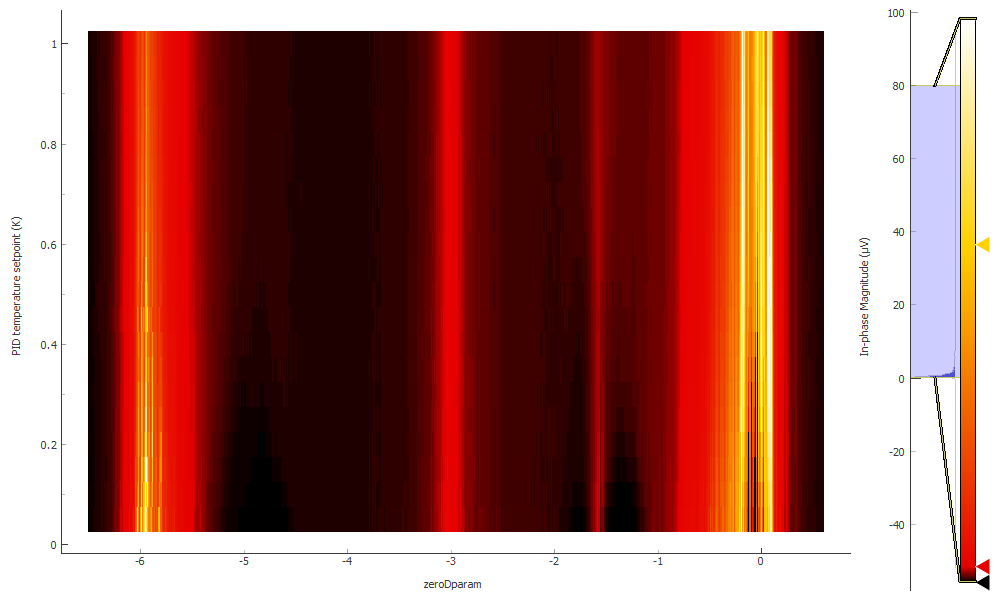

In [206]:
plot158[0]

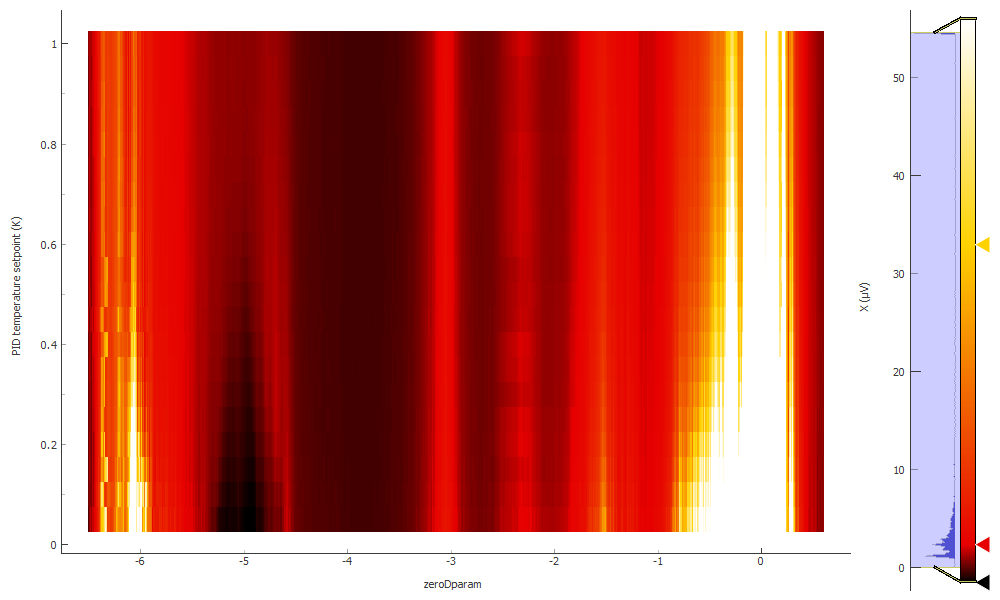

In [207]:
plot158[2]

In [167]:
triton.pid_range(31.6)

In [168]:
zeroDparam(-6.5)
time.sleep(60)
Tvals = np.linspace(1.1, 1.4, 4)
bgnvals = np.linspace(-6.5, 0.6, 711)
data159, plot159 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, zeroDparam, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=-6.5, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep1p1to1p4K_D0_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-04 19:54:08
DataSet:
   location = 'data/2020-06-04/#007_M30_865_28-29_830_40-41_0p5nA_gateTsweep1p1to1p4K_D0_0p5nA_19-54-05'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (4,)
   Setpoint | zeroDparam_set          | zeroDparam   | (4, 711)
   Measured | lockin865_X             | X            | (4, 711)
   Measured | lockin865_Y             | Y            | (4, 711)
   Measured | lockin830_X             | X            | (4, 711)
   Measured | lockin830_Y             | Y            | (4, 711)
Finished at 2020-06-04 21:13:59


In [169]:
triton.pid_range(100)

In [170]:
triton.pid_range(100)
time.sleep(10)

In [171]:
triton.pid_setpoint(1.5)

In [172]:
zeroDparam(-6.5)
time.sleep(60)
Tvals = np.linspace(1.5, 2, 6)
bgnvals = np.linspace(-6.5, 0.6, 711)
data160, plot160 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, zeroDparam, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=-6.5, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep1p5to2K_D0_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-04 21:15:42
DataSet:
   location = 'data/2020-06-04/#008_M30_865_28-29_830_40-41_0p5nA_gateTsweep1p5to2K_D0_0p5nA_21-15-39'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (6,)
   Setpoint | zeroDparam_set          | zeroDparam   | (6, 711)
   Measured | lockin865_X             | X            | (6, 711)
   Measured | lockin865_Y             | Y            | (6, 711)
   Measured | lockin830_X             | X            | (6, 711)
   Measured | lockin830_Y             | Y            | (6, 711)
Finished at 2020-06-04 23:15:19


In [173]:
triton.pid_setpoint(2.1)

In [174]:
zeroDparam(-6.5)
time.sleep(60)
Tvals = np.linspace(2.1, 10, 80)
bgnvals = np.linspace(-6.5, 0.6, 711)
data161, plot161 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, zeroDparam, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=180, SetDelay2=1.3, Param2_SetBetween=-6.5, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep2p1to10K_D0_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-04 23:33:01
DataSet:
   location = 'data/2020-06-04/#009_M30_865_28-29_830_40-41_0p5nA_gateTsweep2p1to10K_D0_0p5nA_23-32-58'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (80,)
   Setpoint | zeroDparam_set          | zeroDparam   | (80, 711)
   Measured | lockin865_X             | X            | (80, 711)
   Measured | lockin865_Y             | Y            | (80, 711)
   Measured | lockin830_X             | X            | (80, 711)
   Measured | lockin830_Y             | Y            | (80, 711)
Finished at 2020-06-06 02:09:11


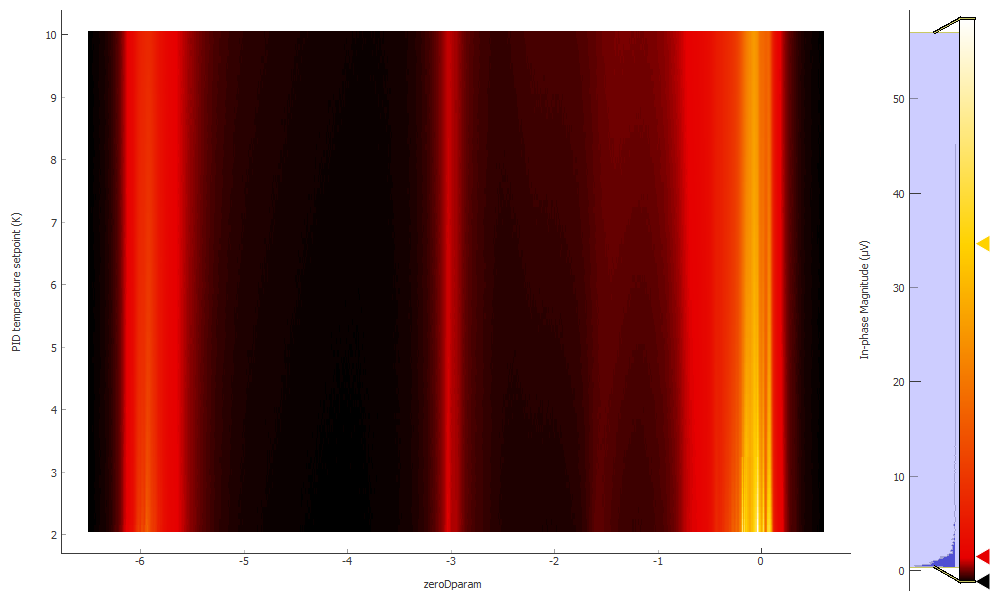

In [208]:
plot161[0]

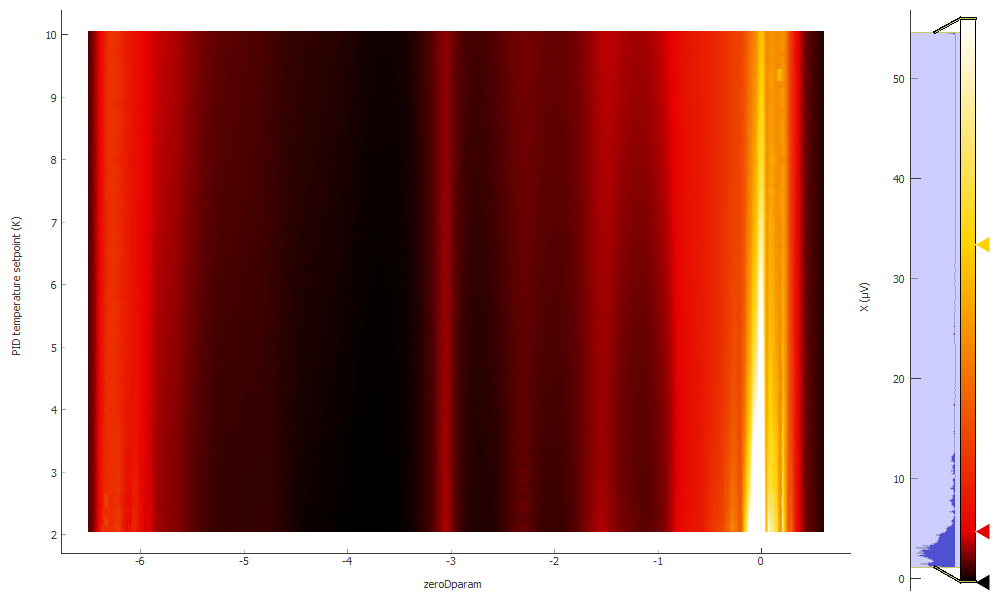

In [209]:
plot161[2]

In [175]:
triton.pid_setpoint(11)

In [176]:
zeroDparam(-6.5)
time.sleep(60)
Tvals = np.linspace(11, 30, 20)
bgnvals = np.linspace(-6.5, 0.6, 711)
data162, plot162 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, zeroDparam, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=240, SetDelay2=1.1, Param2_SetBetween=-6.5, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep11to30K_D0_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-06 02:10:44
DataSet:
   location = 'data/2020-06-06/#001_M30_865_28-29_830_40-41_0p5nA_gateTsweep11to30K_D0_0p5nA_02-10-41'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (20,)
   Setpoint | zeroDparam_set          | zeroDparam   | (20, 711)
   Measured | lockin865_X             | X            | (20, 711)
   Measured | lockin865_Y             | Y            | (20, 711)
   Measured | lockin830_X             | X            | (20, 711)
   Measured | lockin830_Y             | Y            | (20, 711)
Finished at 2020-06-06 08:21:54


In [177]:
triton.write('SET:DEV:V1:VALV:SIG:STATE:CLOSE')

In [178]:
time.sleep(60)

In [179]:
triton.pid_setpoint(31)

In [180]:
zeroDparam(-6.5)
time.sleep(60)
Tvals = np.linspace(31, 40, 10)
bgnvals = np.linspace(-6.5, 0.6, 711)
data163, plot163 = npd.twod_param_sweep(triton.pid_setpoint, Tvals, zeroDparam, bgnvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=420, SetDelay2=1.1, Param2_SetBetween=-6.5, DataName='M30_865_28-29_830_40-41_0p5nA_gateTsweep31to40K_D0_0p5nA')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-06 08:24:27
DataSet:
   location = 'data/2020-06-06/#002_M30_865_28-29_830_40-41_0p5nA_gateTsweep31to40K_D0_0p5nA_08-24-24'
   <Type>   | <array_id>              | <array.name> | <array.shape>
   Setpoint | triton_pid_setpoint_set | pid_setpoint | (10,)
   Setpoint | zeroDparam_set          | zeroDparam   | (10, 711)
   Measured | lockin865_X             | X            | (10, 711)
   Measured | lockin865_Y             | Y            | (10, 711)
   Measured | lockin830_X             | X            | (10, 711)
   Measured | lockin830_Y             | Y            | (10, 711)
Finished at 2020-06-06 12:00:18


In [181]:
triton.pid_mode(0)

In [272]:
triton.read_temps()

MC - on:  0.0289395 K
MC_cernox - on:  321.181 K
still - on:  0.849825 K
cold_plate - off:  0.0667477 K
magnet - off:  3.80367 K
PT2h - off:  3.20227 K
PT2p - off:  3.38735 K
PT1h - off:  46.4802 K
PT1p - off:  57.0621 K


# 28-29 40-41 WAL

In [273]:
zeroDparam(-6.5)

In [275]:
lockin865.amplitude(0.1)

In [276]:
# cable unplugged
zeroDparam(-6.5)
time.sleep(60)
bgnvals = np.linspace(-6.5, 0.6, 356)
data164, plot164 = npd.single_param_sweep(zeroDparam, bgnvals, 1.2, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_865_28-29_830_40-41_1nA_0T_D0sweep_baseT', YParam=[lockin865.X, lockin830.X])
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-06 18:16:12
DataSet:
   location = 'data/2020-06-06/#003_M30_865_28-29_830_40-41_1nA_0T_D0sweep_baseT_18-16-11'
   <Type>   | <array_id>     | <array.name> | <array.shape>
   Setpoint | zeroDparam_set | zeroDparam   | (356,)
   Measured | lockin865_X    | X            | (356,)
   Measured | lockin865_Y    | Y            | (356,)
   Measured | lockin830_X    | X            | (356,)
   Measured | lockin830_Y    | Y            | (356,)
Finished at 2020-06-06 18:24:10


<IPython.core.display.Javascript object>


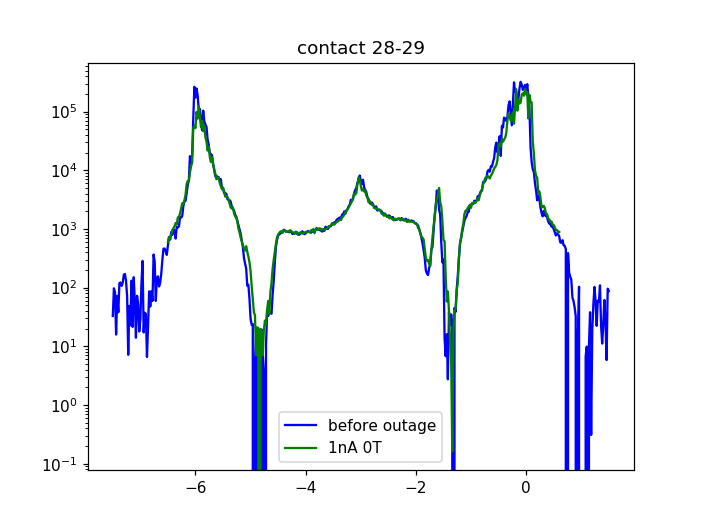

In [277]:
plt.figure()
plt.semilogy(data_other1.zeroDparam_set[:], npd.Rxxfromdata(data_other1, 0.5e-9, 'lockin865'), label='before outage', color='blue')
plt.semilogy(data164.zeroDparam_set[:], npd.Rxxfromdata(data164, 1e-9, 'lockin865'), label='1nA 0T', color='green')
plt.title('contact 28-29')
plt.legend()

<IPython.core.display.Javascript object>


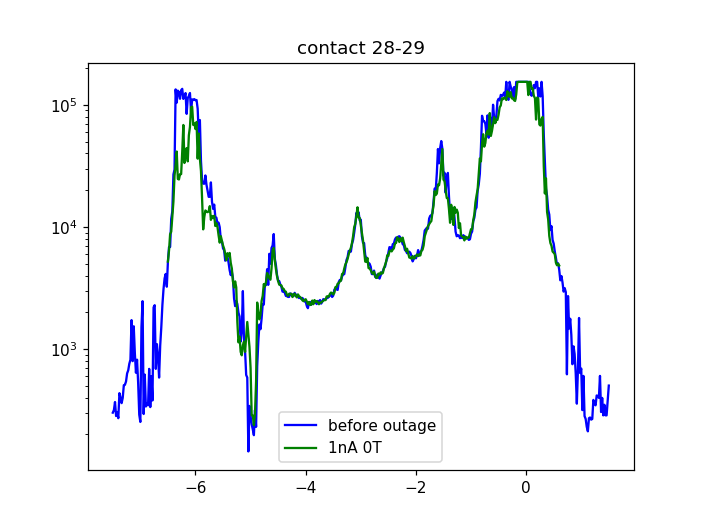

In [278]:
plt.figure()
plt.semilogy(data_other1.zeroDparam_set[:], npd.Rxxfromdata(data_other1, 0.5e-9, 'lockin830'), label='before outage', color='blue')
plt.semilogy(data164.zeroDparam_set[:], npd.Rxxfromdata(data164, 1e-9, 'lockin830'), label='1nA 0T', color='green')
plt.title('contact 28-29')
plt.legend()

In [279]:
zeroDparam(-4.5)

In [281]:
triton.magnet_sweeprate(0.1)

In [282]:
triton.field(-0.025)

Are you sure you want to use the magnet? [y/n]: y
Sweep time approximately 25.006 seconds


In [284]:
lockin865.time_constant(0.3)

In [286]:
lockin830.time_constant(0.3)

In [288]:
lockin865.amplitude(1)#10nA

In [289]:
lockin865.sensitivity()

5e-05

In [290]:
lockin830.sensitivity()

0.0002

In [291]:
triton.field(-0.02)

Sweep time approximately 13.036 seconds


In [292]:
for i in range(126):
    Vg = -4.5 + 0.02*i
    st = 'M30_865_28-29_830_40-41_baseT_WALfieldsw_D0_Vbg{:.2f}_10nA'.format(Vg)
    zeroDparam(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.02)
    time.sleep(10)
    triton.magnet_sweeprate(0.007)
    triton.field(0.02)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.02, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.036 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.102 seconds
Started at 2020-06-06 18:46:36
DataSet:
   location = 'data/2020-06-06/#004_M30_865_28-29_830_40-41_baseT_WALfieldsw_D0_Vbg-4.50_10nA_18-46-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-06 18:52:27
Please wait 34.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 352.102 seconds
Started at 2020-06-06 18:53:20
DataSet:
   location = 'data/2020-06-06/#005_M30_865_28-29_830_40-41_baseT_WALfieldsw_D0_Vbg-4.48_

In [293]:
srdc.volt(0)
srframe.volt_p1(0)

In [294]:
zeroDparam(-3.5)

In [299]:
triton.magnet_sweeprate(0.1)

In [304]:
triton.field()

-0.024975

In [307]:
lockin865.X()

1.1928885215e-05

In [308]:
for i in range(41): #D0 hole side fine scan
    Vg = -3.5 + 0.01*i
    st = 'M30_865_28-29_830_40-41_baseT_WALfieldsw_D0_Vbg{:.2f}_10nA'.format(Vg)
    zeroDparam(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.042 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.2080000000001 seconds
Started at 2020-06-07 10:49:28
DataSet:
   location = 'data/2020-06-07/#080_M30_865_28-29_830_40-41_baseT_WALfieldsw_D0_Vbg-3.50_10nA_10-49-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-07 10:59:33
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.606 seconds
Started at 2020-06-07 11:00:33
DataSet:
   location = 'data/2020-06-07/#081_M30_865_28-29_830_40-41_baseT_WALfieldsw_D0_V

In [309]:
zeroDparam(-2.9)

In [328]:
srdc.volt()

-0.59685

In [312]:
constant_D_redline_nsw(1.84)

In [313]:
srdc.volt()

-1.82131

In [314]:
zeroDparam(-2.9)

In [327]:
lockin865.X()

3.9307604311e-05

In [329]:
time.sleep(120)

In [330]:
for i in range(51): #D0 electron side fine scan
    Vg = -2.9 + 0.01*i
    st = 'M30_865_28-29_830_40-41_baseT_WALfieldsw_D0_Vbg{:.2f}_10nA'.format(Vg)
    zeroDparam(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.292 seconds
Started at 2020-06-07 18:31:28
DataSet:
   location = 'data/2020-06-07/#121_M30_865_28-29_830_40-41_baseT_WALfieldsw_D0_Vbg-2.90_10nA_18-31-27'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-07 18:41:33
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.9359999999999 seconds
Started at 2020-06-07 18:42:31
DataSet:
   location = 'data/2020-06-07/#122_M30_865_28-29_830_40-41_baseT_WALfieldsw_D0

In [331]:
constant_D_redline_nsw(1.84)

In [332]:
time.sleep(180)

In [333]:
for i in range(41): #redline hole side fine scan
    Vg = 1.84 + 0.01*i
    st = 'M30_865_28-29_830_40-41_baseT_WALfieldsw_redline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_redline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.0459999999999 seconds
Started at 2020-06-08 04:00:45
DataSet:
   location = 'data/2020-06-08/#022_M30_865_28-29_830_40-41_baseT_WALfieldsw_redline_Vbg1.84_10nA_04-00-44'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-08 04:10:51
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.784 seconds
Started at 2020-06-08 04:11:52
DataSet:
   location = 'data/2020-06-08/#023_M30_865_28-29_830_40-41_baseT_WALfields

In [334]:
constant_D_redline_nsw(2.44)

In [335]:
time.sleep(180)

In [1]:
for i in range(51): #redline electron side fine scan
    Vg = 2.44 + 0.01*i
    st = 'M30_865_28-29_830_40-41_baseT_WALfieldsw_redline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_redline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

NameError: name 'constant_D_redline_nsw' is not defined

In [337]:
constant_D_orangeline_nsw(-10.55)

In [338]:
time.sleep(180)

In [339]:
for i in range(41): #orangeline hole side fine scan
    Vg = -10.55 + 0.01*i
    st = 'M30_865_28-29_830_40-41_baseT_WALfieldsw_orangeline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_orangeline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.4440000000001 seconds
Started at 2020-06-08 21:09:15
DataSet:
   location = 'data/2020-06-08/#114_M30_865_28-29_830_40-41_baseT_WALfieldsw_orangeline_Vbg-10.55_10nA_21-09-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-08 21:19:22
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.36 seconds
Started at 2020-06-08 21:20:21
DataSet:
   location = 'data/2020-06-08/#115_M30_865_28-29_830_40-41_baseT_WALfiel

In [340]:
constant_D_orangeline_nsw(-9.95)

In [341]:
time.sleep(180)

In [342]:
for i in range(51): #orangeline electron side fine scan
    Vg = -9.95 + 0.01*i
    st = 'M30_865_28-29_830_40-41_baseT_WALfieldsw_orangeline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_orangeline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.5219999999999 seconds
Started at 2020-06-09 04:47:30
DataSet:
   location = 'data/2020-06-09/#026_M30_865_28-29_830_40-41_baseT_WALfieldsw_orangeline_Vbg-9.95_10nA_04-47-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-09 04:57:36
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.276 seconds
Started at 2020-06-09 04:58:36
DataSet:
   location = 'data/2020-06-09/#027_M30_865_28-29_830_40-41_baseT_WALfiel

KeyboardInterrupt: 

In [344]:
triton.magnet_sweeprate(0.1)

In [345]:
triton.field(-0.025)

Sweep time approximately 25.006 seconds


magnet error

In [346]:
constant_D_orangeline_nsw(-9.6)

In [347]:
for i in range(16): #orangeline electron side fine scan
    Vg = -9.6 + 0.01*i
    st = 'M30_865_28-29_830_40-41_baseT_WALfieldsw_orangeline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_orangeline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.036 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.124 seconds
Started at 2020-06-09 14:17:30
DataSet:
   location = 'data/2020-06-09/#069_M30_865_28-29_830_40-41_baseT_WALfieldsw_orangeline_Vbg-9.60_10nA_14-17-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-09 14:27:34
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-06-09 14:28:35
DataSet:
   location = 'data/2020-06-09/#070_M30_865_28-29_830_40-41_baseT_WALfi

# 28-29 40-41 UCF

In [348]:
zeroDparam(-3.5)

In [349]:
triton.field(0.03)

Sweep time approximately 69.97 seconds


In [350]:
time.sleep(180)

In [351]:
for i in range(21): #D0 hole side fine scan
    Vg = -3.5 + 0.02*i
    st = 'M30_865_28-29_830_40-41_baseT_UCFfieldsw_D0_Vbg{:.2f}_10nA'.format(Vg)
    zeroDparam(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(0.03)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.1)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.1, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.784 seconds
Started at 2020-06-09 17:25:30
DataSet:
   location = 'data/2020-06-09/#085_M30_865_28-29_830_40-41_baseT_UCFfieldsw_D0_Vbg-3.50_10nA_17-25-29'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-09 17:39:37
Please wait 52.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.946 seconds
Started at 2020-06-09 17:40:50
DataSet:
   location = 'data/2020-06-09/#086_M30_865_28-29_830_40-41_baseT_UCFfieldsw_D0_Vbg-3.48_10nA

In [352]:
zeroDparam(-2.9)

In [353]:
time.sleep(180)

In [354]:
for i in range(26): #D0 electron side fine scan
    Vg = -2.9 + 0.02*i
    st = 'M30_865_28-29_830_40-41_baseT_UCFfieldsw_D0_Vbg{:.2f}_10nA'.format(Vg)
    zeroDparam(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(0.03)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.1)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.1, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 52.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.946 seconds
Started at 2020-06-09 22:50:20
DataSet:
   location = 'data/2020-06-09/#106_M30_865_28-29_830_40-41_baseT_UCFfieldsw_D0_Vbg-2.90_10nA_22-50-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-09 23:04:27
Please wait 52.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.6999999999999 seconds
Started at 2020-06-09 23:05:39
DataSet:
   location = 'data/2020-06-09/#107_M30_865_28-29_830_40-41_baseT_UCFfieldsw_D0_Vbg

In [355]:
constant_D_redline_nsw(1.84)

In [356]:
time.sleep(180)

In [357]:
for i in range(21): #redline hole side fine scan
    Vg = 1.84 + 0.02*i
    st = 'M30_865_28-29_830_40-41_baseT_UCFfieldsw_redline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_redline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(0.03)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.1)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.1, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 52.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 850.192 seconds
Started at 2020-06-10 05:32:00
DataSet:
   location = 'data/2020-06-10/#022_M30_865_28-29_830_40-41_baseT_UCFfieldsw_redline_Vbg1.84_10nA_05-31-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-10 05:46:08
Please wait 52.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.784 seconds
Started at 2020-06-10 05:47:20
DataSet:
   location = 'data/2020-06-10/#023_M30_865_28-29_830_40-41_baseT_UCFfieldsw_redline_Vb

In [358]:
constant_D_redline_nsw(2.44)

In [359]:
time.sleep(180)

In [360]:
for i in range(26): #redline electron side fine scan
    Vg = 2.44 + 0.02*i
    st = 'M30_865_28-29_830_40-41_baseT_UCFfieldsw_redline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_redline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(0.03)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.1)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.1, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 52.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.862 seconds
Started at 2020-06-10 10:56:47
DataSet:
   location = 'data/2020-06-10/#043_M30_865_28-29_830_40-41_baseT_UCFfieldsw_redline_Vbg2.44_10nA_10-56-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-10 11:10:54
Please wait 52.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.946 seconds
Started at 2020-06-10 11:12:06
DataSet:
   location = 'data/2020-06-10/#044_M30_865_28-29_830_40-41_baseT_UCFfieldsw_redline_

In [361]:
constant_D_orangeline_nsw(-9.95)

In [362]:
time.sleep(180)

In [363]:
constant_D_orangeline_nsw(-10.55)

In [364]:
time.sleep(180)

In [365]:
for i in range(21): #orangeline hole side fine scan
    Vg = -10.55 + 0.02*i
    st = 'M30_865_28-29_830_40-41_baseT_UCFfieldsw_orangeline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_orangeline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(0.03)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.1)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.1, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 52.024 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.946 seconds
Started at 2020-06-10 17:41:46
DataSet:
   location = 'data/2020-06-10/#069_M30_865_28-29_830_40-41_baseT_UCFfieldsw_orangeline_Vbg-10.55_10nA_17-41-45'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-10 17:55:52
Please wait 52.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.946 seconds
Started at 2020-06-10 17:57:05
DataSet:
   location = 'data/2020-06-10/#070_M30_865_28-29_830_40-41_baseT_UCFfieldsw_ora

KeyboardInterrupt: 

magnet error again

In [366]:
constant_D_orangeline_nsw(-10.49)

In [367]:
for i in range(18): #orangeline hole side fine scan
    Vg = -10.49 + 0.02*i
    st = 'M30_865_28-29_830_40-41_baseT_UCFfieldsw_orangeline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_orangeline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(0.03)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.1)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.1, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 850.0300000000001 seconds
Started at 2020-06-10 21:46:23
DataSet:
   location = 'data/2020-06-10/#074_M30_865_28-29_830_40-41_baseT_UCFfieldsw_orangeline_Vbg-10.49_10nA_21-46-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-10 22:00:30
Please wait 52.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.862 seconds
Started at 2020-06-10 22:01:41
DataSet:
   location = 'data/2020-06-10/#075_M30_865_28-29_830_40-41_baseT_UCFfie

KeyboardInterrupt: 

In [14]:
triton.magnet_sweeprate(0.1)

In [15]:
triton.field(0.03)

Sweep time approximately 10.0 seconds


In [13]:
constant_D_orangeline_nsw(-10.41)

In [16]:
for i in range(14): #orangeline hole side fine scan
    Vg = -10.41 + 0.02*i
    st = 'M30_865_28-29_830_40-41_baseT_UCFfieldsw_orangeline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_orangeline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(0.03)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.1)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.1, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 850.0300000000001 seconds
Started at 2020-06-10 23:37:51
DataSet:
   location = 'data/2020-06-10/#080_M30_865_28-29_830_40-41_baseT_UCFfieldsw_orangeline_Vbg-10.41_10nA_23-37-50'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-10 23:51:59
Please wait 52.018 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 850.0300000000001 seconds
Started at 2020-06-10 23:53:10
DataSet:
   location = 'data/2020-06-10/#081_M30_865_28-29_830_40-41_

In [17]:
constant_D_orangeline_nsw(-9.95)

In [18]:
time.sleep(180)

In [19]:
for i in range(26): #orangeline electron side fine scan
    Vg = -9.95 + 0.02*i
    st = 'M30_865_28-29_830_40-41_baseT_UCFfieldsw_orangeline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_orangeline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(0.03)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.1)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.1, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 52.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.862 seconds
Started at 2020-06-11 03:15:21
DataSet:
   location = 'data/2020-06-11/#013_M30_865_28-29_830_40-41_baseT_UCFfieldsw_orangeline_Vbg-9.95_10nA_03-15-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-11 03:29:29
Please wait 52.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.784 seconds
Started at 2020-06-11 03:30:41
DataSet:
   location = 'data/2020-06-11/#014_M30_865_28-29_830_40-41_baseT_UCFfieldsw_oran

  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel\kernelapp.py", line 505, in start
    self.io_loop.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\tornado\platform\asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 438, in run_forever
    self._run_once()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 1451, in _ru

DataSet:
   location = 'data/2020-06-11/#020_M30_865_28-29_830_40-41_baseT_UCFfieldsw_orangeline_Vbg-9.81_10nA_05-02-39'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-11 05:16:49
Please wait 52.024 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 849.784 seconds
Started at 2020-06-11 05:18:00
DataSet:
   location = 'data/2020-06-11/#021_M30_865_28-29_830_40-41_baseT_UCFfieldsw_orangeline_Vbg-9.79_10nA_05-17-59'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | ti

In [20]:
srdc.volt(0)
srframe.volt_p1(0)

# 28-29 40-41 higher T WAL and background

In [26]:
triton.pid_range(10)

In [27]:
triton.pid_setpoint(0.3)

In [25]:
triton.pid_mode(1)

In [28]:
zeroDparam(-3.5)

In [29]:
for i in range(21): #D0 hole side fine scan
    Vg = -3.5 + 0.02*i
    st = 'M30_865_28-29_830_40-41_300mK_WALfieldsw_D0_Vbg{:.2f}_10nA'.format(Vg)
    zeroDparam(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 10.03 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.784 seconds
Started at 2020-06-11 10:18:40
DataSet:
   location = 'data/2020-06-11/#039_M30_865_28-29_830_40-41_300mK_WALfieldsw_D0_Vbg-3.50_10nA_10-18-39'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-11 10:28:46
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 611.3439999999999 seconds
Started at 2020-06-11 10:29:46
DataSet:
   location = 'data/2020-06-11/#040_M30_865_28-29_830_40-41_300mK_WALfieldsw_D0_

In [30]:
zeroDparam(-2.9)

In [31]:
time.sleep(180)

In [32]:
for i in range(26): #D0 electron side fine scan
    Vg = -2.9 + 0.02*i
    st = 'M30_865_28-29_830_40-41_300mK_WALfieldsw_D0_Vbg{:.2f}_10nA'.format(Vg)
    zeroDparam(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.784 seconds
Started at 2020-06-11 14:24:34
DataSet:
   location = 'data/2020-06-11/#060_M30_865_28-29_830_40-41_300mK_WALfieldsw_D0_Vbg-2.90_10nA_14-24-33'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-11 14:34:40
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6999999999999 seconds
Started at 2020-06-11 14:35:39
DataSet:
   location = 'data/2020-06-11/#061_M30_865_28-29_830_40-41_300mK_WALfieldsw_D0_V

In [33]:
constant_D_redline_nsw(1.84)

In [34]:
time.sleep(180)

In [35]:
for i in range(21): #redline hole side fine scan
    Vg = 1.84 + 0.02*i
    st = 'M30_865_28-29_830_40-41_300mK_WALfieldsw_redline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_redline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6999999999999 seconds
Started at 2020-06-11 19:16:17
DataSet:
   location = 'data/2020-06-11/#086_M30_865_28-29_830_40-41_300mK_WALfieldsw_redline_Vbg1.84_10nA_19-16-16'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-11 19:26:21
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.946 seconds
Started at 2020-06-11 19:27:22
DataSet:
   location = 'data/2020-06-11/#087_M30_865_28-29_830_40-41_300mK_WALfieldsw_

In [36]:
constant_D_redline_nsw(2.44)

In [37]:
time.sleep(180)

In [38]:
for i in range(26): #redline electron side fine scan
    Vg = 2.44 + 0.02*i
    st = 'M30_865_28-29_830_40-41_300mK_WALfieldsw_redline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_redline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 611.098 seconds
Started at 2020-06-11 23:12:19
DataSet:
   location = 'data/2020-06-11/#107_M30_865_28-29_830_40-41_300mK_WALfieldsw_redline_Vbg2.44_10nA_23-12-18'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-11 23:22:26
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-06-11 23:23:27
DataSet:
   location = 'data/2020-06-11/#108_M30_865_28-29_830_40-41_300mK_WALfieldsw_

In [39]:
constant_D_orangeline_nsw(-10.55)

In [40]:
time.sleep(180)

In [41]:
for i in range(21): #orangeline hole side fine scan
    Vg = -10.55 + 0.02*i
    st = 'M30_865_28-29_830_40-41_300mK_WALfieldsw_orangeline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_orangeline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.198 seconds
Started at 2020-06-12 04:04:22
DataSet:
   location = 'data/2020-06-12/#022_M30_865_28-29_830_40-41_300mK_WALfieldsw_orangeline_Vbg-10.55_10nA_04-04-22'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-12 04:14:27
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6220000000001 seconds
Started at 2020-06-12 04:15:27
DataSet:
   location = 'data/2020-06-12/#023_M30_865_28-29_830_40-41_300mK_WALfield

In [42]:
constant_D_orangeline_nsw(-9.95)

In [43]:
time.sleep(180)

In [44]:
for i in range(26): #orangeline electron side fine scan
    Vg = -9.95 + 0.02*i
    st = 'M30_865_28-29_830_40-41_300mK_WALfieldsw_orangeline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_orangeline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.0300000000001 seconds
Started at 2020-06-12 08:00:32
DataSet:
   location = 'data/2020-06-12/#043_M30_865_28-29_830_40-41_300mK_WALfieldsw_orangeline_Vbg-9.95_10nA_08-00-31'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-12 08:10:39
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.784 seconds
Started at 2020-06-12 08:11:39
DataSet:
   location = 'data/2020-06-12/#044_M30_865_28-29_830_40-41_300mK_WALfiel

In [46]:
triton.pid_setpoint(0.6)

In [47]:
time.sleep(300)

In [48]:
zeroDparam(-3.5)

In [49]:
time.sleep(180)

In [50]:
for i in range(21): #D0 hole side fine scan
    Vg = -3.5 + 0.02*i
    st = 'M30_865_28-29_830_40-41_600mK_WALfieldsw_D0_Vbg{:.2f}_10nA'.format(Vg)
    zeroDparam(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-06-12 13:40:20
DataSet:
   location = 'data/2020-06-12/#069_M30_865_28-29_830_40-41_600mK_WALfieldsw_D0_Vbg-3.50_10nA_13-40-19'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-12 13:50:26
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.8520000000001 seconds
Started at 2020-06-12 13:51:28
DataSet:
   location = 'data/2020-06-12/#070_M30_865_28-29_830_40-41_600mK_WALfi

  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel\kernelapp.py", line 505, in start
    self.io_loop.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\tornado\platform\asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 438, in run_forever
    self._run_once()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 1451, in _ru

DataSet:
   location = 'data/2020-06-12/#087_M30_865_28-29_830_40-41_600mK_WALfieldsw_D0_Vbg-3.14_10nA_17-00-14'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-12 17:10:21
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-06-12 17:11:21
DataSet:
   location = 'data/2020-06-12/#088_M30_865_28-29_830_40-41_600mK_WALfieldsw_D0_Vbg-3.12_10nA_17-11-21'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,

In [51]:
zeroDparam(-2.9)

In [52]:
time.sleep(180)

In [53]:
for i in range(26): #D0 electron side fine scan
    Vg = -2.9 + 0.02*i
    st = 'M30_865_28-29_830_40-41_600mK_WALfieldsw_D0_Vbg{:.2f}_10nA'.format(Vg)
    zeroDparam(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.454 seconds
Started at 2020-06-12 17:36:33
DataSet:
   location = 'data/2020-06-12/#090_M30_865_28-29_830_40-41_600mK_WALfieldsw_D0_Vbg-2.90_10nA_17-36-32'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-12 17:46:39
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.4440000000001 seconds
Started at 2020-06-12 17:47:39
DataSet:
   location = 'data/2020-06-12/#091_M30_865_28-29_830_40-41_600mK_WALfieldsw_D0

In [54]:
constant_D_redline_nsw(1.84)

In [55]:
time.sleep(180)

In [56]:
for i in range(21): #redline hole side fine scan
    Vg = 1.84 + 0.02*i
    st = 'M30_865_28-29_830_40-41_600mK_WALfieldsw_redline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_redline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6220000000001 seconds
Started at 2020-06-12 22:28:19
DataSet:
   location = 'data/2020-06-12/#116_M30_865_28-29_830_40-41_600mK_WALfieldsw_redline_Vbg1.84_10nA_22-28-18'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-12 22:38:25
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.454 seconds
Started at 2020-06-12 22:39:26
DataSet:
   location = 'data/2020-06-12/#117_M30_865_28-29_830_40-41_600mK_WALfieldsw_

In [57]:
constant_D_redline_nsw(2.44)

In [58]:
time.sleep(180)

In [59]:
for i in range(26): #redline electron side fine scan
    Vg = 2.44 + 0.02*i
    st = 'M30_865_28-29_830_40-41_600mK_WALfieldsw_redline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_redline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6999999999999 seconds
Started at 2020-06-13 02:24:35
DataSet:
   location = 'data/2020-06-13/#013_M30_865_28-29_830_40-41_600mK_WALfieldsw_redline_Vbg2.44_10nA_02-24-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-13 02:34:41
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.768 seconds
Started at 2020-06-13 02:35:40
DataSet:
   location = 'data/2020-06-13/#014_M30_865_28-29_830_40-41_600mK_WALfieldsw_

In [60]:
constant_D_orangeline_nsw(-10.55)

In [61]:
time.sleep(180)

In [62]:
for i in range(21): #orangeline hole side fine scan
    Vg = -10.55 + 0.02*i
    st = 'M30_865_28-29_830_40-41_600mK_WALfieldsw_orangeline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_orangeline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.6899999999999 seconds
Started at 2020-06-13 07:16:44
DataSet:
   location = 'data/2020-06-13/#039_M30_865_28-29_830_40-41_600mK_WALfieldsw_orangeline_Vbg-10.55_10nA_07-16-43'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-13 07:26:49
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 611.098 seconds
Started at 2020-06-13 07:27:49
DataSet:
   location = 'data/2020-06-13/#040_M30_865_28-29_830_40-41_600mK_WALfie

In [63]:
constant_D_orangeline_nsw(-9.95)

In [64]:
time.sleep(180)

In [65]:
for i in range(26): #orangeline electron side fine scan
    Vg = -9.95 + 0.02*i
    st = 'M30_865_28-29_830_40-41_600mK_WALfieldsw_orangeline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_orangeline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6220000000001 seconds
Started at 2020-06-13 11:12:48
DataSet:
   location = 'data/2020-06-13/#060_M30_865_28-29_830_40-41_600mK_WALfieldsw_orangeline_Vbg-9.95_10nA_11-12-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-13 11:22:54
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.8679999999999 seconds
Started at 2020-06-13 11:23:55
DataSet:
   location = 'data/2020-06-13/#061_M30_865_28-29_830_40-41_6

In [66]:
zeroDparam(-3.5)

In [74]:
triton.pid_setpoint(3)

In [68]:
triton.pid_range(100)

In [ ]:
for i in range(41): #D0 hole side fine scan
    Vg = -3.5 + 0.01*i
    st = 'M30_865_28-29_830_40-41_3K_WALfieldsw_D0_Vbg{:.2f}_10nA'.format(Vg)
    zeroDparam(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-06-13 16:41:24
DataSet:
   location = 'data/2020-06-13/#086_M30_865_28-29_830_40-41_3K_WALfieldsw_D0_Vbg-3.50_10nA_16-41-23'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-13 16:51:30
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.5219999999999 seconds
Started at 2020-06-13 16:52:31
DataSet:
   location = 'data/2020-06-13/#087_M30_865_28-29_830_40-41_3K_WALfieldsw_D0_Vbg-3.49_

In [14]:
zeroDparam(-3.1)

In [16]:
srdc.volt()

-0.63801

In [19]:
for i in range(1): #D0 hole side fine scan
    Vg = -3.1 + 0.01*i
    st = 'M30_865_28-29_830_40-41_3K_WALfieldsw_D0_Vbg{:.2f}_10nA'.format(Vg)
    zeroDparam(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Are you sure you want to use the magnet? [y/n]: y
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.6999999999999 seconds
Started at 2020-06-14 00:36:45
DataSet:
   location = 'data/2020-06-14/#002_M30_865_28-29_830_40-41_3K_WALfieldsw_D0_Vbg-3.10_10nA_00-36-41'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-14 00:46:49


In [20]:
zeroDparam(-2.9)

In [21]:
time.sleep(180)

In [22]:
for i in range(51): #D0 electron side fine scan
    Vg = -2.9 + 0.01*i
    st = 'M30_865_28-29_830_40-41_3K_WALfieldsw_D0_Vbg{:.2f}_10nA'.format(Vg)
    zeroDparam(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.9359999999999 seconds
Started at 2020-06-14 00:50:48
DataSet:
   location = 'data/2020-06-14/#003_M30_865_28-29_830_40-41_3K_WALfieldsw_D0_Vbg-2.90_10nA_00-50-47'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-14 01:00:53
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.5219999999999 seconds
Started at 2020-06-14 01:01:54
DataSet:
   location = 'data/2020-06-14/#004_M30_865_28-29_830_40-41_3K_WALfieldsw_D0

In [23]:
constant_D_redline_nsw(1.84)

In [24]:
time.sleep(180)

In [25]:
for i in range(41): #redline hole side fine scan
    Vg = 1.84 + 0.01*i
    st = 'M30_865_28-29_830_40-41_3K_WALfieldsw_redline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_redline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-06-14 10:20:01
DataSet:
   location = 'data/2020-06-14/#054_M30_865_28-29_830_40-41_3K_WALfieldsw_redline_Vbg1.84_10nA_10-20-00'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-14 10:30:06
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-06-14 10:31:07
DataSet:
   location = 'data/2020-06-14/#055_M30_865_28-29_830_40-41_3K_WALfieldsw_redline_Vbg1.85_

In [26]:
constant_D_redline_nsw(2.44)

In [27]:
time.sleep(180)

In [28]:
for i in range(51): #redline electron side fine scan
    Vg = 2.44 + 0.01*i
    st = 'M30_865_28-29_830_40-41_3K_WALfieldsw_redline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_redline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.538 seconds
Started at 2020-06-14 17:58:18
DataSet:
   location = 'data/2020-06-14/#095_M30_865_28-29_830_40-41_3K_WALfieldsw_redline_Vbg2.44_10nA_17-58-17'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-14 18:08:23
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.454 seconds
Started at 2020-06-14 18:09:24
DataSet:
   location = 'data/2020-06-14/#096_M30_865_28-29_830_40-41_3K_WALfieldsw_redline_Vbg2.45_

  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\ipykernel\kernelapp.py", line 505, in start
    self.io_loop.start()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\site-packages\tornado\platform\asyncio.py", line 132, in start
    self.asyncio_loop.run_forever()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 438, in run_forever
    self._run_once()
  File "C:\Users\NPLAB\Anaconda3\envs\qcodes\lib\asyncio\base_events.py", line 1451, in _ru

DataSet:
   location = 'data/2020-06-14/#107_M30_865_28-29_830_40-41_3K_WALfieldsw_redline_Vbg2.56_10nA_20-11-30'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-14 20:21:55


TypeError: 'Request' object is not callable

In [31]:
constant_D_redline_nsw(2.56)

In [32]:
for i in range(39): #redline electron side fine scan
    Vg = 2.56 + 0.01*i
    st = 'M30_865_28-29_830_40-41_3K_WALfieldsw_redline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_redline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.9359999999999 seconds
Started at 2020-06-14 20:30:36
DataSet:
   location = 'data/2020-06-14/#108_M30_865_28-29_830_40-41_3K_WALfieldsw_redline_Vbg2.56_10nA_20-30-35'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-14 20:40:41
Please wait 40.006 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.946 seconds
Started at 2020-06-14 20:41:41
DataSet:
   location = 'data/2020-06-14/#109_M30_865_28-29_830_40-41_3K_WALfieldsw_redlin

In [33]:
constant_D_orangeline_nsw(-10.55)

In [34]:
time.sleep(180)

In [35]:
for i in range(41): #orangeline hole side fine scan
    Vg = -10.55 + 0.01*i
    st = 'M30_865_28-29_830_40-41_3K_WALfieldsw_orangeline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_orangeline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 609.124 seconds
Started at 2020-06-15 03:46:53
DataSet:
   location = 'data/2020-06-15/#021_M30_865_28-29_830_40-41_3K_WALfieldsw_orangeline_Vbg-10.55_10nA_03-46-52'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-15 03:56:59
Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.606 seconds
Started at 2020-06-15 03:57:59
DataSet:
   location = 'data/2020-06-15/#022_M30_865_28-29_830_40-41_3K_WALfieldsw_orangeline_

In [36]:
constant_D_orangeline_nsw(-9.95)

In [37]:
time.sleep(180)

In [38]:
for i in range(51): #orangeline electron side fine scan
    Vg = -9.95 + 0.01*i
    st = 'M30_865_28-29_830_40-41_3K_WALfieldsw_orangeline_Vbg{:.2f}_10nA'.format(Vg)
    constant_D_orangeline_nsw(Vg)
    triton.magnet_sweeprate(0.1)
    triton.field_set_stable(-0.025)
    time.sleep(10)
    triton.magnet_sweeprate(0.005)
    triton.field(0.025)
    data, plot = npd.data_log(2, triton.field, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, minutes=30, breakif=npd.breakat(triton.field, 0.025, 0.001, 12), DataName=st, XParam=triton.field, YParam=[lockin865.X, lockin830.X], save_plots=False)

Please wait 40.0 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 611.2660000000001 seconds
Started at 2020-06-15 11:24:55
DataSet:
   location = 'data/2020-06-15/#062_M30_865_28-29_830_40-41_3K_WALfieldsw_orangeline_Vbg-9.95_10nA_11-24-54'
   <Type>   | <array_id>   | <array.name> | <array.shape>
   Setpoint | count_set    | count        | (900,)
   Measured | time0        | time0        | (900,)
   Measured | triton_field | field        | (900,)
   Measured | lockin865_X  | X            | (900,)
   Measured | lockin865_Y  | Y            | (900,)
   Measured | lockin830_X  | X            | (900,)
   Measured | lockin830_Y  | Y            | (900,)
Finished at 2020-06-15 11:35:01
Please wait 40.012 seconds for the field sweep, plus the time required for operating the switch...
Sweep time approximately 610.606 seconds
Started at 2020-06-15 11:36:00
DataSet:
   location = 'data/2020-06-15/#063_M30_865_28-29_830_40-41_3K_WALfieldsw_or

In [39]:
srdc.volt(0)
srframe.volt_p1(0)

In [40]:
lockin865.amplitude(0.05)

In [41]:
triton.field(0)

Sweep time approximately 309.946 seconds


In [42]:
triton.pid_mode(0)

In [43]:
triton.read_pressures()

P1:  32.745
P2:  1055.55
P3:  0.184
P4:  6.0
P5:  188.345
POVC:  0.0003


In [50]:
triton.read_temps()

MC - on:  0.0298565 K
MC_cernox - on:  321.181 K
still - on:  0.913126 K
cold_plate - off:  0.0667477 K
magnet - off:  3.77952 K
PT2h - off:  3.20227 K
PT2p - off:  3.38735 K
PT1h - off:  46.4802 K
PT1p - off:  57.0621 K


# higher T 2D gate sweep

In [54]:
triton.pid_range(10)

In [61]:
triton.pid_setpoint(1)

In [53]:
triton.pid_mode(1)

In [62]:
bgvals = np.linspace(-11, 6, 273)
tgvals = np.linspace(-1.7, 1.5, 193)
srframe.volt_p1(-11)
srdc.volt(-1.7)
time.sleep(30)
data165, plot165 = npd.twod_param_sweep(srdc.volt, tgvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=25, SetDelay2=1.1, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nA_2dgatesweep_1K')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-15 22:25:53
DataSet:
   location = 'data/2020-06-15/#113_M30_865_29-28__830_40-41_0p5nA_2dgatesweep_1K_22-25-50'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srdc_volt_set       | volt         | (193,)
   Setpoint | srframe_volt_p1_set | volt_p1      | (193, 273)
   Measured | lockin865_X         | X            | (193, 273)
   Measured | lockin865_Y         | Y            | (193, 273)
   Measured | lockin830_X         | X            | (193, 273)
   Measured | lockin830_Y         | Y            | (193, 273)
Finished at 2020-06-16 19:11:02


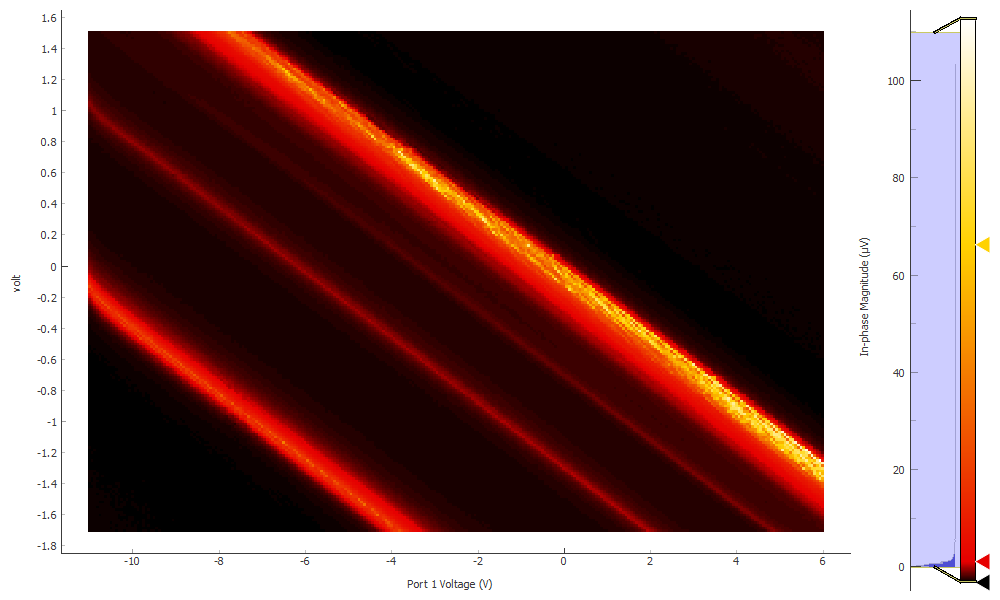

In [87]:
plot165[0]

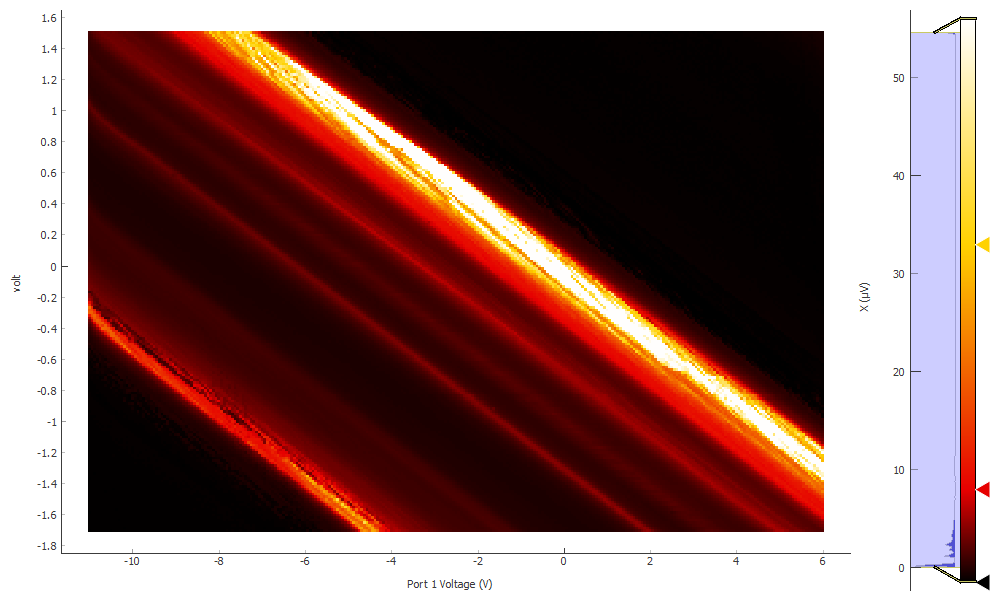

In [88]:
plot165[2]

In [63]:
bgvals = np.linspace(-6, 7, 209)
tgvals = np.linspace(-2.2, -1.7, 31)
srframe.volt_p1(-6)
srdc.volt(-2.2)
time.sleep(30)
data166, plot166 = npd.twod_param_sweep(srdc.volt, tgvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=25, SetDelay2=1.1, Param2_SetBetween=0, DataName='M30_865_29-28__830_40-41_0p5nA_2dgatesweep_1K')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-16 19:11:52
DataSet:
   location = 'data/2020-06-16/#001_M30_865_29-28__830_40-41_0p5nA_2dgatesweep_1K_19-11-49'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srdc_volt_set       | volt         | (31,)
   Setpoint | srframe_volt_p1_set | volt_p1      | (31, 209)
   Measured | lockin865_X         | X            | (31, 209)
   Measured | lockin865_Y         | Y            | (31, 209)
   Measured | lockin830_X         | X            | (31, 209)
   Measured | lockin830_Y         | Y            | (31, 209)
Finished at 2020-06-16 21:47:28


In [64]:
triton.pid_mode(0)

In [86]:
triton.read_temps()

MC - on:  0.0507681 K
MC_cernox - off:  321.181 K
still - off:  0.88358 K
cold_plate - off:  0.0667477 K
magnet - off:  3.77952 K
PT2h - off:  3.20227 K
PT2p - off:  3.38735 K
PT1h - off:  46.4802 K
PT1p - off:  57.0621 K


# other contacts

In [89]:
srframe.volt_p1(-14)
time.sleep(25)
bgvals = np.linspace(-14, 4, 361)
data167, plot167 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_38-39__830_34-33_0p5nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-06-16 22:43:35
DataSet:
   location = 'data/2020-06-16/#002_M30_baseT_865_38-39__830_34-33_0p5nA_backgate_22-43-35'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (361,)
   Measured | lockin865_X         | X            | (361,)
   Measured | lockin865_Y         | Y            | (361,)
   Measured | lockin830_X         | X            | (361,)
   Measured | lockin830_Y         | Y            | (361,)
Finished at 2020-06-16 22:51:05


<IPython.core.display.Javascript object>


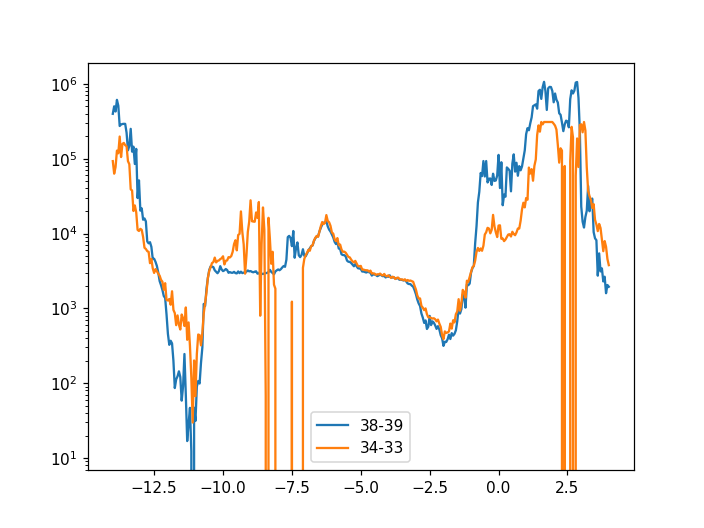

In [91]:
plt.figure()
plt.semilogy(data167.srframe_volt_p1_set, npd.Rxxfromdata(data167, 0.5e-9, 'lockin865'), label='38-39')
plt.semilogy(data167.srframe_volt_p1_set, npd.Rxxfromdata(data167, 0.5e-9, 'lockin830'), label='34-33')

plt.legend()

In [92]:
srframe.volt_p1(-14)
time.sleep(25)
bgvals = np.linspace(-14, 4, 361)
data168, plot168 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_39-40__830_33-32_0p5nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-06-16 22:56:38
DataSet:
   location = 'data/2020-06-16/#003_M30_baseT_865_39-40__830_33-32_0p5nA_backgate_22-56-38'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (361,)
   Measured | lockin865_X         | X            | (361,)
   Measured | lockin865_Y         | Y            | (361,)
   Measured | lockin830_X         | X            | (361,)
   Measured | lockin830_Y         | Y            | (361,)
Finished at 2020-06-16 23:04:08


<IPython.core.display.Javascript object>


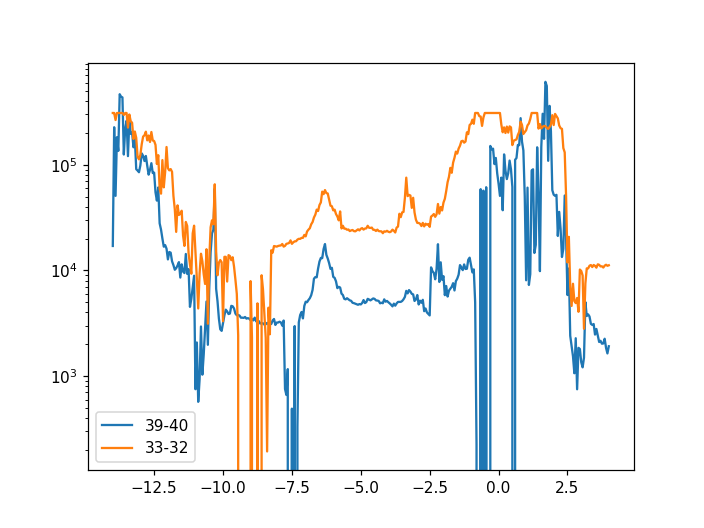

In [93]:
plt.figure()
plt.semilogy(data168.srframe_volt_p1_set, npd.Rxxfromdata(data168, 0.5e-9, 'lockin865'), label='39-40')
plt.semilogy(data168.srframe_volt_p1_set, npd.Rxxfromdata(data168, 0.5e-9, 'lockin830'), label='33-32')

plt.legend()

In [94]:
srframe.volt_p1(-14)
time.sleep(25)
bgvals = np.linspace(-14, 4, 361)
data169, plot169 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_41-42__830_29-30_0p5nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-06-16 23:09:15
DataSet:
   location = 'data/2020-06-16/#004_M30_baseT_865_41-42__830_29-30_0p5nA_backgate_23-09-15'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (361,)
   Measured | lockin865_X         | X            | (361,)
   Measured | lockin865_Y         | Y            | (361,)
   Measured | lockin830_X         | X            | (361,)
   Measured | lockin830_Y         | Y            | (361,)
Finished at 2020-06-16 23:16:44


<IPython.core.display.Javascript object>


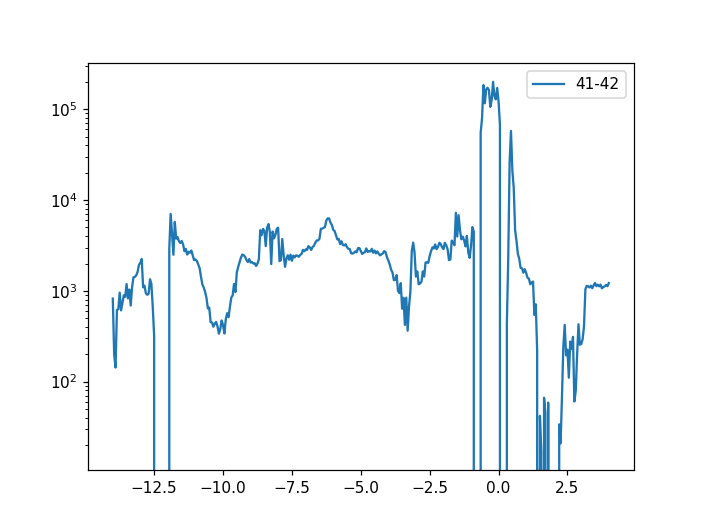

In [95]:
plt.figure()
plt.semilogy(data169.srframe_volt_p1_set, npd.Rxxfromdata(data169, 0.5e-9, 'lockin865'), label='41-42')

plt.legend()

In [96]:
srframe.volt_p1(-14)
time.sleep(25)
bgvals = np.linspace(-14, 4, 361)
data170, plot170 = npd.single_param_sweep(srframe.volt_p1, bgvals, 1.1, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, DataName='M30_baseT_865_38-39__830_29-28_0p5nA_backgate', YParam=[lockin865.X, lockin830.X])
srframe.volt_p1(0)

Started at 2020-06-16 23:22:09
DataSet:
   location = 'data/2020-06-16/#005_M30_baseT_865_38-39__830_29-28_0p5nA_backgate_23-22-09'
   <Type>   | <array_id>          | <array.name> | <array.shape>
   Setpoint | srframe_volt_p1_set | volt_p1      | (361,)
   Measured | lockin865_X         | X            | (361,)
   Measured | lockin865_Y         | Y            | (361,)
   Measured | lockin830_X         | X            | (361,)
   Measured | lockin830_Y         | Y            | (361,)
Finished at 2020-06-16 23:29:39


In [ ]:
bgvals = np.linspace(-14, 7, 337)
tgvals = np.linspace(-1.7, 1.5, 193)
srframe.volt_p1(-14)
srdc.volt(-1.7)
time.sleep(30)
data171, plot171 = npd.twod_param_sweep(srdc.volt, tgvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=25, SetDelay2=1.1, Param2_SetBetween=0, DataName='M30_865_38-39__830_29-28_0p5nA_2dgatesweep_baseT')
srdc.volt(0)
srframe.volt_p1(0)

Started at 2020-06-16 23:31:29


In [ ]:
bgvals = np.linspace(-9, 9, 289)
tgvals = np.linspace(-2.4, -1.7, 43)
srframe.volt_p1(-9)
srdc.volt(-2.4)
time.sleep(30)
data172, plot172 = npd.twod_param_sweep(srdc.volt, tgvals, srframe.volt_p1, bgvals, lockin865.X, lockin865.Y, lockin830.X, lockin830.Y, SetDelay1=25, SetDelay2=1.1, Param2_SetBetween=0, DataName='M30_865_38-39__830_29-28_0p5nA_2dgatesweep_baseT')
srdc.volt(0)
srframe.volt_p1(0)